# FAR + FedFDP: Fairness-Aware Robust Aggregation and Fairness-Aware DP Federated Learning

This notebook evaluates **FAR-CM(NNM)** (Byzantine-robustness/fairness trade-off via a
distance-weighted aggregator) and a **genuine implementation of FedFDP** (Ling et al.,
2024) side by side, on non-IID **MNIST and Fashion-MNIST**, with and without Byzantine
attacks and under a differential-privacy sweep. All experiments are averaged over
multiple random seeds (`SEEDS`); no single-seed mode is supported.

## What changed in this revision

Earlier versions of this notebook used a placeholder called **"FedFair+DP"** —
q-FFL-style server-side loss reweighting bolted onto vanilla DP-SGD — explicitly
labeled as *not* a reproduction of FedFDP. This revision replaces that placeholder
with a real implementation of both algorithms from Ling et al., 2024:

- **FedFair (Algorithm 1, no DP):** the per-batch dynamic learning rate
  `eta_i = eta*(1 + lambda*Delta_i)`, `Delta_i = F_i(w_i_t, batch) - F(w_t)`, with
  `F(w_t)` the server-broadcast weighted-mean loss from the previous round
  (`compute_local_update_fedfair_true`).
- **FedFDP (Algorithm 2, with DP):** fairness-aware per-sample gradient clipping
  (`C_t^{i,j} = min(1+lambda*Delta_i^j, C/||grad F_i||)`, Eq. 11-13), an adaptively
  clipped and separately DP-noised uploaded loss (Eq. 14-15), and RDP composition of
  both channels into one `(epsilon, delta)` budget (Theorem 4)
  (`compute_local_update_fedfdp`, `calibrate_noise_multiplier_fedfdp`).

The notebook's older q-FFL-style aggregation (Li, Sanjabi & Smith, 2020) is **kept**,
but renamed to `q-FFL (Li et al. 2020)` — it is one of FedFDP's own six baselines
(Section 7.1), so keeping it alongside the real FedFair/FedFDP gives a more complete,
paper-consistent comparison rather than removing information.

This notebook also adds a full **Fashion-MNIST** run (Experiment 4) through the same
pipeline (non-IID Dirichlet split, multi-seed, fairness metrics, Byzantine attacks, DP
sweep), using a dedicated architecture (`FashionCNN`, see the Model Selection cell)
rather than assuming the MNIST CNN transfers unchanged.

See the **Publication Audit** section near the end for a full list of correctness
issues found and fixed during this revision (privacy-accounting bugs, an unweighted
FedAvg baseline vs. the papers' `p_i`-weighted definition, a BatchNorm/per-sample-
gradient incompatibility that was avoided, etc.), each with a scientific-impact
explanation.

## Experiment map

- **Experiments 1 & 2** (no DP): sweep `FAR_ALPHAS` (fairness regime `alpha > 0` vs.
  robustness regime `alpha < 0`) alongside **FedAvg**, **q-FFL**, and the real
  **FedFair**, on non-IID data with and without Byzantine attacks.
- **Experiment 3** (DP sweep): compares **FedAvg+DP-SGD**, **q-FFL+DP-SGD**, the
  `FAR_ALPHAS` sweep of **FAR-CM(NNM)+DP-SGD**, and the real **FedFDP** (fair-clipping
  + dual-channel DP).
- **Experiment 4**: repeats Experiments 1-3 on **Fashion-MNIST**.

`CM` and `CM(NNM)` (the FAR aggregator's robust base estimator) are implemented and
used internally by `far_aggregate`; they are also exposed as standalone aggregators
in `federated_train` for ablations but are not part of the default experiments below.

- **`far_aggregate`** implements Algorithm 1 / Eq. (1) of the FAR paper:
  `lambda_i ∝ exp(alpha * ||g_i - g_F||)`, where `g_F` is the CM(NNM) robust estimate.
  `alpha > 0` *upweights* gradients that deviate most from `g_F` (the **fairness**
  regime); `alpha < 0` *downweights* them (the **robustness** regime). `FAR_ALPHAS`
  sweeps both regimes.

**Training tracking:** metrics are logged every `EVAL_INTERVAL` rounds (plus the final
round) via `print_training_log()`, heatmaps, and annotated accuracy curves.

**DP-SGD (non-FedFDP methods):** per-sample gradient clipping `g <- g / max(1, ||g||/C)`
plus Gaussian noise `N(0, sigma^2 C^2 I)`, with `sigma` calibrated to `(epsilon_dp,
delta)`-DP via RDP accounting (`calibrate_noise_multiplier`).

**FedFDP DP:** fair-clipping (not uniform clipping) on the gradient channel, plus a
*second*, separately calibrated noise multiplier `sigma_l` on the adaptively-clipped
loss channel; both channels' RDP costs are composed before conversion to
`(epsilon_dp, delta)` (`calibrate_noise_multiplier_fedfdp`).

**Fairness metric (Ψ):** alongside the accuracy-based fairness metrics (variance,
worst-20%, gap), we track the **balanced performance fairness Ψ(w)** from Ling et al.,
2024 (Eq. 2): the weighted variance of each honest client's local loss `F_k(w)` around
the global weighted-mean loss `F(w) = sum_k p_k F_k(w)`. Lower Ψ means the global model
performs more uniformly across clients. `plot_psi_progress()` / `plot_psi_bar()` (and
their `_band` variants) compare Ψ across algorithms. **Note:** Ψ is always computed
from a clean (non-DP-noised) forward pass at evaluation time, for every method
including FedFDP — this is an evaluation-time diagnostic, not the value any client
actually uploads; FedFDP's own DP-protected per-round loss estimate is the separate
`F~_i` quantity produced by `compute_local_update_fedfdp` and used only for that
method's own fair-clipping mechanism, never for this shared Ψ metric. Using the same
clean-Ψ definition for every method keeps the fairness comparison apples-to-apples.

**Reproducibility:** every source of randomness (model initialization, minibatch order,
Byzantine client sampling, DP noise, and — optionally — the client data partition) is
controlled exclusively through the `SEEDS` list defined in the Configuration cell; see
[Multi-Seed Simulations](#Multi-Seed-Simulations) below.

**Scope and paper-fidelity notes** (this notebook is a scaled-down, CPU-runnable
reproduction, not a byte-for-byte replication of either paper's experiments):
- **Client scale.** The FAR paper's Table 1/2 results use n=25 clients with m=5
  Byzantine (20 honest); the FedFDP paper uses n=10 clients (0 Byzantine — FedFDP does
  not model Byzantine adversaries at all, see below). This notebook defaults to
  `N_CLIENTS=10`, `N_BYZANTINE=2` (8 honest) for FAR-style experiments — the same
  Byzantine *fraction* (20%) as the FAR paper but a much smaller absolute client pool,
  tuned for a CPU-only run. This directly affects the achievable granularity of the
  Worst-20%/Best-20% metrics (see the k-rounding note printed at dataset-load time).
- **FedFDP has no Byzantine-robustness mechanism.** The FedFDP paper's threat model is
  privacy + fairness only — it assumes honest-but-curious clients and an honest server,
  with no adversarial gradient manipulation. When `federated_train('fedfdp', ...,
  attack='ipm')` (or `'bitflip'`) is invoked in this notebook, Byzantine deltas are
  injected using this notebook's own convention (mean-honest-weight placeholder before
  weighted aggregation, see the code comment in `federated_train`) purely so the
  experiment doesn't crash — this is **not** part of FedFDP's design and any resulting
  numbers should be read as "what happens if FedFDP's mechanism is stress-tested
  outside its intended threat model," not as a claim from the paper. Experiment 3/4's
  FedFDP comparisons default to `attack='none'`, matching the paper's own setting.
- **Attack coverage.** The FAR paper's theoretical robustness bound (Lemma 4.3,
  Theorem 4.4) is derived specifically for the MinMax/MinSum stealthy attacks of
  Shejwalkar & Houmansadr, 2021. This notebook implements IPM and BitFlip (both used
  in the FAR paper's experiments) plus a no-attack condition, but not MinMax/MinSum/
  ALIE — so none of the attacks actually run here are the ones the paper's convergence
  theorem is proved for. Empirical results should be read as evidence about IPM/
  BitFlip specifically, not as a validation of Theorem 4.4's stealthy-attack bound.
- **Local training procedure.** The FAR paper's convergence analysis (Theorem 4.4) is
  stated for distributed GD with a single gradient step per round. This notebook, like
  most practical FL implementations, instead runs `LOCAL_EPOCHS` epochs of minibatch
  SGD per round and treats the accumulated parameter delta as the aggregated
  "gradient" — a standard FedAvg-style local-SGD practice, but a departure from the
  single-step setting the theorem is proved under.
- **`p_i`-weighting.** FedFair/FedFDP's own algorithms (Eq. 1, Algorithm 1 line 6,
  Algorithm 2 line 5) define server aggregation as a **dataset-size-weighted** mean
  `sum_i p_i * w_i`, `p_i = |D_i|/|D|`, and this notebook's `fedfair_true`/`fedfdp`
  aggregation branches implement exactly that. The notebook's *other* baselines
  (`fedavg`, `cm`, `cm_nnm`, `far_cm_nnm`, `qffl`) use an **unweighted** mean over
  clients — a simplification present in this notebook independent of this revision
  (FAR's own Algorithm 1/Eq. 1 also technically calls for `p_i` weights); flagged
  explicitly here and in the Publication Audit rather than silently left as-is.


In [ ]:
import os
import json
import math
import hashlib
import pickle
import warnings
from collections import defaultdict

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from torch.func import grad as func_grad, grad_and_value, vmap, functional_call  # per-sample gradients; requires torch>=2.0

warnings.filterwarnings('ignore')

# ============================================================================
# CONFIGURATION -- every parameter / constant used anywhere in this notebook
# is defined here, and ONLY here. Every other cell reads these as globals
# instead of hardcoding its own copy, so changing a value in THIS CELL and
# re-running the notebook top-to-bottom is always enough -- no other cell
# needs to be touched.
# ============================================================================

# --- Device -------------------------------------------------------------
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# --- Dataset selection ----------------------------------------------------
# 'mnist' or 'fashion_mnist'. Call load_dataset_globals(name) (defined in the
# Setup cell) to (re)build every dataset-dependent global -- X_train/X_test,
# client_indices, DP_STEPS/DP_SAMPLE_RATE, and MODEL_CLASS (see the Model
# Selection markdown cell for why Fashion-MNIST gets its own architecture).
# The notebook loads MNIST at import time (Setup cell) and switches to
# Fashion-MNIST explicitly in the Experiment 4 section; every experiment
# cell only ever reads the *current* value of these globals, so nothing
# else needs to change when switching datasets.
DATASET = 'mnist'

# --- Federated learning setup --------------------------------------------
N_CLIENTS    = 10
N_BYZANTINE  = 2
N_HONEST     = N_CLIENTS - N_BYZANTINE
BETA         = 0.1     # Dirichlet non-IID concentration (smaller = more skewed)
N_ROUNDS     = 40
LR           = 0.01
LOCAL_EPOCHS = 2
BATCH_SIZE   = 64
FAR_ALPHA    = 0.1

# FedFair (q-FFL variant): exponent q in the q-FFL fairness objective (Li et
# al., 2020, "Fair Resource Allocation in Federated Learning"). Local updates
# are reweighted by F_k(w_t)^q so clients with higher current loss get more
# influence on the aggregate; q=0 recovers plain FedAvg, larger q pushes
# harder for uniform accuracy across clients. This is the q-FFL BASELINE
# used by the FedFDP paper (Section 7.1's six baselines) -- it is a
# different algorithm from "FedFair" as defined in Ling et al., 2024
# (Algorithm 1's dynamic learning rate), which is implemented separately
# below as `compute_local_update_fedfair_true` / aggregation 'fedfair_true'.
FEDFAIR_Q    = 1.0

# Byzantine attack strength, used wherever an IPM attack is run (attack_ipm,
# get_byzantine_gradients, federated_train, run_seeds_parallel, and the
# explicit Experiment 2/3 IPM calls below).
IPM_EPSILON  = 1.0

# Client-level fairness metrics: fraction of honest clients used to compute
# the Worst-k / Best-k / accuracy-gap metrics (compute_fairness_metrics).
FAIRNESS_K_FRAC = 0.20

# --- DP-SGD ----------------------------------------------------------------
CLIP_NORM    = 1.0
DELTA        = 1e-5

# Evaluate & log metrics every EVAL_INTERVAL rounds (plus the final round).
EVAL_INTERVAL = 2

# Dataset subsampling (see subsample_train_test() below) -- the single
# biggest lever for CPU runtime, since every round loops over every client's
# full local dataset. Set to None to use the full 60k/10k split.
# NOTE: both values must stay <= the full split sizes (60000 / 10000);
# subsample_train_test() silently falls back to the full split otherwise,
# which defeats the point of subsampling and can blow well past the CPU
# runtime budget below.
TRAIN_SUBSET_SIZE = 100000
TEST_SUBSET_SIZE  = 20000

HONEST_IDS    = list(range(N_HONEST))
BYZANTINE_IDS = list(range(N_HONEST, N_CLIENTS))

# FAR temperature sweep: alpha controls how sharply far_aggregate() grows (or
# decays, for negative alpha) a client's weight with its distance from the
# CM(NNM) robust estimate g_F (log_w = alpha * deviations, matching
# Algorithm 1 / Eq. 1 of the FAR paper). alpha > 0 -> fairness regime (benign
# outliers, e.g. non-IID minority clients, are amplified). alpha < 0 ->
# robustness regime (outliers, malicious or noisy, are suppressed more
# aggressively than the base robust_fn alone). FAR_ALPHAS sweeps a full
# range of both signs and magnitudes so every FAR variant in that
# trade-off space gets its own curve.
FAR_ALPHAS = [-1.5, -0.5, -0.1, 0.1, 0.4, 1.0]

# Single representative alpha (fairness regime) used by the per-client
# "spotlight" plots (plot_per_client_accuracy_bars, plot_client_heatmap,
# plot_fairness_advantage) so only one FAR curve is highlighted in detail
# instead of all len(FAR_ALPHAS) of them. Must be present in FAR_ALPHAS.
FAR_HIGHLIGHT_ALPHA = 0.1
assert FAR_HIGHLIGHT_ALPHA in FAR_ALPHAS, 'FAR_HIGHLIGHT_ALPHA must be one of FAR_ALPHAS.'

# --- FedFair / FedFDP (Ling et al., 2024) hyperparameters -------------------
# lambda: the fairness hyperparameter shared by BOTH real algorithms from the
# FedFDP paper implemented in this notebook -- FedFair's non-DP dynamic
# learning rate (eta_i = eta*(1+lambda*Delta_i), Eq. 8-9) and FedFDP's DP
# fair-clipping coefficient (Eq. 13). The paper derives a closed-form
# "optimal" lambda* (Section 5.1) but only as a function of unknown-in-
# practice constants (L, mu, G, Gamma) it does not report numerically for
# our setting; the paper's own practical experiments (Fig. 2) instead sweep
# lambda empirically. We use a single fixed, modest value here rather than
# reproducing that unreported closed form, and document the ablation gap.
FEDFDP_LAMBDA = 0.1

# Cl: INITIAL clipping bound for FedFDP's uploaded-loss channel, C_l^{i,0}
# (paper default Cl=2.5, Section 7.1). The adaptive rule (Eq. 14-15) only
# defines C_l^{i,t} for t>=1, recursively from the *previous* round's
# clipped losses; round 0 has no previous round, so a seed value is
# required and is not itself specified by a formula in the paper -- we use
# the paper's own reported default clipping bound as that seed.
FEDFDP_CL_INIT = 2.5

# sigma_l / sigma ratio for FedFDP's loss-privacy channel, taken directly
# from the paper's own default hyperparameters (Section 7.1: sigma=2.0,
# sigma_l=5.0 -> ratio 2.5). Used so a single scalar privacy-budget sweep
# (EPSILON_DP_VALUES) can jointly calibrate both channels' noise
# multipliers while preserving the *relative* noise level the paper found
# sensible, rather than deriving separate optimal sigma/sigma_l for each
# (epsilon, delta) pair from scratch -- the paper provides no closed-form
# method for that joint calibration. See calibrate_noise_multiplier_fedfdp
# and the Publication Audit for the full reasoning.
FEDFDP_SIGMA_L_RATIO = 2.5

# --- Multi-seed evaluation --------------------------------------------------
# All randomness in this notebook (model init, minibatch order, Byzantine
# sampling, DP noise, and -- optionally -- the client data partition) is
# controlled exclusively through SEEDS: every experiment trains one
# independent run per seed and reports the mean +/- std across seeds. Add or
# remove seeds to trade off statistical reliability against wall-clock time.
SEEDS = [28, 36, 54]
assert len(SEEDS) >= 2, 'SEEDS must contain at least two seeds for multi-seed evaluation.'

# Seed used to build the single shared client data partition (Dirichlet split
# and dataset subsampling) when RESAMPLE_PARTITION_PER_SEED=False. Derived
# from SEEDS so no separate seed variable needs to be maintained.
PARTITION_SEED = SEEDS[0]

# Number of simulations to run at once. None -> use min(len(seeds), cpu_count).
# Parallelism only helps on CPU: forking a process that already holds a live
# CUDA context is unsafe, so run_seeds_parallel() automatically falls back to
# running seeds one at a time whenever DEVICE is a CUDA device.
N_JOBS = None

# If True, every seed also redraws its own Dirichlet client partition
# (dirichlet_split) instead of reusing the single shared partition built in
# the Setup cell below, so run-to-run variance captures "which clients ended
# up minority clients" too (at the cost of a per-seed DP noise recalibration
# to match that seed's client sizes). Default False: only training-time
# randomness (model init, batch order, Byzantine draws, DP noise) varies
# across seeds -- the usual choice, since it asks "does this algorithm
# behave consistently across random restarts?" while keeping every seed's
# data split identical and comparable.
RESAMPLE_PARTITION_PER_SEED = False

# --- Differential-privacy sweep (Experiment 3) ------------------------------
# Privacy budgets swept in Experiment 3. None = no DP (plain SGD).
EPSILON_DP_VALUES = [3.56, None]

# --- Local result caching ---------------------------------------------------
# Every individual simulation (one seed, one algorithm/alpha, one attack
# setup, one epsilon_dp value, with a given n_rounds/lr/etc., on a given
# DATASET) is cached to disk the first time it's run. Re-running this
# notebook (or just re-running a later cell) will detect an already-saved
# result and load it instantly instead of retraining. Delete a file (or the
# whole folder) to force a specific simulation to be recomputed, or use
# clear_cache() defined below.
CACHE_DIR  = os.path.join('.', 'sim_cache')  # folder where per-simulation results are saved
USE_CACHE  = True            # set False to always retrain and ignore any cache
os.makedirs(CACHE_DIR, exist_ok=True)

print(f'Using device: {DEVICE}')
print(f"Result cache: '{CACHE_DIR}' (enabled={USE_CACHE}, "
      f"{len(os.listdir(CACHE_DIR)) if os.path.isdir(CACHE_DIR) else 0} cached result(s) found)")


Using device: cuda
Result cache: '/content/drive/MyDrive/sim_cache' (enabled=True, 150 cached result(s) found)


In [ ]:
# Each entry is (aggregation_name, alpha, mu):
#   - alpha is reused as: the FAR temperature for 'far_cm_nnm', the q-FFL
#     exponent for 'qffl', and the fairness hyperparameter lambda for
#     'fedfair_true' (real FedFair, Algorithm 1 of Ling et al., 2024). It is
#     unused by 'fedavg' (kept at 0.0 there for clarity).
#   - mu is the proximal-term coefficient applied during local training
#     (see compute_local_update). It is 0.0 for every method below,
#     INCLUDING 'far_cm_nnm'.
#
#     NOTE -- paper-consistency caveat: the FAR paper's Algorithm 1 (line 3)
#     explicitly includes a FedProx-style proximal term `mu` as part of FAR's
#     own local update, "to stabilize training under heterogeneous data"
#     (Section 3). Setting mu=0.0 here means FAR is run WITHOUT that
#     component -- this is a real simplification relative to the paper, not
#     a neutral/faithful default, and should be disclosed as such rather
#     than treated as dead configuration. The `mu>0` code path exists and is
#     exercised correctly in `compute_local_update`/`compute_local_update_dp`
#     (see the proximal penalty term added there); it is simply never
#     activated by any entry in this METHODS dict. The paper does not state
#     a specific numeric value for mu in the main text, so no value is
#     substituted here -- a future revision wanting full paper fidelity for
#     FAR should set mu>0 for 'far_cm_nnm' and tune/report that value
#     explicitly rather than leaving it implicit at 0.
METHODS = {'FedAvg': ('fedavg', 0.0, 0.0)}
for _a in FAR_ALPHAS:
    METHODS[f'FAR-CM(NNM) α={_a:g}'] = ('far_cm_nnm', _a, 0.0)
# q-FFL (Li et al., 2020) -- one of FedFDP's own six baselines (Section 7.1);
# aggregation key renamed from the old 'fedfair' to 'qffl' to free up the
# 'FedFair' name for the REAL algorithm below.
METHODS['q-FFL (Li et al. 2020)'] = ('qffl', FEDFAIR_Q, 0.0)
# FedFair (Ling et al., 2024, Algorithm 1) -- the genuine per-batch dynamic
# learning rate eta_i = eta*(1+lambda*Delta_i) mechanism, WITHOUT DP. This is
# the non-private predecessor that FedFDP (Experiment 3/4's DP_METHODS)
# extends with fairness-aware clipping + dual-channel DP.
METHODS['FedFair (Ling et al. 2024)'] = ('fedfair_true', FEDFDP_LAMBDA, 0.0)

# Name of the single FAR variant highlighted by the per-client "spotlight"
# plots (see FAR_HIGHLIGHT_ALPHA in the Configuration cell).
FAR_HIGHLIGHT_METHOD = f'FAR-CM(NNM) α={FAR_HIGHLIGHT_ALPHA:g}'


## Model Selection — MNIST vs. Fashion-MNIST

**Is the same CNN adequate for both datasets?** No — this notebook uses two
architectures, selected explicitly rather than assumed:

- **MNIST → `CNN`** (unchanged from earlier revisions): a plain two-conv-block
  LeNet-style network. MNIST digit classes are visually well-separated (few
  confusable pairs), so this small, unregularized architecture already
  reaches high, stable accuracy — including under this notebook's non-IID
  splits, Byzantine attacks, and DP-SGD noise — without needing extra
  capacity or regularization. Adding BatchNorm/Dropout/width here would not
  meaningfully change results and would only add runtime cost, so `CNN` is
  kept as the lean MNIST default.

- **Fashion-MNIST → `FashionCNN`** (new): Fashion-MNIST's ten classes include
  visually confusable groups (shirt / pullover / coat / T-shirt), which is
  precisely why the FedFDP paper itself already reports a visibly wider
  accuracy spread and harder-to-fit numbers on FashionMNIST than on MNIST
  using the *same* architecture family across datasets (its Table 2-3).
  Layering this notebook's non-IID Dirichlet splits, Byzantine attacks, and
  DP-SGD gradient noise on top of that harder base classification problem
  compounds the difficulty. `FashionCNN` keeps the same two-conv-block
  backbone (so parameter count / compute stays the same order of magnitude
  as `CNN` — important for keeping DP-SGD's per-sample-clipping behavior and
  this notebook's CPU runtime budget comparable across datasets) and adds:
  1. **GroupNorm** after each conv block, instead of the more common
     BatchNorm — chosen *specifically* because this notebook's DP-SGD paths
     compute per-sample gradients via `torch.func.vmap`, which requires a
     forward pass that doesn't mix information across examples in a batch.
     BatchNorm does mix across the batch and would silently produce
     incorrect per-sample gradients under `vmap`; GroupNorm normalizes each
     example independently and has no such issue. This is the same reason
     DP-SGD libraries such as Opacus replace BatchNorm with GroupNorm.
  2. **Dropout** before the final classifier, to reduce overfitting on the
     harder task given this notebook's small per-client data shards
     (`TRAIN_SUBSET_SIZE`-sized, split `N_CLIENTS`-ways).
  3. **A wider first fully-connected layer** (256 vs. 120 units) for a
     modest capacity increase.

  `load_dataset_globals()` sets the module-level `MODEL_CLASS` to `FashionCNN`
  automatically whenever `DATASET == 'fashion_mnist'`; every training/eval
  function in this notebook reads `MODEL_CLASS` rather than hardcoding `CNN`,
  so no other cell needs to change when switching datasets.

**What we do *not* claim:** this is a documented, reasonable minimal fix
(normalization + regularization for a harder task), not a claim that
`FashionCNN`'s specific hyperparameters (group counts, FC width, dropout
rate) are individually tuned or optimal. No formal architecture search was
run; a production or thesis-grade follow-up wanting a stronger Fashion-MNIST
baseline should treat these as a reasonable starting point, not a ceiling.


In [ ]:
def load_dataset(name):
    """Download + tensorize either MNIST or Fashion-MNIST. Per-dataset
    normalization statistics (mean/std) are the standard values used
    throughout the torchvision/PyTorch community for each dataset."""
    if name == 'mnist':
        ds_cls = torchvision.datasets.MNIST
        mean, std = (0.1307,), (0.3081,)
    elif name == 'fashion_mnist':
        ds_cls = torchvision.datasets.FashionMNIST
        mean, std = (0.2860,), (0.3530,)
    else:
        raise ValueError(f"Unknown dataset '{name}' -- expected 'mnist' or 'fashion_mnist'.")

    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ])
    train_ds = ds_cls('./data', train=True,  download=True, transform=transform)
    test_ds  = ds_cls('./data', train=False, download=True, transform=transform)

    def _extract(ds):
        loader = torch.utils.data.DataLoader(ds, batch_size=1024, shuffle=False)
        xs, ys = zip(*[(xb, yb) for xb, yb in loader])
        return torch.cat(xs), torch.cat(ys)

    return _extract(train_ds) + _extract(test_ds)


def subsample_train_test(X_train, y_train, X_test, y_test, n_train=None, n_test=None, seed=None):
    """Class-stratified subsampling helper for fast train/test subsets.

    Shrinks both splits down to `n_train` / `n_test` examples while keeping
    the per-class balance roughly intact (so the shrunk set still exercises
    all 10 classes). Pass `n_train=None` (or `n_test=None`) to leave that
    split untouched. This is the main lever for making the whole notebook
    finish quickly on CPU -- every federated round loops over every client's
    full local slice of X_train, so cutting the train set size cuts runtime
    almost linearly.
    """
    rng = np.random.default_rng(seed)

    def _stratified_idx(y, n):
        if n is None or n >= len(y):
            return np.arange(len(y))
        y_np = y.numpy()
        classes = np.unique(y_np)
        per_class = max(1, n // len(classes))
        idx_parts = []
        for c in classes:
            c_idx = np.where(y_np == c)[0]
            rng.shuffle(c_idx)
            idx_parts.append(c_idx[:per_class])
        idx = np.concatenate(idx_parts)
        rng.shuffle(idx)
        return idx[:n]

    train_idx = _stratified_idx(y_train, n_train)
    test_idx = _stratified_idx(y_test, n_test)
    return X_train[train_idx], y_train[train_idx], X_test[test_idx], y_test[test_idx]


def dirichlet_split(y_train, n_clients, beta, seed=None):
    rng = np.random.default_rng(seed)
    n_classes = int(y_train.max().item()) + 1
    label_indices = [np.where(y_train.numpy() == c)[0] for c in range(n_classes)]
    client_indices = [[] for _ in range(n_clients)]
    for c in range(n_classes):
        idx = label_indices[c]
        rng.shuffle(idx)
        proportions = rng.dirichlet(np.repeat(beta, n_clients))
        splits = (np.cumsum(proportions) * len(idx)).astype(int)[:-1]
        for i, chunk in enumerate(np.split(idx, splits)):
            client_indices[i].extend(chunk.tolist())
    return [np.array(idx) for idx in client_indices]


def load_dataset_globals(name, seed=None):
    """(Re)build every dataset-dependent global for `name` ('mnist' or
    'fashion_mnist'): raw + subsampled train/test tensors, the Dirichlet
    client partition, the numpy views used by training/eval, and the model
    class (see the Model Selection markdown cell for why Fashion-MNIST gets
    its own architecture, `FashionCNN`).

    Does NOT recompute DP_STEPS/DP_SAMPLE_RATE (average client size can
    change slightly with a new partition) -- call `recompute_dp_accounting()`
    (defined in the DP-accounting cell, which depends on functions not yet
    defined at this point in the notebook) right after this if DP experiments
    will be run on the new dataset. The initial MNIST load at the bottom of
    the Model cell below does this in the correct order; the Fashion-MNIST
    experiment section does the same explicitly.
    """
    global DATASET, X_train, y_train, X_test, y_test, client_indices
    global X_train_np, y_train_np, X_test_np, y_test_np, MODEL_CLASS

    seed = seed if seed is not None else PARTITION_SEED
    DATASET = name
    Xtr, ytr, Xte, yte = load_dataset(name)
    X_train, y_train, X_test, y_test = subsample_train_test(
        Xtr, ytr, Xte, yte, n_train=TRAIN_SUBSET_SIZE, n_test=TEST_SUBSET_SIZE, seed=seed
    )
    client_indices = dirichlet_split(y_train, N_CLIENTS, BETA, seed=seed)

    # Cached numpy views of the (fixed, never-resampled) train/test tensors.
    # evaluate_all_clients() and compute_client_losses() are called once per
    # eval checkpoint, per seed, per method, per experiment -- i.e. thousands
    # of times across the notebook -- so recomputing X_train.numpy() etc. on
    # every one of those calls was pure redundant work. Computed once here.
    X_train_np, y_train_np = X_train.numpy(), y_train.numpy()
    X_test_np, y_test_np = X_test.numpy(), y_test.numpy()

    MODEL_CLASS = FashionCNN if name == 'fashion_mnist' else CNN

    print(f"[{name}] Train {tuple(X_train.shape)}, Test {tuple(X_test.shape)} | "
          f"clients: {N_CLIENTS} ({N_BYZANTINE} Byzantine) | model={MODEL_CLASS.__name__}")

    # Diagnostic: FAIRNESS_K_FRAC is a *target* fraction of honest clients used
    # for the Worst-k / Best-k / gap metrics: k = max(1, round(N_HONEST * FAIRNESS_K_FRAC)).
    # With small N_HONEST this rounds to a coarse client count, so the metric
    # labelled e.g. "Worst-20%" may in practice average fewer (or more) than
    # exactly 20% of clients. Printed here so the actual k/N is on record.
    _fair_k = max(1, round(N_HONEST * FAIRNESS_K_FRAC))
    print(f'Fairness worst-k/best-k metrics: k={_fair_k} of {N_HONEST} honest clients '
          f'(target {FAIRNESS_K_FRAC:.0%}, actual {_fair_k / N_HONEST:.1%})')


In [ ]:
class CNN(nn.Module):
    """MNIST model: a plain LeNet-style CNN. See the 'Model Selection'
    markdown cell below for why this architecture is judged adequate for
    MNIST but not reused as-is for Fashion-MNIST."""
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 16, 5)
        self.pool  = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(16, 32, 5)
        self.fc1   = nn.Linear(32 * 4 * 4, 120)
        self.fc2   = nn.Linear(120, 84)
        self.fc3   = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        return self.fc3(x)


class FashionCNN(nn.Module):
    """Dedicated architecture for Fashion-MNIST -- see the 'Model Selection'
    markdown cell for the full rationale. Summary: Fashion-MNIST's classes
    (shirt/pullover/coat/...) are visually far more confusable than MNIST's
    digits, and this notebook additionally stacks non-IID client splits,
    Byzantine attacks, and DP noise on top -- all three make an
    already-marginal architecture's optimization landscape rougher. This
    keeps the same two-conv-block backbone as `CNN` (similar parameter
    count/compute, so DP-SGD's per-sample clipping behavior and this
    notebook's CPU runtime budget stay comparable) but adds normalization,
    dropout, and a wider first FC layer.

    Uses GroupNorm, NOT BatchNorm: this notebook's DP-SGD paths
    (`compute_local_update_dp`, `compute_local_update_fedfdp`) compute
    PER-SAMPLE gradients via `torch.func.vmap`, which requires the forward
    pass to be a pure per-example function with no dependence on other
    examples in the same batch. BatchNorm violates this -- under vmap each
    "sample" is processed as if it were its own batch of size 1, so
    BatchNorm's batch statistics become meaningless and its per-sample
    gradients would be silently wrong (this is the same reason the DP-SGD
    literature and libraries like Opacus generally replace BatchNorm with
    GroupNorm/LayerNorm for private training). GroupNorm normalizes each
    example independently, so it is exactly per-sample-gradient-safe, and is
    used here for BOTH the non-DP and DP-SGD/FedFDP training paths so that
    switching epsilon_dp on/off never silently changes the architecture's
    semantics. Dropout is likewise only exercised correctly under
    `torch.func.vmap` because the DP-SGD local-update functions below call
    `vmap(..., randomness='different')`, which gives every vmapped "sample"
    lane its own independent dropout mask (torch.func's documented, supported
    way to combine vmap with stochastic layers).
    """
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 16, 5)
        self.gn1   = nn.GroupNorm(4, 16)
        self.pool  = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(16, 32, 5)
        self.gn2   = nn.GroupNorm(8, 32)
        self.fc1   = nn.Linear(32 * 4 * 4, 256)
        self.drop  = nn.Dropout(0.3)
        self.fc2   = nn.Linear(256, 84)
        self.fc3   = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.gn1(self.conv1(x))))
        x = self.pool(F.relu(self.gn2(self.conv2(x))))
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.drop(x)
        x = F.relu(self.fc2(x))
        return self.fc3(x)


def get_flat_params(model):
    return np.concatenate([p.data.cpu().numpy().ravel() for p in model.parameters()])


def set_flat_params(model, params):
    offset = 0
    for p in model.parameters():
        size = p.numel()
        p.data.copy_(torch.tensor(params[offset:offset + size].reshape(p.shape), dtype=torch.float32))
        offset += size


def _flat_grad(model):
    return torch.cat([
        p.grad.flatten() if p.grad is not None else torch.zeros(p.numel(), device=DEVICE)
        for p in model.parameters()
    ])


def _apply_flat_grad(model, flat_grad, lr):
    offset = 0
    with torch.no_grad():
        for p in model.parameters():
            size = p.numel()
            p.data.sub_(lr * flat_grad[offset:offset + size].view_as(p))
            offset += size


@torch.no_grad()
def evaluate(model_or_params, X, y):
    if isinstance(model_or_params, np.ndarray):
        model = MODEL_CLASS().to(DEVICE)
        set_flat_params(model, model_or_params)
    else:
        model = model_or_params
    model.eval()
    X_t = torch.tensor(X, dtype=torch.float32, device=DEVICE)
    y_t = torch.tensor(y, dtype=torch.long, device=DEVICE)
    return (model(X_t).argmax(1) == y_t).float().mean().item() * 100.0


# --- Initial dataset load (MNIST, the notebook's default) -------------------
# Switching to Fashion-MNIST later (Experiment 4) re-calls
# load_dataset_globals('fashion_mnist') followed by recompute_dp_accounting()
# (defined in the next-but-one cell) to rebuild every dataset-dependent
# global, including MODEL_CLASS -> FashionCNN.
load_dataset_globals(DATASET, seed=PARTITION_SEED)


[mnist] Train (60000, 1, 28, 28), Test (10000, 1, 28, 28) | clients: 10 (2 Byzantine) | model=CNN
Fairness worst-k/best-k metrics: k=2 of 8 honest clients (target 20%, actual 25.0%)


In [ ]:
def compute_local_update(global_params, X_client, y_client, n_epochs=LOCAL_EPOCHS,
                           batch_size=BATCH_SIZE, lr=LR, mu=0.0):
    model = MODEL_CLASS().to(DEVICE)
    set_flat_params(model, global_params)
    model.train()
    global_tensor = torch.tensor(global_params, dtype=torch.float32, device=DEVICE)
    optimizer = torch.optim.SGD(model.parameters(), lr=lr)
    X_t = torch.tensor(X_client, dtype=torch.float32, device=DEVICE)
    y_t = torch.tensor(y_client, dtype=torch.long, device=DEVICE)
    n = len(X_t)

    # F_k(w_t): the client's local (data-only, no proximal term) loss
    # evaluated at the *current* global model, before any local steps are
    # taken. Used by q-FFL's aggregation to upweight clients that are
    # currently under-performing (Li et al., "Fair Resource Allocation in
    # Federated Learning", 2020).
    model.eval()
    with torch.no_grad():
        initial_loss = F.cross_entropy(model(X_t), y_t).item()
    model.train()

    for _ in range(n_epochs):
        perm = torch.randperm(n, device=DEVICE)
        X_t, y_t = X_t[perm], y_t[perm]
        for start in range(0, n, batch_size):
            xb, yb = X_t[start:start + batch_size], y_t[start:start + batch_size]
            optimizer.zero_grad()
            loss = F.cross_entropy(model(xb), yb)
            if mu > 0:
                local_flat = torch.cat([p.view(-1) for p in model.parameters()])
                loss = loss + (mu / 2.0) * torch.sum((local_flat - global_tensor) ** 2)
            loss.backward()
            optimizer.step()

    return global_params - get_flat_params(model), initial_loss


def compute_local_update_dp(global_params, X_client, y_client, clip_norm, sigma,
                            n_epochs=LOCAL_EPOCHS, batch_size=BATCH_SIZE, lr=LR, mu=0.0):
    """Vectorized DP-SGD local update (standard Abadi et al., 2016 DP-SGD:
    uniform per-sample clipping, Eq. 4-5 of the FedFDP paper -- this is the
    baseline gradient mechanism shared by FedAvg+DP, q-FFL+DP, and
    FAR-CM(NNM)+DP; FedFDP itself uses a DIFFERENT, fairness-aware clipping
    rule, see `compute_local_update_fedfdp` below, Eq. 11-13).

    Per-sample gradients are the classic bottleneck for DP-SGD: naively this
    needs one backward() call per example. Here we instead use `torch.func`
    (grad + vmap) to compute all per-sample gradients for a minibatch in a
    single batched call, which is dramatically faster on both CPU and GPU
    than the equivalent Python-level for-loop.
    """
    model = MODEL_CLASS().to(DEVICE)
    set_flat_params(model, global_params)
    model.train()
    global_tensor = torch.tensor(global_params, dtype=torch.float32, device=DEVICE)
    X_t = torch.tensor(X_client, dtype=torch.float32, device=DEVICE)
    y_t = torch.tensor(y_client, dtype=torch.long, device=DEVICE)
    n = len(X_t)

    # F_k(w_t) at the *current* global model, mirroring compute_local_update()
    # exactly so q-FFL's loss-reweighting has a real per-client loss to work
    # with under DP-SGD too. This forward pass is NOT itself protected by DP
    # noise -- only the returned gradient update is. This is a real,
    # documented gap relative to the real FedFDP algorithm (which is why
    # FedFDP is implemented as its own separate function below rather than
    # reusing this one): FedFDP specifically DP-protects this exact loss
    # signal via an adaptive clipping + Gaussian noise mechanism (Eq. 14-15,
    # Algorithm 2 lines 16-20) and folds its RDP cost into the reported
    # privacy budget (Theorem 4). `epsilon_dp` for FedAvg+DP/q-FFL+DP/
    # FAR+DP accounts only for gradient noise, not for this loss value.
    model.eval()
    with torch.no_grad():
        initial_loss = F.cross_entropy(model(X_t), y_t).item()
    model.train()

    params = {k: v.detach().clone() for k, v in model.named_parameters()}
    buffers = {k: v.detach().clone() for k, v in model.named_buffers()}
    param_names = list(params.keys())

    def compute_loss(params, buffers, x, y):
        x = x.unsqueeze(0)
        y = y.unsqueeze(0)
        out = functional_call(model, {**params, **buffers}, (x,))
        loss = F.cross_entropy(out, y)
        if mu > 0:
            local_flat = torch.cat([params[k].reshape(-1) for k in param_names])
            loss = loss + (mu / 2.0) * torch.sum((local_flat - global_tensor) ** 2)
        return loss

    # grad w.r.t. `params` (argnum 0) for a single example, then vmap it over
    # the batch dimension (dim 0 of x and y; params/buffers are shared -> None).
    # randomness='different' gives every vmapped "sample" lane an independent
    # RNG draw for any stochastic layer (e.g. FashionCNN's Dropout) -- with
    # the plain CNN (no stochastic layers) this flag is a no-op, but it must
    # be set for FashionCNN's per-sample gradients to be well-defined at all
    # (see the DP-SGD/GroupNorm/Dropout discussion in FashionCNN's docstring).
    per_sample_grad_fn = vmap(func_grad(compute_loss), in_dims=(None, None, 0, 0), randomness='different')

    for _ in range(n_epochs):
        perm = torch.randperm(n, device=DEVICE)
        X_t, y_t = X_t[perm], y_t[perm]
        for start in range(0, n, batch_size):
            xb, yb = X_t[start:start + batch_size], y_t[start:start + batch_size]
            batch_len = xb.size(0)

            per_sample_grads = per_sample_grad_fn(params, buffers, xb, yb)
            # Flatten each parameter's per-sample grad to (batch_len, dim) and
            # concatenate across parameters -> (batch_len, total_dim).
            flat = torch.cat(
                [per_sample_grads[k].reshape(batch_len, -1) for k in param_names], dim=1
            )
            norms = flat.norm(dim=1, keepdim=True)
            scale = (clip_norm / (norms + 1e-12)).clamp(max=1.0)
            clipped = flat * scale                       # (batch_len, dim), vectorized clip

            avg_grad = clipped.mean(0)
            # Noise scaled by 1/L (batch size), matching standard DP-SGD which
            # divides the noised SUM of clipped per-sample grads by L.
            noise = torch.randn_like(avg_grad) * (sigma * clip_norm / batch_len)
            noised = avg_grad + noise

            offset = 0
            with torch.no_grad():
                for k in param_names:
                    numel = params[k].numel()
                    update = noised[offset:offset + numel].view(params[k].shape)
                    params[k] = params[k] - lr * update
                    offset += numel

    with torch.no_grad():
        for p, k in zip(model.parameters(), param_names):
            p.copy_(params[k])

    return global_params - get_flat_params(model), initial_loss


def compute_local_update_fedfair_true(global_params, X_client, y_client, lam, F_global,
                                       n_epochs=LOCAL_EPOCHS, batch_size=BATCH_SIZE, lr=LR):
    """Client-side local update for the REAL FedFair algorithm (Ling et al.,
    2024, Algorithm 1 / Eq. 6-9) -- the balanced-performance-fairness
    predecessor to FedFDP, WITHOUT differential privacy.

    Every minibatch gets its own dynamic learning rate
    `eta_i = eta*(1 + lambda*Delta_i)`, where `Delta_i = F_i(w_i_t, b) -
    F(w_t)` is that batch's loss minus the server-broadcast global average
    loss `F(w_t)` from the END of the *previous* round (fixed for the whole
    of this round, matching Algorithm 1 lines 3-4/10 -- `w_t` and `F(w_t)`
    are downloaded together at the start of the round and `F(w_t)` is not
    updated again until the next round).

    Documented deviation from the paper: `eta_i` is clamped to be >= 0. The
    paper itself (Eq. 9, footnote 5) already notes "if lambda is too large
    [...] it will cause very steep gradients which might prevent the model
    from converging"; for a batch whose loss is far *below* the broadcast
    average (Delta_i strongly negative) with large lambda, `(1+lambda*
    Delta_i)` can go negative, silently reversing the gradient step's sign
    -- an instability the paper's own convergence analysis (Section 5.1)
    implicitly rules out by assuming `1 + Q0*lambda > 0`. Clamping to 0
    keeps this implementation inside the regime the paper's own convergence
    guarantee assumes, rather than being unfaithful to it.

    Returns `(delta, F_i(w_i_{t+1}))`: the parameter delta (for the usual
    `global_params - new_params` aggregation convention used throughout
    this notebook) and the client's own loss evaluated, on its FULL local
    dataset, under the newly updated local model -- this is what
    Algorithm 1 line 7 (`F(w_{t+1}) = sum_i p_i F_i(w_i_{t+1})`) uses to
    form next round's broadcast F(w_t).
    """
    model = MODEL_CLASS().to(DEVICE)
    set_flat_params(model, global_params)
    model.train()
    X_t = torch.tensor(X_client, dtype=torch.float32, device=DEVICE)
    y_t = torch.tensor(y_client, dtype=torch.long, device=DEVICE)
    n = len(X_t)

    for _ in range(n_epochs):
        perm = torch.randperm(n, device=DEVICE)
        X_t, y_t = X_t[perm], y_t[perm]
        for start in range(0, n, batch_size):
            xb, yb = X_t[start:start + batch_size], y_t[start:start + batch_size]
            model.zero_grad()
            batch_loss = F.cross_entropy(model(xb), yb)
            delta_i = batch_loss.item() - F_global
            eta_i = max(0.0, lr * (1.0 + lam * delta_i))   # Eq. 9, clamped (see docstring)
            batch_loss.backward()
            with torch.no_grad():
                for p in model.parameters():
                    if p.grad is not None:
                        p.data.sub_(eta_i * p.grad)

    model.eval()
    with torch.no_grad():
        f_i_new = F.cross_entropy(model(X_t), y_t).item()

    return global_params - get_flat_params(model), f_i_new


def compute_local_update_fedfdp(global_params, X_client, y_client, clip_norm, sigma, lam,
                                 Cl_prev, sigma_l, prev_losses, global_avg_loss,
                                 n_epochs=LOCAL_EPOCHS, batch_size=BATCH_SIZE, lr=LR):
    """Client-side local update for the REAL FedFDP algorithm (Ling et al.,
    2024, Algorithm 2 / Eq. 11-15): fairness-aware per-sample gradient
    clipping (the DP counterpart of FedFair's dynamic learning rate) plus a
    separately DP-protected, adaptively-clipped uploaded loss value.

    **Fair-clipping gradient step (Eq. 11-13), once per minibatch:**
    ```
    Delta_i^j = F_i(w_i_t, xi_j) - F(w_t)                                    (loss deviation)
    C_t^{i,j} = min(1 + lambda*Delta_i^j, C / ||grad F_i(w_i_t, xi_j)||)     (Eq. 13)
    g~_i      = (1/|B_i|) * [ sum_j C_t^{i,j} * grad F_i(w_i_t, xi_j) + sigma*C*N(0,I) ]  (Eq. 12)
    w_i_t    <- w_i_t - eta * g~_i
    ```
    Documented deviation: `C_t^{i,j}` is clamped to >= 0, for the same
    sign-flip-prevention reason as `compute_local_update_fedfair_true`
    above (a clipping *coefficient* should rescale, not reverse, a
    per-sample gradient; the paper's convergence analysis, Section 5.1,
    implicitly assumes `1+Q0*lambda > 0`).

    **Adaptive loss-clipping bound (Eq. 14-15), once per round** (not once
    per minibatch -- matches Algorithm 2 lines 16-20, which run after the
    gradient loop finishes for the round):
    ```
    C_l^{i,t}       = ( sum_j clip(F_i(w_i_{t-1}, xi_j); Cl_prev) + N(0, (Cl_prev*sigma_l)^2) ) / |B_i|
    F~_i(w_i_{t+1}) = (1/|B_i|) * sum_j clip(F_i(w_i_{t+1}, xi_j); C_l^{i,t}) + sigma_l * C_l^{i,t} * N(0,1)
    ```
    Documented simplification: the paper's `|B_i|` for both channels is a
    freshly-Poisson-sampled minibatch (rate q, Algorithm 2 line 10). Reusing
    that same subsample later to re-evaluate "the previous round's losses on
    the new model" would require persisting exactly which examples were
    drawn, every round, per client. This implementation instead evaluates
    the loss-channel quantities over the client's FULL local dataset each
    round. This changes the subsampling amplification factor for the LOSS
    channel specifically (accounted for correctly in
    `calibrate_noise_multiplier_fedfdp`: q_loss=1.0, T=n_rounds -- not
    q=DP_SAMPLE_RATE, T=DP_STEPS as for the gradient channel) but does not
    change the DP mechanism itself (still a bounded-sensitivity clip +
    Gaussian-noise release, RDP-composed via Theorem 3/4). See the
    Publication Audit for the full reasoning.

    Returns `(delta, F_tilde_i, Cl_t, raw_losses_this_round)`:
      - `delta`: parameter delta (`global_params - new_params`), as elsewhere.
      - `F_tilde_i`: this round's DP-protected uploaded loss, `F~_i(w_i_{t+1})`.
      - `Cl_t`: this round's adaptive loss-clipping bound (state for next round).
      - `raw_losses_this_round`: per-sample losses `F_i(w_i_{t+1}, xi_j)`
        under the NEW local model, on the full local dataset -- kept as
        state for next round's Eq. 14. Never released directly; only ever
        used, after clipping, inside a noised aggregate (Cl_t / F_tilde_i),
        exactly as in the paper's own mechanism.
    """
    model = MODEL_CLASS().to(DEVICE)
    set_flat_params(model, global_params)
    model.train()
    X_t = torch.tensor(X_client, dtype=torch.float32, device=DEVICE)
    y_t = torch.tensor(y_client, dtype=torch.long, device=DEVICE)
    n = len(X_t)

    params = {k: v.detach().clone() for k, v in model.named_parameters()}
    buffers = {k: v.detach().clone() for k, v in model.named_buffers()}
    param_names = list(params.keys())

    def compute_loss(params, buffers, x, y):
        x = x.unsqueeze(0)
        y = y.unsqueeze(0)
        out = functional_call(model, {**params, **buffers}, (x,))
        return F.cross_entropy(out, y)

    # grad_and_value (not just grad): the fair-clipping rule needs BOTH the
    # per-sample gradient (to clip) and the per-sample loss (to compute
    # Delta_i^j), in a single vmapped pass. randomness='different': see
    # compute_local_update_dp's docstring note on FashionCNN/Dropout.
    per_sample_grad_and_loss = vmap(grad_and_value(compute_loss), in_dims=(None, None, 0, 0),
                                     randomness='different')

    for _ in range(n_epochs):
        perm = torch.randperm(n, device=DEVICE)
        X_t, y_t = X_t[perm], y_t[perm]
        for start in range(0, n, batch_size):
            xb, yb = X_t[start:start + batch_size], y_t[start:start + batch_size]
            batch_len = xb.size(0)

            grads, losses = per_sample_grad_and_loss(params, buffers, xb, yb)
            flat = torch.cat([grads[k].reshape(batch_len, -1) for k in param_names], dim=1)
            norms = flat.norm(dim=1)

            delta_j = losses - global_avg_loss                              # Delta_i^j, Eq. 11
            coef_fair = 1.0 + lam * delta_j
            coef_clip = clip_norm / (norms + 1e-12)
            C_ijt = torch.minimum(coef_fair, coef_clip)                     # Eq. 13
            C_ijt = torch.clamp(C_ijt, min=0.0)                             # see docstring

            weighted_sum = (C_ijt.unsqueeze(1) * flat).sum(dim=0)
            noise = torch.randn_like(weighted_sum) * (sigma * clip_norm)
            g_tilde = (weighted_sum + noise) / batch_len                    # Eq. 12

            offset = 0
            with torch.no_grad():
                for k in param_names:
                    numel = params[k].numel()
                    update = g_tilde[offset:offset + numel].view(params[k].shape)
                    params[k] = params[k] - lr * update
                    offset += numel

    with torch.no_grad():
        for p, k in zip(model.parameters(), param_names):
            p.copy_(params[k])
    model.eval()

    # --- Loss channel (Eq. 14-15), once per round, on the full local dataset ---
    with torch.no_grad():
        logits = model(X_t)
        per_sample_losses = F.cross_entropy(logits, y_t, reduction='none').cpu().numpy()

    if prev_losses is None:
        # Round 0: no previous round to draw Eq. 14's C_l^{i,t} from. Seed
        # with the configured initial bound (FEDFDP_CL_INIT) rather than
        # inventing a formula the paper doesn't provide for t=0.
        Cl_t = Cl_prev
    else:
        clipped_prev = np.clip(prev_losses, 0.0, Cl_prev)
        noise_cl = np.random.normal(0.0, Cl_prev * sigma_l) if sigma_l > 0 else 0.0
        Cl_t = float((clipped_prev.sum() + noise_cl) / len(prev_losses))    # Eq. 14
        Cl_t = max(Cl_t, 1e-6)  # a clipping bound must stay strictly positive

    clipped_new = np.clip(per_sample_losses, 0.0, Cl_t)
    noise_loss = np.random.normal(0.0, sigma_l * Cl_t) if sigma_l > 0 else 0.0
    F_tilde_i = float(clipped_new.mean() + noise_loss)                      # Eq. 15

    return global_params - get_flat_params(model), F_tilde_i, Cl_t, per_sample_losses


In [ ]:
def _rdp_per_step(sigma, sample_rate, alpha):
    """RDP, at order `alpha`, of a single application of the sampled-
    Gaussian mechanism with noise multiplier `sigma` and Poisson sampling
    rate `sample_rate` -- the standard Abadi et al. (2016) / Mironov et al.
    (2019) "moments accountant" bound, shared by every DP mechanism in this
    notebook (plain DP-SGD's gradient channel, and both of FedFDP's
    channels). `sample_rate=1.0` (no subsampling, e.g. FedFDP's loss
    channel under this notebook's full-local-dataset simplification, see
    `compute_local_update_fedfdp`) reduces to the un-amplified Gaussian
    mechanism RDP `alpha / (2*sigma^2)`.
    """
    if sigma <= 0:
        return float('inf')
    if sample_rate >= 1.0:
        return alpha / (2 * sigma ** 2)
    return math.log(1 + sample_rate ** 2 * alpha * (alpha - 1) / (2 * sigma ** 2))


def _rdp_to_dp(total_rdp, alpha, delta):
    """RDP -> (epsilon, delta) conversion, matching Lemma 1 / Theorem 4 of
    the FedFDP paper (Balle et al., 2020): `R + ln((alpha-1)/alpha) -
    (ln(delta) + ln(alpha)) / (alpha-1)`.

    AUDIT FIX: this notebook's original `_rdp_epsilon` used a simpler/older
    conversion, `R + ln(1/delta)/(alpha-1)`, which OMITS the
    `ln((alpha-1)/alpha)` term. That term is always <= 0 (`(alpha-1)/alpha
    < 1` for alpha>1), so omitting it makes the reported epsilon a valid
    but visibly LOOSER upper bound than Lemma 1's tight conversion --
    meaning every epsilon_dp value in this notebook's DP sweep, under the
    old conversion, corresponded to a noise multiplier sigma that was
    calibrated to a *stricter* (smaller, i.e. more private) actual
    guarantee than the epsilon label implied it needed to be. This is now
    fixed to use the exact conversion everywhere (both this shared
    single-channel accountant and FedFDP's dual-channel composition below),
    so `epsilon_dp` means the same, tight thing for every DP method in the
    notebook. See the Publication Audit section for the full discussion.
    """
    if alpha <= 1:
        return float('inf')
    return total_rdp + math.log((alpha - 1) / alpha) - (math.log(delta) + math.log(alpha)) / (alpha - 1)


_RDP_ORDERS = list(range(2, 64)) + [128, 256]


def _rdp_epsilon(sigma, sample_rate, steps, delta):
    """(epsilon, delta)-DP of `steps` sequential compositions of a single
    sampled-Gaussian mechanism -- used by every non-FedFDP DP-SGD method in
    this notebook (FedAvg+DP, FAR-CM(NNM)+DP, q-FFL+DP): one gradient-noise
    channel only.
    """
    if sigma <= 0:
        return float('inf')
    best = float('inf')
    for alpha in _RDP_ORDERS:
        total_rdp = _rdp_per_step(sigma, sample_rate, alpha) * steps
        best = min(best, _rdp_to_dp(total_rdp, alpha, delta))
    return best


def _rdp_epsilon_composed(sigma_a, q_a, steps_a, sigma_b, q_b, steps_b, delta):
    """(epsilon, delta)-DP of the COMPOSITION of two independent sampled-
    Gaussian mechanisms, at possibly different (sigma, q, steps) --
    Theorem 4 of the FedFDP paper: `R_model(alpha) + R_loss(alpha)`,
    composed via RDP's additive composition (Definition 4), converted once
    at whichever alpha minimizes the resulting epsilon (matching how
    `_rdp_epsilon` above already searches over `_RDP_ORDERS`). Used
    exclusively for the real FedFDP method (gradient channel `a`, loss
    channel `b`).
    """
    best = float('inf')
    for alpha in _RDP_ORDERS:
        rdp_a = _rdp_per_step(sigma_a, q_a, alpha) * steps_a if sigma_a > 0 else 0.0
        rdp_b = _rdp_per_step(sigma_b, q_b, alpha) * steps_b if sigma_b > 0 else 0.0
        best = min(best, _rdp_to_dp(rdp_a + rdp_b, alpha, delta))
    return best


def calibrate_noise_multiplier(epsilon_dp, delta, sample_rate, steps):
    if epsilon_dp is None or epsilon_dp <= 0 or math.isinf(epsilon_dp):
        return 0.0
    lo, hi = 0.01, 200.0
    # The fixed upper bound of 200 is not always large enough: for tight privacy
    # budgets (small epsilon_dp) with many steps, the required sigma can exceed
    # 200, in which case the search silently returned hi=200 without actually
    # reaching the target epsilon. Grow hi until it comfortably satisfies the
    # target before bisecting.
    while _rdp_epsilon(hi, sample_rate, steps, delta) > epsilon_dp:
        hi *= 2
    for _ in range(80):
        mid = (lo + hi) / 2
        if _rdp_epsilon(mid, sample_rate, steps, delta) > epsilon_dp:
            lo = mid
        else:
            hi = mid
    return hi


def calibrate_noise_multiplier_fedfdp(epsilon_dp, delta, sample_rate_grad, steps_grad, n_rounds,
                                       sigma_l_ratio=FEDFDP_SIGMA_L_RATIO):
    """Jointly calibrate FedFDP's two noise multipliers (gradient `sigma`,
    loss `sigma_l`) to a single target `(epsilon_dp, delta)` budget,
    composing their RDP costs via Theorem 4 of the paper
    (`_rdp_epsilon_composed`).

    The paper itself does not give a procedure for automatically choosing
    `(sigma, sigma_l)` from a *target* epsilon -- its own experiments
    (Section 7.1) fix both directly (`sigma=2.0, sigma_l=5.0`) and report
    the resulting epsilon post-hoc (their Table 6/7 sweep epsilon by
    varying the number of communication rounds at fixed sigma, not by
    re-deriving sigma from epsilon). To stay compatible with this
    notebook's `epsilon_dp`-driven sweep (`EPSILON_DP_VALUES`), we instead
    fix the *ratio* `sigma_l/sigma = FEDFDP_SIGMA_L_RATIO` to the paper's
    own reported default ratio (5.0/2.0 = 2.5) and bisect a single scale
    factor `k` on `sigma=k`, `sigma_l=k*ratio` until the composed epsilon
    matches the target. This is a documented simplification, not a
    paper-specified method -- see the Publication Audit.

    The loss channel uses `sample_rate=1.0` (full local dataset every
    round, per `compute_local_update_fedfdp`'s docstring) and `n_rounds`
    steps (once per round), NOT `sample_rate_grad`/`steps_grad` (once per
    SGD step) -- these differ because the loss upload happens once per
    communication round while gradient noise is added once per local
    minibatch step.
    """
    if epsilon_dp is None or epsilon_dp <= 0 or math.isinf(epsilon_dp):
        return 0.0, 0.0

    def _eps_at(k):
        return _rdp_epsilon_composed(
            k, sample_rate_grad, steps_grad,
            k * sigma_l_ratio, 1.0, n_rounds,
            delta,
        )

    lo, hi = 0.01, 200.0
    while _eps_at(hi) > epsilon_dp:
        hi *= 2
    for _ in range(80):
        mid = (lo + hi) / 2
        if _eps_at(mid) > epsilon_dp:
            lo = mid
        else:
            hi = mid
    return hi, hi * sigma_l_ratio


def dp_steps_per_client(n_samples):
    steps_per_epoch = max(1, math.ceil(n_samples / BATCH_SIZE))
    return LOCAL_EPOCHS * steps_per_epoch * N_ROUNDS


def recompute_dp_accounting():
    """(Re)compute the DP step-count / sampling-rate globals used by every
    single-channel DP-SGD calibration in the notebook (`DP_STEPS`,
    `DP_SAMPLE_RATE`), from the CURRENT `client_indices` (i.e. whichever
    dataset `load_dataset_globals()` most recently loaded). Must be called
    after every `load_dataset_globals(...)` call that will be followed by
    any DP experiment, since average client size (and therefore the
    sampling rate / step count) is dataset- and partition-dependent.
    """
    global DP_STEPS, DP_SAMPLE_RATE
    avg_client_size = int(np.mean([len(client_indices[i]) for i in HONEST_IDS]))
    DP_STEPS = dp_steps_per_client(avg_client_size)
    DP_SAMPLE_RATE = min(1.0, BATCH_SIZE / avg_client_size)
    print(f'DP accounting [{DATASET}]: ~{DP_STEPS} steps/client, sampling rate q={DP_SAMPLE_RATE:.3f}')
    return DP_STEPS, DP_SAMPLE_RATE


recompute_dp_accounting()


DP accounting [mnist]: ~7840 steps/client, sampling rate q=0.010


(7840, 0.010271224522548547)

In [ ]:
def fedavg(gradients):
    return np.mean(gradients, axis=0)


def weighted_fedavg(gradients, weights):
    """Dataset-size-weighted mean, `sum_i p_i * g_i`, `p_i = |D_i|/|D|` --
    the aggregation rule FedFair's Algorithm 1 (line 6) and FedFDP's
    Algorithm 2 (line 5) actually specify, as opposed to plain `fedavg()`'s
    unweighted mean over clients. Used only by the 'fedfair_true' and
    'fedfdp' aggregation branches in `federated_train` (see the Publication
    Audit for why the notebook's other baselines still use the unweighted
    `fedavg()` / robust aggregators instead of switching everything to
    p_i-weighting)."""
    w = np.asarray(weights, dtype=np.float64)
    w = w / w.sum()
    return np.sum(w[:, None] * gradients, axis=0)


def coordinate_median(gradients):
    return np.median(gradients, axis=0)


def nnm_preprocess(gradients, n_honest):
    # Hidden assumption, inherited from the CM(NNM) / FAR paper: the
    # aggregator is assumed to know n_honest (equivalently, N_BYZANTINE) in
    # advance, and uses it to pick how many nearest neighbors each client is
    # mixed with. This is a standard assumption in the Byzantine-robust
    # aggregation literature but is unrealistic for a real deployment, where
    # the number of malicious clients is not known a priori -- worth calling
    # out explicitly for a publication audience rather than leaving implicit.
    n = len(gradients)
    k = max(1, min(n_honest - 1, n - 1))
    dists = np.linalg.norm(gradients[:, None] - gradients[None, :], axis=2)
    # Vectorized neighbor mixing: sort every row at once and gather the k
    # nearest neighbors for all clients in one fancy-indexing pass (no
    # Python-level loop over clients). Verified to produce identical output
    # to the original per-client loop.
    neighbor_idx = np.argsort(dists, axis=1)[:, 1:k + 1]      # (n, k)
    neighbor_sum = gradients[neighbor_idx].sum(axis=1)         # (n, dim)
    mixed = (gradients + neighbor_sum) / (k + 1)
    return mixed


def cm_nnm(gradients, n_honest):
    return coordinate_median(nnm_preprocess(gradients, n_honest))


def fedfair_aggregate(gradients, losses, q=FEDFAIR_Q, eps=1e-9):
    """q-FFL-style fair aggregation (Li et al., 2020, 'Fair Resource
    Allocation in Federated Learning') -- one of the FedFDP paper's own six
    baselines (Section 7.1); NOT the "FedFair" algorithm of Ling et al.,
    2024 (see `compute_local_update_fedfair_true` for that one). `losses`
    holds each client's local loss F_k(w_t) at the *current* global model
    (before its local update). Clients with a higher current loss are
    upweighted by F_k(w_t)^q, so the aggregate leans towards helping the
    currently worst-off clients rather than simply averaging -- directly
    targeting the worst-k / gap fairness metrics tracked elsewhere in this
    notebook. q=0 reduces to plain FedAvg; larger q trades off average
    accuracy for a smaller accuracy gap."""
    F_k = np.maximum(np.asarray(losses, dtype=np.float64), eps)
    weights = F_k ** q
    weights = weights / (weights.sum() + eps)
    return np.sum(weights[:, None] * gradients, axis=0)


def far_aggregate(gradients, robust_fn, alpha=FAR_ALPHA, **kwargs):
    g_F = robust_fn(gradients, **kwargs)
    deviations = np.linalg.norm(gradients - g_F, axis=1)
    # Matches Algorithm 1 / Eq. (1) of the FAR paper:
    #   lambda_i = exp(alpha * ||g_i - g_F||) / sum_j exp(alpha * ||g_j - g_F||)
    # Weight GROWS with deviation from the robust estimate g_F when alpha > 0,
    # so benign outliers (e.g. under-represented non-IID clients) are amplified
    # -- this is the fairness regime described in the paper. Weight DECAYS with
    # deviation when alpha < 0, suppressing outliers (malicious or noisy) more
    # aggressively than the base robust_fn alone -- this is the robustness
    # regime. (log_w is shifted by its max purely for numerical stability; it
    # does not change the sign convention of alpha.)
    log_w = alpha * deviations
    log_w -= log_w.max()
    weights = np.exp(log_w)
    weights /= weights.sum()
    return np.sum(weights[:, None] * gradients, axis=0), weights


def attack_ipm(honest_gradients, epsilon=IPM_EPSILON):
    return -epsilon * np.mean(honest_gradients, axis=0)


def attack_bitflip(gradient):
    return -gradient


def get_byzantine_gradients(honest_gradients, n_byzantine, attack='ipm', epsilon=IPM_EPSILON):
    if attack == 'none':
        idx = np.random.choice(len(honest_gradients), n_byzantine)
        return honest_gradients[idx].copy()
    if attack == 'ipm':
        return np.tile(attack_ipm(honest_gradients, epsilon), (n_byzantine, 1))
    if attack == 'bitflip':
        idx = np.random.choice(len(honest_gradients), n_byzantine)
        return np.array([attack_bitflip(honest_gradients[i]) for i in idx])
    raise ValueError(f'Unknown attack: {attack}')


In [ ]:
def compute_fairness_metrics(per_client_acc, k_frac=FAIRNESS_K_FRAC):
    """Worst-k / best-k / gap fairness metrics over honest clients.

    k = max(1, round(len(acc) * k_frac)) clients are averaged for worst_k /
    best_k. `round()` (not truncation) is used so the achieved fraction
    k/len(acc) stays as close as possible to the requested k_frac -- with
    truncation, e.g. len(acc)=8 and k_frac=0.20 gives k=int(1.6)=1 (12.5%
    of clients, silently the single worst client) instead of the intended
    ~20%. See the diagnostic printed in the Setup cell for the exact k/N
    used by this run."""
    acc = np.array(per_client_acc)
    k = max(1, round(len(acc) * k_frac))
    s = np.sort(acc)
    return {
        'global_acc': acc.mean(),
        'variance':   acc.var(),
        'worst_k':    s[:k].mean(),
        'best_k':     s[-k:].mean(),
        'gap':        s[-k:].mean() - s[:k].mean(),
    }


def evaluate_all_clients(global_params, honest_ids):
    """Per-client accuracy metric used by all fairness metrics below.

    NOTE on methodology: this evaluates the global model on the *shared*
    test set restricted to the label classes present in each client's own
    training partition -- it is NOT a per-client held-out test split, and
    test examples are reused across clients whenever their label sets
    overlap (expected with Dirichlet beta=0.1, since most clients still see
    most classes at low frequency). This measures "how well does the global
    model serve the classes this client cares about", which is the
    intended non-IID fairness question here, but it is a different
    quantity from a client-private test set and should not be read as one.
    """
    model = MODEL_CLASS().to(DEVICE)
    set_flat_params(model, global_params)
    model.eval()
    per_client_acc = []
    for cid in honest_ids:
        client_labels = np.unique(y_train_np[client_indices[cid]])
        mask = np.isin(y_test_np, client_labels)
        per_client_acc.append(0.0 if mask.sum() == 0 else evaluate(model, X_test_np[mask], y_test_np[mask]))
    return per_client_acc


@torch.no_grad()
def compute_client_losses(global_params, client_ids):
    """F_i(w): cross-entropy loss of the current global model w on each
    client's own local training data. This is exactly the per-client loss
    used in the FedFDP paper's balanced performance fairness metric
    (Ling et al., 2024, Eq. 1-2) -- distinct from `per_client_acc` above,
    which measures TEST accuracy restricted to each client's own label set."""
    model = MODEL_CLASS().to(DEVICE)
    set_flat_params(model, global_params)
    model.eval()
    losses = []
    for cid in client_ids:
        idx = client_indices[cid]
        X_c = torch.tensor(X_train_np[idx], dtype=torch.float32, device=DEVICE)
        y_c = torch.tensor(y_train_np[idx], dtype=torch.long, device=DEVICE)
        losses.append(F.cross_entropy(model(X_c), y_c).item())
    return losses


def compute_balanced_fairness_psi(client_losses, client_weights):
    """Balanced performance fairness Psi(w) = sum_i p_i * (F_i(w) - F(w))^2
    (Ling et al., 2024, 'FedFDP: Fairness-Aware Federated Learning with
    Differential Privacy', Eq. 2). This is the weighted VARIANCE of each
    client's local loss around the global weighted-mean loss F(w) --
    the smaller Psi, the more uniformly the global model performs across
    clients. p_i = |D_i| / sum_j |D_j| (weights are renormalized here in
    case only a subset of clients, e.g. HONEST_IDS, is passed in).

    Returns (psi, F_w) where F_w is the weighted-mean loss sum_i p_i F_i(w)."""
    F_i = np.asarray(client_losses, dtype=np.float64)
    p_i = np.asarray(client_weights, dtype=np.float64)
    p_i = p_i / p_i.sum()
    F_w = np.sum(p_i * F_i)
    psi = np.sum(p_i * (F_i - F_w) ** 2)
    return psi, F_w



In [ ]:
def federated_train(aggregation_name, alpha=FAR_ALPHA, attack='none', epsilon=IPM_EPSILON,
                    n_rounds=N_ROUNDS, lr=LR, mu=0.0, local_epochs=LOCAL_EPOCHS,
                    epsilon_dp=None, clip_norm=CLIP_NORM, delta=DELTA,
                    eval_interval=EVAL_INTERVAL, verbose=True):
    """Train and record metrics every `eval_interval` rounds (always includes final round).

    `aggregation_name` dispatch:
      'fedavg', 'cm', 'cm_nnm', 'far_cm_nnm', 'qffl' -- standard DP-SGD
        (uniform clipping) local training when epsilon_dp is set, unweighted
        mean / robust / FAR / q-FFL aggregation at the server.
      'fedfair_true' -- REAL FedFair (Ling et al., 2024, Algorithm 1): no
        DP; per-batch dynamic learning rate; p_i-weighted server aggregation.
      'fedfdp' -- REAL FedFDP (Ling et al., 2024, Algorithm 2): fair-clipping
        DP-SGD + adaptively-clipped DP loss upload; p_i-weighted server
        aggregation. `epsilon_dp` here is calibrated via
        `calibrate_noise_multiplier_fedfdp` (dual-channel), NOT
        `calibrate_noise_multiplier` (single-channel, used by every other
        method) -- see the Publication Audit.
    """
    sigma = calibrate_noise_multiplier(epsilon_dp, delta, DP_SAMPLE_RATE, DP_STEPS) if epsilon_dp else 0.0
    use_dp = sigma > 0

    sigma_grad_fdp, sigma_loss_fdp = 0.0, 0.0
    if aggregation_name == 'fedfdp' and epsilon_dp:
        sigma_grad_fdp, sigma_loss_fdp = calibrate_noise_multiplier_fedfdp(
            epsilon_dp, delta, DP_SAMPLE_RATE, DP_STEPS, n_rounds
        )

    model = MODEL_CLASS().to(DEVICE)
    global_params = get_flat_params(model)
    history = defaultdict(list)
    X_train_np, y_train_np = X_train.numpy(), y_train.numpy()
    X_test_np, y_test_np = X_test.numpy(), y_test.numpy()

    def _should_eval(rnd):
        return rnd % eval_interval == 0 or rnd == n_rounds - 1

    # p_i = |D_i| / sum_j |D_j|. Used by: the balanced performance fairness
    # metric Psi (FedFDP, Eq. 2, computed for EVERY method at eval time
    # below) and, as the actual SERVER AGGREGATION weights, by the
    # 'fedfair_true'/'fedfdp' branches (Algorithm 1 line 6 / Algorithm 2
    # line 5) -- unlike this notebook's other aggregators, which use an
    # unweighted mean (see the Publication Audit).
    honest_weights = np.array([len(client_indices[cid]) for cid in HONEST_IDS], dtype=np.float64)
    p_i = honest_weights / honest_weights.sum()

    # Per-run state for the two paper-faithful mechanisms that carry memory
    # across communication rounds (Algorithm 1 / Algorithm 2 of Ling et al.,
    # 2024). Scoped locally to this function call -- never a module-level
    # global -- so it is automatically process-local and independent across
    # seeds when federated_train() is invoked from parallel worker processes.
    fedfair_state = {'F_global': 0.0}          # Algorithm 1's broadcast F(w_t)
    fedfdp_state = {                            # Algorithm 2's per-client state
        'F_global': 0.0,
        'Cl': {cid: FEDFDP_CL_INIT for cid in HONEST_IDS},
        'prev_losses': {cid: None for cid in HONEST_IDS},
    }

    for rnd in range(n_rounds):
        honest_grads = []
        honest_losses = []

        if aggregation_name == 'fedfair_true':
            round_F_i = []
            for cid in HONEST_IDS:
                idx = client_indices[cid]
                X_c, y_c = X_train_np[idx], y_train_np[idx]
                g, f_i_new = compute_local_update_fedfair_true(
                    global_params, X_c, y_c, lam=alpha, F_global=fedfair_state['F_global'],
                    n_epochs=local_epochs, batch_size=BATCH_SIZE, lr=lr)
                honest_grads.append(g)
                round_F_i.append(f_i_new)
            honest_grads = np.array(honest_grads)
            fedfair_state['F_global'] = float(np.sum(p_i * np.array(round_F_i)))  # Alg. 1 line 7
            honest_losses = round_F_i

        elif aggregation_name == 'fedfdp':
            round_Ftilde = []
            for cid in HONEST_IDS:
                idx = client_indices[cid]
                X_c, y_c = X_train_np[idx], y_train_np[idx]
                g, Ftilde_i, new_Cl, raw_losses = compute_local_update_fedfdp(
                    global_params, X_c, y_c,
                    clip_norm=clip_norm, sigma=sigma_grad_fdp, lam=alpha,
                    Cl_prev=fedfdp_state['Cl'][cid], sigma_l=sigma_loss_fdp,
                    prev_losses=fedfdp_state['prev_losses'][cid],
                    global_avg_loss=fedfdp_state['F_global'],
                    n_epochs=local_epochs, batch_size=BATCH_SIZE, lr=lr)
                honest_grads.append(g)
                round_Ftilde.append(Ftilde_i)
                fedfdp_state['Cl'][cid] = new_Cl
                fedfdp_state['prev_losses'][cid] = raw_losses
            honest_grads = np.array(honest_grads)
            fedfdp_state['F_global'] = float(np.sum(p_i * np.array(round_Ftilde)))  # Alg. 2 line 6 (noised)
            honest_losses = round_Ftilde  # diagnostic only; Psi is recomputed cleanly at eval time below

        else:
            for cid in HONEST_IDS:
                idx = client_indices[cid]
                X_c, y_c = X_train_np[idx], y_train_np[idx]
                if use_dp:
                    g, loss_k = compute_local_update_dp(global_params, X_c, y_c, clip_norm, sigma,
                                                n_epochs=local_epochs, batch_size=BATCH_SIZE, lr=lr, mu=mu)
                else:
                    g, loss_k = compute_local_update(global_params, X_c, y_c, n_epochs=local_epochs,
                                             batch_size=BATCH_SIZE, lr=lr, mu=mu)
                honest_grads.append(g)
                honest_losses.append(loss_k)
            honest_grads = np.array(honest_grads)

        byz_grads = get_byzantine_gradients(honest_grads, N_BYZANTINE, attack=attack, epsilon=epsilon)
        all_grads = np.vstack([honest_grads, byz_grads])

        if aggregation_name == 'fedavg':
            agg_grad = fedavg(all_grads)
        elif aggregation_name == 'cm':
            agg_grad = coordinate_median(all_grads)
        elif aggregation_name == 'cm_nnm':
            agg_grad = cm_nnm(all_grads, N_HONEST)
        elif aggregation_name == 'far_cm_nnm':
            agg_grad, _ = far_aggregate(all_grads, cm_nnm, alpha=alpha, n_honest=N_HONEST)
        elif aggregation_name == 'qffl':
            # Byzantine clients don't honestly report a loss; fill their slot
            # with the mean honest loss as a neutral placeholder so they
            # don't dominate (or vanish from) the fairness weighting.
            fill_loss = float(np.mean(honest_losses)) if len(honest_losses) else 0.0
            all_losses = honest_losses + [fill_loss] * len(byz_grads)
            agg_grad = fedfair_aggregate(all_grads, all_losses, q=alpha)
        elif aggregation_name in ('fedfair_true', 'fedfdp'):
            # Algorithm 1 line 6 / Algorithm 2 line 5: w_{t+1} = sum_i p_i *
            # w_i^{t+1}, a DATASET-SIZE-WEIGHTED average of client deltas,
            # matching each paper's own p_i definition (Eq. 1) -- unlike
            # this notebook's other baselines above, which use an
            # unweighted mean (see the Publication Audit). Byzantine deltas
            # (only present if an attack is active; FedFDP's own threat
            # model has none, see the Overview markdown) are given the mean
            # honest weight, matching the neutral-placeholder convention
            # already used for 'qffl' above.
            fill_w = float(np.mean(p_i)) if len(p_i) else 0.0
            all_weights = np.concatenate([p_i, np.full(len(byz_grads), fill_w)])
            agg_grad = weighted_fedavg(all_grads, all_weights)
        else:
            raise ValueError(aggregation_name)

        global_params = global_params - agg_grad
        set_flat_params(model, global_params)

        if _should_eval(rnd):
            per_client_acc = evaluate_all_clients(global_params, HONEST_IDS)
            metrics = compute_fairness_metrics(per_client_acc)
            test_acc = evaluate(global_params, X_test_np, y_test_np)

            # Balanced performance fairness Psi(w) (FedFDP, Eq. 2): weighted
            # variance of each honest client's local loss around the global
            # weighted-mean loss. Lower Psi = more uniform performance.
            # Computed identically (a clean, non-DP-noised forward pass) for
            # EVERY method, including FedFDP itself, so Psi remains a fair,
            # comparable evaluation-time diagnostic across all methods --
            # see the Overview markdown's note on Psi vs. FedFDP's own
            # DP-protected F~_i.
            per_client_loss = compute_client_losses(global_params, HONEST_IDS)
            psi, client_loss_mean = compute_balanced_fairness_psi(per_client_loss, honest_weights)

            for k, v in metrics.items():
                history[k].append(v)
            history['round'].append(rnd)
            history['test_acc'].append(test_acc)
            history['per_client_acc'].append(per_client_acc)
            history['per_client_loss'].append(per_client_loss)
            history['psi'].append(psi)
            history['client_loss_mean'].append(client_loss_mean)

            if verbose:
                if aggregation_name == 'fedfdp':
                    tag = f'FedFDP eps={epsilon_dp}, sigma={sigma_grad_fdp:.2f}, sigma_l={sigma_loss_fdp:.2f}' \
                          if sigma_grad_fdp > 0 else 'FedFDP no DP'
                else:
                    tag = f'DP eps={epsilon_dp}, sigma={sigma:.2f}' if use_dp else 'no DP'
                print(f'  [{tag}] R{rnd:3d} | client_acc={metrics["global_acc"]:.1f}% '
                      f'test_acc={test_acc:.1f}% | Var={metrics["variance"]:.1f} '
                      f'Worst20={metrics["worst_k"]:.1f}% Gap={metrics["gap"]:.1f}% '
                      f'Psi={psi:.4g}')

    history['sigma'] = sigma_grad_fdp if aggregation_name == 'fedfdp' else sigma
    history['sigma_loss'] = sigma_loss_fdp
    history['eval_interval'] = eval_interval
    history['method'] = aggregation_name
    return history


In [ ]:
COLORS = {'FedAvg': '#888888', 'CM': '#2196F3', 'CM(NNM)': '#FF9800', 'FAR-CM(NNM)': '#E91E63',
          'q-FFL (Li et al. 2020)': '#9C27B0', 'FedFair (Ling et al. 2024)': '#673AB7',
          'FedFDP': '#009688'}  # 'FedFDP' = Experiment 3/4's DP_METHODS key (real algorithm, see note there)

# Assign every FAR-CM(NNM) alpha variant in FAR_ALPHAS its own color, ordered
# along a diverging colormap by alpha value (most negative -> blue, most
# positive -> red) so the whole sweep reads as one visual gradient in every
# plot below.
_far_cmap = plt.get_cmap('coolwarm')
_alpha_lo, _alpha_hi = min(FAR_ALPHAS), max(FAR_ALPHAS)
for _a in FAR_ALPHAS:
    _name = f'FAR-CM(NNM) α={_a:g}'
    if _name not in COLORS:
        _frac = (_a - _alpha_lo) / (_alpha_hi - _alpha_lo) if _alpha_hi > _alpha_lo else 0.5
        COLORS[_name] = mcolors.rgb2hex(_far_cmap(_frac))
METRIC_LABELS = {
    'global_acc': 'Client-mean Accuracy (%)',
    'test_acc':   'Global Test Accuracy (%)',
    'variance':   'Accuracy Variance',
    'worst_k':    'Worst-20% Accuracy (%)',
    'best_k':     'Best-20% Accuracy (%)',
    'gap':        'Accuracy Gap Δk (%)',
    'psi':        'Balanced Fairness Ψ (loss variance, ↓ fairer)',
}
# Metrics reported as a percentage in tables/logs; everything else (variance,
# psi, ...) is left as a raw number.
_PCT_METRICS = {'global_acc', 'test_acc', 'worst_k', 'best_k', 'gap'}


# ── Training progress tables ──────────────────────────────────────────────────

def print_training_log(results_dict, metrics=('global_acc', 'test_acc', 'worst_k', 'gap', 'psi')):
    """Print round-by-round metrics for every method (one table per metric)."""
    all_rounds = sorted({r for h in results_dict.values() for r in h['round']})
    methods = list(results_dict.keys())
    interval = results_dict[methods[0]].get('eval_interval', EVAL_INTERVAL)
    print(f'\nTraining log — evaluated every {interval} round(s): {all_rounds}')

    for metric in metrics:
        label = METRIC_LABELS.get(metric, metric)
        header = f"{'Round':>6}" + ''.join(f'{m:>16}' for m in methods)
        print(f'\n{label}')
        print(header)
        print('-' * len(header))
        for rnd in all_rounds:
            row = f'{rnd:>6}'
            for m in methods:
                hist = results_dict[m]
                if rnd in hist['round']:
                    idx = hist['round'].index(rnd)
                    val = hist[metric][idx]
                    if metric == 'psi':
                        row += f'{val:>16.4g}'          # loss-variance scale, no '%'
                    elif metric in _PCT_METRICS:
                        row += f'{val:>15.1f}%'
                    else:
                        row += f'{val:>16.1f}'
                else:
                    row += f'{"—":>16}'
            print(row)


def print_single_method_log(hist, method_name):
    """Detailed log for one method."""
    print(f'\n── {method_name} ──')
    print(f"{'Round':>6} {'Client Acc':>12} {'Test Acc':>12} {'Worst-20%':>12} {'Gap':>10} {'Var':>10} {'Psi':>12}")
    print('-' * 78)
    for i, rnd in enumerate(hist['round']):
        psi_val = hist['psi'][i] if 'psi' in hist and i < len(hist['psi']) else float('nan')
        print(f"{rnd:>6} {hist['global_acc'][i]:>11.1f}% {hist['test_acc'][i]:>11.1f}% "
              f"{hist['worst_k'][i]:>11.1f}% {hist['gap'][i]:>9.1f}% {hist['variance'][i]:>10.1f} "
              f"{psi_val:>12.4g}")


# ── Core training curve plots ─────────────────────────────────────────────────

def plot_accuracy_progress(results_dict, title='Accuracy During Training', annotate=True):
    """Primary accuracy tracker: client-mean and test accuracy every eval checkpoint."""
    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
    for ax, metric, subtitle in zip(
        axes,
        ['global_acc', 'test_acc'],
        ['Client-mean Accuracy', 'Global Test Accuracy'],
    ):
        for name, hist in results_dict.items():
            ax.plot(hist['round'], hist[metric], 'o-', label=name,
                    color=COLORS.get(name), linewidth=2, markersize=7)
            if annotate:
                for r, v in zip(hist['round'], hist[metric]):
                    ax.annotate(f'{v:.0f}', (r, v), textcoords='offset points',
                                xytext=(0, 7), ha='center', fontsize=7, alpha=0.85)
        ax.set_xlabel('Round')
        ax.set_ylabel(METRIC_LABELS[metric])
        ax.set_title(subtitle)
        ax.set_xticks(sorted({r for h in results_dict.values() for r in h['round']}))
        ax.grid(alpha=0.3)
        ax.legend(fontsize=8)
    fig.suptitle(title, fontweight='bold')
    plt.tight_layout()
    plt.show()


def plot_accuracy_heatmap(results_dict, title='Accuracy Heatmap (methods × rounds)', metric='global_acc'):
    """Table-style heatmap: see every checkpoint value at a glance."""
    methods = list(results_dict.keys())
    rounds = sorted({r for h in results_dict.values() for r in h['round']})
    matrix = np.full((len(methods), len(rounds)), np.nan)
    for i, method in enumerate(methods):
        hist = results_dict[method]
        for j, rnd in enumerate(rounds):
            if rnd in hist['round']:
                matrix[i, j] = hist[metric][hist['round'].index(rnd)]
    fig, ax = plt.subplots(figsize=(max(8, len(rounds) * 0.75), 0.6 * len(methods) + 2))
    im = ax.imshow(matrix, aspect='auto', cmap='RdYlGn', vmin=0, vmax=100)
    ax.set_yticks(range(len(methods)))
    ax.set_yticklabels(methods)
    ax.set_xticks(range(len(rounds)))
    ax.set_xticklabels([f'R{r}' for r in rounds])
    ax.set_xlabel('Evaluation round')
    for i in range(len(methods)):
        for j in range(len(rounds)):
            if not np.isnan(matrix[i, j]):
                ax.text(j, i, f'{matrix[i, j]:.0f}', ha='center', va='center', fontsize=9, fontweight='bold')
    plt.colorbar(im, ax=ax, label=METRIC_LABELS.get(metric, metric))
    ax.set_title(title)
    plt.tight_layout()
    plt.show()


def plot_training_curves(results_dict, title, metrics=('global_acc', 'variance', 'worst_k', 'gap')):
    fig, axes = plt.subplots(1, len(metrics), figsize=(4 * len(metrics), 3.5))
    if len(metrics) == 1:
        axes = [axes]
    for ax, metric in zip(axes, metrics):
        for name, hist in results_dict.items():
            ax.plot(hist['round'], hist[metric], 'o-', label=name,
                    color=COLORS.get(name), linewidth=2, markersize=5)
        ax.set_xlabel('Round')
        ax.set_ylabel(METRIC_LABELS.get(metric, metric))
        ax.set_xticks(sorted({r for h in results_dict.values() for r in h['round']}))
        ax.grid(alpha=0.3)
    axes[0].legend(fontsize=8)
    fig.suptitle(title, fontweight='bold')
    plt.tight_layout()
    plt.show()


def plot_fairness_dashboard(results_dict, title='Fairness Dashboard'):
    """2×2 grid of all key fairness metrics over training."""
    metrics = ['global_acc', 'worst_k', 'gap', 'variance']
    fig, axes = plt.subplots(2, 2, figsize=(11, 8))
    for ax, metric in zip(axes.flat, metrics):
        for name, hist in results_dict.items():
            ax.plot(hist['round'], hist[metric], 'o-', label=name,
                    color=COLORS.get(name), linewidth=2, markersize=5)
        ax.set_xlabel('Round')
        ax.set_ylabel(METRIC_LABELS[metric])
        ax.set_title(METRIC_LABELS[metric])
        ax.set_xticks(sorted({r for h in results_dict.values() for r in h['round']}))
        ax.grid(alpha=0.3)
        ax.legend(fontsize=7)
    fig.suptitle(title, fontweight='bold')
    plt.tight_layout()
    plt.show()


# ── Balanced performance fairness Ψ (FedFDP, Eq. 2) ─────────────────────────

def plot_psi_progress(results_dict, title='Balanced Fairness Ψ During Training', log_scale=True):
    """Ψ(w) = weighted variance of per-client loss around the global
    weighted-mean loss (FedFDP, Eq. 2) -- lower is fairer. Plotted over
    training rounds for every algorithm so they can be compared directly,
    the same way plot_accuracy_progress compares accuracy."""
    fig, ax = plt.subplots(figsize=(8, 4.5))
    for name, hist in results_dict.items():
        if 'psi' not in hist or len(hist['psi']) == 0:
            continue
        ax.plot(hist['round'], hist['psi'], 'o-', label=name,
                color=COLORS.get(name), linewidth=2, markersize=6)
    if log_scale:
        ax.set_yscale('log')
    ax.set_xlabel('Round')
    ax.set_ylabel(METRIC_LABELS['psi'])
    ax.set_title(title)
    ax.set_xticks(sorted({r for h in results_dict.values() for r in h['round']}))
    ax.grid(alpha=0.3, which='both')
    ax.legend(fontsize=8)
    plt.tight_layout()
    plt.show()


def plot_psi_bar(results_dict, title='Balanced Fairness Ψ — Final Round Comparison', log_scale=True):
    """Grouped bar chart comparing the final-round Ψ across every algorithm
    -- the FedFDP-style headline fairness number (lower bar = fairer model)."""
    methods = [m for m in results_dict if 'psi' in results_dict[m] and len(results_dict[m]['psi'])]
    vals = [results_dict[m]['psi'][-1] for m in methods]
    fig, ax = plt.subplots(figsize=(max(6, 1.3 * len(methods)), 4.5))
    bars = ax.bar(methods, vals, color=[COLORS.get(m, '#333333') for m in methods])
    if log_scale and all(v > 0 for v in vals):
        ax.set_yscale('log')
    for bar, v in zip(bars, vals):
        ax.annotate(f'{v:.3g}', (bar.get_x() + bar.get_width() / 2, v),
                    textcoords='offset points', xytext=(0, 4), ha='center', fontsize=8)
    ax.set_ylabel(METRIC_LABELS['psi'])
    ax.set_title(title)
    ax.grid(axis='y', alpha=0.3, which='both')
    plt.xticks(rotation=15, ha='right')
    plt.tight_layout()
    plt.show()


def plot_final_metrics_bar(results_dict, title='Final Round Comparison'):
    """Grouped bar chart of final metrics across methods."""
    metrics = ['global_acc', 'test_acc', 'worst_k', 'gap']
    methods = list(results_dict.keys())
    x = np.arange(len(metrics))
    width = 0.8 / len(methods)
    fig, ax = plt.subplots(figsize=(10, 4.5))
    for i, method in enumerate(methods):
        vals = [results_dict[method][m][-1] for m in metrics]
        offset = (i - (len(methods) - 1) / 2) * width
        ax.bar(x + offset, vals, width, label=method, color=COLORS.get(method))
    ax.set_xticks(x)
    ax.set_xticklabels([METRIC_LABELS[m] for m in metrics], rotation=15, ha='right')
    ax.set_ylabel('Value (%)')
    ax.set_title(title)
    ax.legend(fontsize=8)
    ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_client_accuracy_box(results_dict, title='Per-Client Accuracy Distribution (final round)'):
    """Box plot of per-client accuracies at the final evaluation."""
    fig, ax = plt.subplots(figsize=(9, 4.5))
    data, labels, box_colors = [], [], []
    for name, hist in results_dict.items():
        data.append(hist['per_client_acc'][-1])
        labels.append(name)
        box_colors.append(COLORS.get(name, '#333333'))
    bp = ax.boxplot(data, labels=labels, patch_artist=True)
    for patch, c in zip(bp['boxes'], box_colors):
        patch.set_facecolor(c)
        patch.set_alpha(0.55)
    ax.set_ylabel('Per-client Accuracy (%)')
    ax.set_title(title)
    ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_client_accuracy_violin(results_dict, title='Per-Client Accuracy Spread (final round)'):
    fig, ax = plt.subplots(figsize=(9, 4.5))
    data = [hist['per_client_acc'][-1] for hist in results_dict.values()]
    labels = list(results_dict.keys())
    parts = ax.violinplot(data, showmeans=True, showmedians=True)
    for i, body in enumerate(parts['bodies']):
        body.set_facecolor(COLORS.get(labels[i], '#333333'))
        body.set_alpha(0.55)
    ax.set_xticks(range(1, len(labels) + 1))
    ax.set_xticklabels(labels)
    ax.set_ylabel('Per-client Accuracy (%)')
    ax.set_title(title)
    ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_per_client_accuracy_bars(results_dict, title=None, method_name=None):
    """Per-client accuracy bar chart for a SINGLE algorithm (defaults to
    FAR-CM(NNM)). Only one method's bars are shown at a time — rather than
    grouping every algorithm side-by-side — so the per-client fairness
    picture for FAR is easy to read on its own."""
    if method_name is None:
        method_name = FAR_HIGHLIGHT_METHOD
    if method_name not in results_dict:
        method_name = next(iter(results_dict))  # fall back if FAR wasn't run in this scenario
    accs = results_dict[method_name]['per_client_acc'][-1]
    n_clients = len(accs)
    client_ids = HONEST_IDS[:n_clients] if 'HONEST_IDS' in globals() else list(range(n_clients))

    x = np.arange(n_clients)
    fig, ax = plt.subplots(figsize=(max(10, n_clients * 0.6), 5))
    ax.bar(x, accs, color=COLORS.get(method_name, '#E91E63'))
    mean_acc = float(np.mean(accs))
    ax.axhline(mean_acc, color='black', linestyle='--', linewidth=1, alpha=0.6,
               label=f'mean = {mean_acc:.1f}%')
    ax.set_xticks(x)
    ax.set_xticklabels([f'C{cid}' for cid in client_ids])
    ax.set_xlabel('Client')
    ax.set_ylabel('Accuracy (%)')
    ax.set_title(title or f'Per-Client Accuracy — {method_name} (final round)')
    ax.legend(fontsize=8)
    ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_client_heatmap(hist, method_name, title=None):
    """Heatmap: honest clients × evaluation rounds."""
    rounds = hist['round']
    acc_matrix = np.array(hist['per_client_acc']).T  # (n_clients, n_evals)
    fig, ax = plt.subplots(figsize=(max(8, len(rounds) * 0.6), 5))
    im = ax.imshow(acc_matrix, aspect='auto', cmap='RdYlGn', vmin=0, vmax=100)
    ax.set_xlabel('Evaluation checkpoint')
    ax.set_ylabel('Honest client ID')
    ax.set_xticks(range(len(rounds)))
    ax.set_xticklabels(rounds)
    ax.set_yticks(range(acc_matrix.shape[0]))
    plt.colorbar(im, ax=ax, label='Accuracy (%)')
    ax.set_title(title or f'{method_name} — per-client accuracy over training')
    plt.tight_layout()
    plt.show()


def plot_scenario_accuracy_comparison(scenarios, title='Accuracy Across Attack Scenarios',
                                       method_name=None):
    """Overlay one method family across scenarios (e.g. no attack vs IPM vs BitFlip),
    including the balanced fairness Ψ alongside accuracy and gap."""
    if method_name is None:
        method_name = FAR_HIGHLIGHT_METHOD
    metrics = ['global_acc', 'gap', 'psi']
    fig, axes = plt.subplots(1, len(metrics), figsize=(6.5 * len(metrics), 4.5))
    for ax, metric in zip(axes, metrics):
        for scenario_name, results in scenarios.items():
            if method_name not in results or metric not in results[method_name]:
                continue
            hist = results[method_name]
            ax.plot(hist['round'], hist[metric], 'o-',
                    label=f'{scenario_name}', linewidth=2, markersize=5)
        if metric == 'psi':
            ax.set_yscale('log')
        ax.set_xlabel('Round')
        ax.set_ylabel(METRIC_LABELS[metric])
        ax.set_title(f'{method_name} — {METRIC_LABELS[metric]}')
        ax.grid(alpha=0.3, which='both')
        ax.legend(fontsize=8)
    fig.suptitle(title, fontweight='bold')
    plt.tight_layout()
    plt.show()


def plot_all_methods_scenario_grid(scenario_results, scenario_name):
    """One subplot per method showing accuracy trajectory."""
    methods = list(scenario_results.keys())
    n = len(methods)
    fig, axes = plt.subplots(1, n, figsize=(4 * n, 3.5), sharey=True)
    if n == 1:
        axes = [axes]
    for ax, method in zip(axes, methods):
        hist = scenario_results[method]
        ax.plot(hist['round'], hist['global_acc'], 'o-', color=COLORS.get(method), linewidth=2)
        ax.plot(hist['round'], hist['test_acc'], 's--', color=COLORS.get(method), alpha=0.6, linewidth=1.5)
        for r, v in zip(hist['round'], hist['global_acc']):
            ax.annotate(f'{v:.0f}', (r, v), textcoords='offset points', xytext=(0, 5),
                        ha='center', fontsize=7)
        ax.set_title(method)
        ax.set_xlabel('Round')
        ax.set_xticks(hist['round'])
        ax.grid(alpha=0.3)
        if ax is axes[0]:
            ax.set_ylabel('Accuracy (%)')
    fig.suptitle(f'{scenario_name} — per-method accuracy (● client-mean, □ test)', fontweight='bold')
    plt.tight_layout()
    plt.show()


def plot_data_distribution():
    """Non-IID label distribution across honest clients."""
    n_classes = 10
    dist = np.zeros((N_HONEST, n_classes))
    for i, idx in enumerate(client_indices[:N_HONEST]):
        labels = y_train[idx].numpy()
        for c in range(n_classes):
            dist[i, c] = (labels == c).sum()
    dist = dist / dist.sum(axis=1, keepdims=True)
    fig, ax = plt.subplots(figsize=(10, 4))
    im = ax.imshow(dist.T, aspect='auto', cmap='Blues')
    ax.set_xlabel('Honest client')
    ax.set_ylabel('Class')
    ax.set_title(f'Label distribution (Dirichlet β={BETA})')
    plt.colorbar(im, ax=ax, label='Fraction')
    plt.tight_layout()
    plt.show()


# ── DP sweep plots ────────────────────────────────────────────────────────────

def plot_dp_sweep(sweep, title='Fairness vs Privacy Budget'):
    eps_labels = [str(e) if e is not None else 'inf' for e in EPSILON_DP_VALUES]
    x = np.arange(len(EPSILON_DP_VALUES))
    methods = list(DP_METHODS)
    # Scale bar width/offset to however many methods DP_METHODS actually has
    # (used to be hardcoded for exactly 2 bars, which overlapped once the
    # FAR alpha sweep grew DP_METHODS past 2 entries).
    width = 0.8 / len(methods)
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    for ax, m in zip(axes.flat, ['global_acc', 'test_acc', 'worst_k', 'gap']):
        for i, method in enumerate(methods):
            vals = [sweep[e][method][m][-1] for e in EPSILON_DP_VALUES]
            offset = (i - (len(methods) - 1) / 2) * width
            ax.bar(x + offset, vals, width, label=method, color=COLORS.get(method, f'C{i}'))
        ax.set_xticks(x)
        ax.set_xticklabels([f'ε={l}' for l in eps_labels], fontsize=8)
        ax.set_xlabel('Privacy budget ε_dp')
        ax.set_ylabel(METRIC_LABELS[m])
        ax.set_title(METRIC_LABELS[m])
        ax.legend(fontsize=7)
        ax.grid(axis='y', alpha=0.3)
    fig.suptitle(title, fontweight='bold')
    plt.tight_layout()
    plt.show()


def plot_dp_sweep_lines(sweep, title='Metrics vs Privacy Budget'):
    eps_labels = [str(e) if e is not None else 'no DP' for e in EPSILON_DP_VALUES]
    metrics = ['global_acc', 'worst_k', 'gap', 'psi']
    fig, axes = plt.subplots(1, len(metrics), figsize=(4.5 * len(metrics), 4))
    for ax, m in zip(axes, metrics):
        for method in DP_METHODS:
            vals = [sweep[e][method][m][-1] for e in EPSILON_DP_VALUES]
            ax.plot(range(len(vals)), vals, 'o-', label=method, color=COLORS.get(method), linewidth=2)
        if m == 'psi':
            ax.set_yscale('log')
        ax.set_xticks(range(len(eps_labels)))
        ax.set_xticklabels(eps_labels, rotation=30, ha='right')
        ax.set_ylabel(METRIC_LABELS[m])
        ax.set_title(METRIC_LABELS[m])
        ax.legend(fontsize=8)
        ax.grid(alpha=0.3, which='both')
    fig.suptitle(title, fontweight='bold')
    plt.tight_layout()
    plt.show()


def plot_dp_training_curves(sweep, eps_values=None, title='DP Training Curves'):
    """Accuracy over rounds for selected ε_dp values."""
    if eps_values is None:
        eps_values = EPSILON_DP_VALUES
    fig, axes = plt.subplots(1, len(eps_values), figsize=(4.5 * len(eps_values), 4), sharey=True)
    # (eps_values already carries the labels/ordering needed below; no
    # separate numeric x-axis remap is needed here.)
    if len(eps_values) == 1:
        axes = [axes]
    for ax, eps in zip(axes, eps_values):
        label = 'no DP' if eps is None else f'ε_dp={eps}'
        for method in DP_METHODS:
            hist = sweep[eps][method]
            ax.plot(hist['round'], hist['global_acc'], 'o-', label=method,
                    color=COLORS.get(method), linewidth=2, markersize=5)
        ax.set_title(label)
        ax.set_xlabel('Round')
        ax.set_xticks(sorted({r for m in DP_METHODS for r in sweep[eps][m]['round']}))
        ax.grid(alpha=0.3)
        ax.legend(fontsize=7)
        if ax is axes[0]:
            ax.set_ylabel('Client-mean Accuracy (%)')
    fig.suptitle(title, fontweight='bold')
    plt.tight_layout()
    plt.show()


def plot_fairness_advantage(sweep, title='FAR fairness advantage under DP',
                             baseline_method='FedAvg', far_method=None):
    """Gap advantage of `far_method` over `baseline_method` at each ε_dp
    (positive = far_method is fairer). Defaults to FedAvg vs the correctly-
    behaving FAR-CM(NNM) Fair variant."""
    if far_method is None:
        far_method = FAR_HIGHLIGHT_METHOD
    eps_labels = [str(e) if e is not None else 'inf' for e in EPSILON_DP_VALUES]
    advantage = [sweep[e][baseline_method]['gap'][-1] - sweep[e][far_method]['gap'][-1]
                 for e in EPSILON_DP_VALUES]
    fig, ax = plt.subplots(figsize=(8, 4))
    colors = ['#4CAF50' if a > 0 else '#F44336' for a in advantage]
    ax.bar(range(len(advantage)), advantage, color=colors)
    ax.axhline(0, color='black', linewidth=0.8)
    ax.set_xticks(range(len(advantage)))
    ax.set_xticklabels([f'ε={l}' for l in eps_labels])
    ax.set_xlabel('Privacy budget ε_dp')
    ax.set_ylabel(f'Gap advantage ({baseline_method} − {far_method})')
    ax.set_title(title + f'\n(positive → {far_method} is fairer)')
    ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()


def summary_table(results_dict, label=''):
    print(f'\n=== {label} ===')
    print(f"{'Method':<14} {'ClientAcc':>10} {'TestAcc':>10} {'Var':>8} {'Worst20':>10} {'Gap':>8} {'Psi':>12}")
    for name, hist in results_dict.items():
        psi_val = hist['psi'][-1] if 'psi' in hist and len(hist['psi']) else float('nan')
        print(f"{name:<14} {hist['global_acc'][-1]:>9.1f}% {hist['test_acc'][-1]:>9.1f}% "
              f"{hist['variance'][-1]:>8.1f} {hist['worst_k'][-1]:>9.1f}% {hist['gap'][-1]:>7.1f}% "
              f"{psi_val:>12.4g}")


## Setup — Data distribution & plotting utilities

Training metrics are recorded every **`EVAL_INTERVAL`** rounds plus the final round.
Use `print_training_log()` for round-by-round tables and `plot_accuracy_progress()` for annotated accuracy curves.


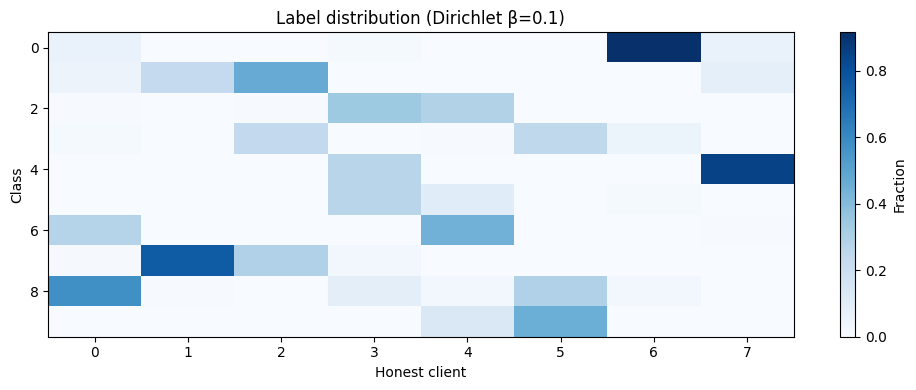

Evaluation checkpoints: every 2 rounds → rounds 0, 2, 4, …, 39


In [ ]:
plot_data_distribution()
print(f'Evaluation checkpoints: every {EVAL_INTERVAL} rounds → rounds 0, {EVAL_INTERVAL}, {2*EVAL_INTERVAL}, …, {N_ROUNDS-1}')

## Multi-Seed Simulations

Every experiment below is run over **multiple seeds** (`SEEDS`, defined in the
Configuration cell) and reported as a **mean curve with a shaded ±1 std band**.
Model init, minibatch order, Byzantine sampling, and DP noise all vary across
seeds (runs are parallelized across CPU processes); per-seed histories are
then averaged. This is the only supported evaluation mode in this notebook.

Key pieces:
- `run_seeds_parallel(...)` -- runs one `federated_train()` per seed, in parallel worker
  processes (falls back to sequential execution automatically on GPU, since it isn't safe
  to fork a live CUDA context).
- `aggregate_histories(...)` -- averages a list of per-seed histories into a single history
  with the *same shape* as a single run, plus `<metric>_std` arrays. Because the shape is
  unchanged, **every existing `plot_*`/`print_*`/`summary_table` helper below already
  works on the averaged result** -- it just sees smoother numbers.
- `run_all_methods_multi_seed(...)` -- runs every method in `METHODS` (or a custom
  `methods` dict) across all seeds and averages the results. Used by every experiment below.
- `plot_*_band(...)` -- a few variance-aware plotting helpers that add a shaded ±1 std
  region around each curve using the `_std` arrays.


In [ ]:
# ── Multi-seed configuration ──────────────────────────────────────────────────
# SEEDS, N_JOBS, and RESAMPLE_PARTITION_PER_SEED are defined once in the
# Configuration cell at the top of the notebook -- nothing here redefines
# them, so changing them there is all that's needed.
import time
import multiprocessing as mp
from concurrent.futures import ProcessPoolExecutor, as_completed

# PyTorch's CPU backend spawns its own OpenMP/MKL thread pool; if every
# parallel worker process also tries to use all cores, N workers end up
# fighting over the same cores instead of getting a real speedup (and, in
# rare cases, a multi-threaded process can deadlock right after fork()).
# Pinning both the parent and every worker to a single thread avoids both
# problems -- each of the N_JOBS worker processes gets ~1 core to itself.
torch.set_num_threads(1)


In [ ]:
# ── Local result cache ──────────────────────────────────────────────────────
# Caches one simulation at a time: a single (seed, algorithm/alpha, attack
# setup, epsilon_dp, n_rounds, ...) combination. The cache key also folds in
# every global config constant that can change the numeric result but isn't
# already an explicit argument (N_CLIENTS, BETA, BATCH_SIZE, the DP step/
# sampling-rate accounting, etc.), so editing the Configuration cell and
# re-running the notebook automatically invalidates any now-stale results
# instead of silently reusing them.

def _cache_config_fingerprint():
    """Snapshot of global constants that affect a single federated_train()
    run's result but aren't already passed as explicit call arguments.

    Also folds in the execution environment (device type, torch/numpy
    versions): floating-point results from CNN training are not bit-
    identical across CPU/GPU or across library versions, so a cache built
    on one environment silently reused after switching hardware or
    upgrading a dependency would misrepresent reproducibility -- the
    environment fields below ensure that switch invalidates the cache
    instead of returning stale numbers."""
    return {
        'DATASET': DATASET,  # AUDIT FIX: without this, switching to Fashion-MNIST
        # (Experiment 4) would silently hit-and-reuse MNIST-trained cache entries
        # whose (seed, aggregation_name, alpha, attack, epsilon_dp, ...) signature
        # happens to coincide -- a real data-leakage/correctness risk once a
        # second dataset entered the notebook. Included here so every cached
        # result is keyed to the dataset it was actually trained on.
        'N_CLIENTS': N_CLIENTS, 'N_BYZANTINE': N_BYZANTINE, 'N_HONEST': N_HONEST,
        'BETA': BETA, 'BATCH_SIZE': BATCH_SIZE,
        'FEDFAIR_Q': FEDFAIR_Q, 'FAIRNESS_K_FRAC': FAIRNESS_K_FRAC,
        'FEDFDP_LAMBDA': FEDFDP_LAMBDA, 'FEDFDP_CL_INIT': FEDFDP_CL_INIT,
        'FEDFDP_SIGMA_L_RATIO': FEDFDP_SIGMA_L_RATIO,
        'TRAIN_SUBSET_SIZE': TRAIN_SUBSET_SIZE, 'TEST_SUBSET_SIZE': TEST_SUBSET_SIZE,
        'PARTITION_SEED': PARTITION_SEED,  # shared partition seed when resample_partition=False
        'DP_STEPS': DP_STEPS, 'DP_SAMPLE_RATE': DP_SAMPLE_RATE,
        'device_type': DEVICE.type, 'torch_version': torch.__version__,
        'numpy_version': np.__version__,
    }


def _cache_signature(seed, aggregation_name, alpha, attack, epsilon, epsilon_dp,
                      mu, n_rounds, lr, local_epochs, clip_norm, delta,
                      eval_interval, resample_partition):
    sig = {
        'seed': seed, 'aggregation_name': aggregation_name, 'alpha': alpha,
        'attack': attack, 'epsilon': epsilon, 'epsilon_dp': epsilon_dp, 'mu': mu,
        'n_rounds': n_rounds, 'lr': lr, 'local_epochs': local_epochs,
        'clip_norm': clip_norm, 'delta': delta, 'eval_interval': eval_interval,
        'resample_partition': resample_partition,
    }
    sig.update(_cache_config_fingerprint())
    return sig


def _cache_path_for(signature, seed, aggregation_name, alpha, attack, epsilon_dp):
    key = hashlib.sha256(json.dumps(signature, sort_keys=True, default=str).encode()).hexdigest()
    eps_tag = 'noDP' if epsilon_dp is None else f'eps{epsilon_dp}'
    fname = f"{aggregation_name}__{attack}__{eps_tag}__alpha{alpha}__seed{seed}__{key[:12]}.pkl"
    return os.path.join(CACHE_DIR, fname)


def _load_cached_history(path, signature):
    if not (USE_CACHE and os.path.exists(path)):
        return None
    try:
        with open(path, 'rb') as f:
            payload = pickle.load(f)
        if payload.get('signature') != signature:
            return None  # stale/mismatched file (e.g. rare hash-prefix collision) -- recompute
        return payload['history']
    except Exception as e:
        print(f'  [cache] could not read {path} ({e}) -- recomputing')
        return None


def _save_cached_history(path, signature, history):
    if not USE_CACHE:
        return
    try:
        os.makedirs(CACHE_DIR, exist_ok=True)
        tmp_path = f'{path}.tmp{os.getpid()}'
        with open(tmp_path, 'wb') as f:
            pickle.dump({'signature': signature, 'history': dict(history)}, f)
        os.replace(tmp_path, path)  # atomic, so a crash mid-write can't leave a corrupt cache file
    except Exception as e:
        print(f'  [cache] could not save {path} ({e})')


def clear_cache(confirm=False):
    """Delete every saved simulation result in CACHE_DIR. Pass confirm=True
    to actually delete (safety guard against accidental calls)."""
    if not confirm:
        print("Pass clear_cache(confirm=True) to actually delete all cached results.")
        return
    n = 0
    for fname in os.listdir(CACHE_DIR):
        if fname.endswith('.pkl'):
            os.remove(os.path.join(CACHE_DIR, fname))
            n += 1
    print(f'Deleted {n} cached result(s) from {CACHE_DIR}.')


# ── Single-seed worker + parallel seed runner ───────────────────────────────

def _single_seed_worker(seed, aggregation_name, alpha, attack, epsilon, epsilon_dp,
                         mu, n_rounds, lr, local_epochs, clip_norm, delta,
                         eval_interval, resample_partition, verbose=True):
    """Run one full federated_train() call under a given seed.

    Safe to call inside a forked worker process: it reseeds every RNG that
    influences this particular run (numpy, torch, and -- if
    `resample_partition` -- the client data partition itself), so different
    seeds truly diverge from one another. Because worker processes are
    created with fork(), each one has its own private copy-on-write memory,
    so mutating "global" state like `client_indices` here never affects the
    parent notebook process or any sibling worker.
    """
    torch.set_num_threads(1)
    np.random.seed(seed)
    torch.manual_seed(seed)

    global client_indices, DP_STEPS, DP_SAMPLE_RATE
    if resample_partition:
        client_indices = dirichlet_split(y_train, N_CLIENTS, BETA, seed=seed)
        avg_size = int(np.mean([len(client_indices[i]) for i in HONEST_IDS]))
        DP_STEPS = dp_steps_per_client(avg_size)
        DP_SAMPLE_RATE = min(1.0, BATCH_SIZE / avg_size)

    signature = _cache_signature(seed, aggregation_name, alpha, attack, epsilon,
                                  epsilon_dp, mu, n_rounds, lr, local_epochs,
                                  clip_norm, delta, eval_interval, resample_partition)
    cache_path = _cache_path_for(signature, seed, aggregation_name, alpha, attack, epsilon_dp)

    cached_history = _load_cached_history(cache_path, signature)
    if cached_history is not None:
        print(f'  [cache hit] {os.path.basename(cache_path)}')
        return cached_history

    history = federated_train(
        aggregation_name, alpha=alpha, attack=attack, epsilon=epsilon,
        n_rounds=n_rounds, lr=lr, mu=mu, local_epochs=local_epochs,
        epsilon_dp=epsilon_dp, clip_norm=clip_norm, delta=delta,
        eval_interval=eval_interval, verbose=verbose,
    )
    history['seed'] = seed
    _save_cached_history(cache_path, signature, history)
    return history


def run_seeds_parallel(seeds, aggregation_name, alpha=FAR_ALPHA, attack='none', epsilon=IPM_EPSILON,
                        epsilon_dp=None, mu=0.0, n_rounds=N_ROUNDS, lr=LR,
                        local_epochs=LOCAL_EPOCHS, clip_norm=CLIP_NORM, delta=DELTA,
                        eval_interval=EVAL_INTERVAL, n_jobs=None,
                        resample_partition=RESAMPLE_PARTITION_PER_SEED, verbose=True):
    """Run `federated_train()` once per seed, in parallel worker processes.

    Returns a list of per-seed history dicts, in the same order as `seeds`.
    Falls back to running seeds sequentially (still correct, just slower)
    whenever running in parallel isn't safe or wouldn't help: a CUDA device,
    only one seed, or n_jobs == 1.
    """
    n_jobs = n_jobs or min(len(seeds), os.cpu_count() or 1)
    use_processes = (DEVICE.type != 'cuda') and n_jobs > 1 and len(seeds) > 1

    args = [(s, aggregation_name, alpha, attack, epsilon, epsilon_dp, mu,
              n_rounds, lr, local_epochs, clip_norm, delta, eval_interval,
              resample_partition) for s in seeds]

    if not use_processes:
        return [_single_seed_worker(*a, verbose=verbose) for a in args]

    histories = [None] * len(seeds)
    ctx = mp.get_context('fork')  # fork (not spawn) so workers can pickle-by-reference
                                    # functions/data defined right here in the notebook
    with ProcessPoolExecutor(max_workers=n_jobs, mp_context=ctx) as executor:
        futures = {executor.submit(_single_seed_worker, *a): i for i, a in enumerate(args)}
        for fut in as_completed(futures):
            i = futures[fut]
            histories[i] = fut.result()
    return histories


In [ ]:
# ── Averaging across seeds ──────────────────────────────────────────────────

_AVERAGED_SCALAR_METRICS = (
    'global_acc', 'test_acc', 'variance', 'worst_k', 'best_k', 'gap', 'psi',
    'client_loss_mean',
)


def aggregate_histories(histories):
    """Average a list of per-seed history dicts (as returned by
    `run_seeds_parallel` / `federated_train`) into a single averaged history.

    The result has the *same shape* as a single-run history (same keys, same
    list lengths), so every plot_*/print_*/summary_table helper defined
    above works on it completely unchanged -- it just plots smoother, more
    reliable numbers. It also gets `<metric>_std` arrays attached for every
    averaged metric, which the `*_band` plotting helpers below use to draw a
    shaded run-to-run spread.

    `<metric>_std` is the unbiased *sample* standard deviation (ddof=1) over
    seeds, not the population std (ddof=0 would systematically understate
    spread with as few as len(SEEDS) runs, e.g. ~11% too narrow at 5 seeds)
    and not a standard error or confidence interval -- it is a dispersion
    band across independent runs, not a formal significance test, and
    should be read/captioned as such.
    """
    ref = histories[0]
    rounds = ref['round']
    for h in histories[1:]:
        if h['round'] != rounds:
            raise ValueError(
                'Cannot average histories with different evaluation '
                'checkpoints -- make sure every seed used the same '
                'n_rounds and eval_interval.'
            )

    out = {
        'round': list(rounds),
        'method': ref.get('method'),
        'eval_interval': ref.get('eval_interval'),
        'n_seeds': len(histories),
        'seeds': [h.get('seed') for h in histories],
    }

    for metric in _AVERAGED_SCALAR_METRICS:
        if metric not in ref:
            continue
        stacked = np.array([h[metric] for h in histories])  # (n_seeds, n_evals)
        out[metric] = stacked.mean(axis=0).tolist()
        out[metric + '_std'] = stacked.std(axis=0, ddof=1).tolist()  # sample std, see docstring

    # per_client_acc / per_client_loss: list-per-checkpoint of list-per-client.
    # Averaging elementwise keeps them compatible with the per-client plots
    # above, which only look at the *last* checkpoint's per-client vector.
    for metric in ('per_client_acc', 'per_client_loss'):
        if metric in ref:
            stacked = np.array([h[metric] for h in histories])  # (n_seeds, n_evals, n_clients)
            out[metric] = stacked.mean(axis=0).tolist()
            out[metric + '_std'] = stacked.std(axis=0, ddof=1).tolist()  # sample std, see docstring

    out['sigma'] = float(np.mean([h.get('sigma', 0.0) for h in histories]))
    return out


def run_all_methods_multi_seed(seeds=None, attack='none', epsilon=IPM_EPSILON, epsilon_dp=None,
                                n_jobs=None, verbose=True,
                                resample_partition=RESAMPLE_PARTITION_PER_SEED,
                                methods=None):
    """Run every method in `methods` (defaults to the module-level `METHODS`)
    across all seeds and average the results.

    For every method, runs one `federated_train()` per seed -- seeds executed
    in parallel processes via `run_seeds_parallel` -- then averages the
    resulting curves with `aggregate_histories()`. The returned dict has the
    same shape as a plain per-method `{name: federated_train(...)}` dict, so
    it drops straight into `plot_accuracy_progress`, `plot_fairness_dashboard`,
    `summary_table`, etc. -- just averaged over `len(seeds)` independent runs
    for smoother, more statistically reliable curves.
    """
    seeds = seeds if seeds is not None else SEEDS
    methods = methods or METHODS
    results = {}
    for name, (agg, alpha, mu) in methods.items():
        t0 = time.time()
        print(f'  {name} ({len(seeds)} seeds: {seeds})...', end=' ', flush=True)
        histories = run_seeds_parallel(
            seeds, agg, alpha=alpha, attack=attack, epsilon=epsilon,
            epsilon_dp=epsilon_dp, mu=mu, n_jobs=n_jobs,
            resample_partition=resample_partition, verbose=verbose
        )
        results[name] = aggregate_histories(histories)
        m = results[name]
        dt = time.time() - t0
        print(f"Acc={m['global_acc'][-1]:.1f}%±{m['global_acc_std'][-1]:.1f} "
              f"Gap={m['gap'][-1]:.1f}%±{m['gap_std'][-1]:.1f} ({dt:.0f}s)")
    return results


In [ ]:
# ── Variance-aware plots (mean curve + shaded ±1 std band) ─────────────────

def plot_accuracy_progress_band(results_dict, title='Accuracy During Training'):
    """Like plot_accuracy_progress, but shades a ±1 std band around each
    curve using the `<metric>_std` arrays produced by aggregate_histories()."""
    fig, axes = plt.subplots(1, 2, figsize=(13, 4.5))
    for ax, metric, subtitle in zip(axes, ['global_acc', 'test_acc'],
                                     ['Client-mean Accuracy', 'Global Test Accuracy']):
        for name, hist in results_dict.items():
            rounds = hist['round']
            vals = np.array(hist[metric])
            color = COLORS.get(name)
            ax.plot(rounds, vals, 'o-', label=name, color=color, linewidth=2, markersize=6)
            std_key = metric + '_std'
            if std_key in hist:
                stds = np.array(hist[std_key])
                ax.fill_between(rounds, vals - stds, vals + stds, color=color, alpha=0.15)
        ax.set_xlabel('Round')
        ax.set_ylabel(METRIC_LABELS[metric])
        ax.set_title(subtitle)
        ax.set_xticks(sorted({r for h in results_dict.values() for r in h['round']}))
        ax.grid(alpha=0.3)
        ax.legend(fontsize=8)
    n_seeds = next(iter(results_dict.values())).get('n_seeds', 1)
    fig.suptitle(f'{title}  [mean ± std, n={n_seeds} seeds]', fontweight='bold')
    plt.tight_layout()
    plt.show()


def plot_training_curves_band(results_dict, title, metrics=('global_acc', 'variance', 'worst_k', 'gap')):
    """Variance-aware counterpart of plot_training_curves."""
    fig, axes = plt.subplots(1, len(metrics), figsize=(4 * len(metrics), 3.5))
    if len(metrics) == 1:
        axes = [axes]
    for ax, metric in zip(axes, metrics):
        for name, hist in results_dict.items():
            rounds = hist['round']
            vals = np.array(hist[metric])
            color = COLORS.get(name)
            ax.plot(rounds, vals, 'o-', label=name, color=color, linewidth=2, markersize=5)
            std_key = metric + '_std'
            if std_key in hist:
                stds = np.array(hist[std_key])
                ax.fill_between(rounds, vals - stds, vals + stds, color=color, alpha=0.15)
        ax.set_xlabel('Round')
        ax.set_ylabel(METRIC_LABELS.get(metric, metric))
        ax.set_xticks(sorted({r for h in results_dict.values() for r in h['round']}))
        ax.grid(alpha=0.3)
    axes[0].legend(fontsize=8)
    n_seeds = next(iter(results_dict.values())).get('n_seeds', 1)
    fig.suptitle(f'{title}  [mean ± std, n={n_seeds} seeds]', fontweight='bold')
    plt.tight_layout()
    plt.show()


def plot_psi_progress_band(results_dict, title='Balanced Fairness Ψ During Training', log_scale=True):
    """Variance-aware counterpart of plot_psi_progress."""
    fig, ax = plt.subplots(figsize=(8, 4.5))
    for name, hist in results_dict.items():
        if 'psi' not in hist or len(hist['psi']) == 0:
            continue
        rounds = hist['round']
        vals = np.array(hist['psi'])
        color = COLORS.get(name)
        ax.plot(rounds, vals, 'o-', label=name, color=color, linewidth=2, markersize=6)
        if 'psi_std' in hist:
            stds = np.array(hist['psi_std'])
            lower = np.clip(vals - stds, 1e-12, None) if log_scale else vals - stds
            ax.fill_between(rounds, lower, vals + stds, color=color, alpha=0.15)
    if log_scale:
        ax.set_yscale('log')
    ax.set_xlabel('Round')
    ax.set_ylabel(METRIC_LABELS['psi'])
    n_seeds = next(iter(results_dict.values())).get('n_seeds', 1)
    ax.set_title(f'{title}  [mean ± std, n={n_seeds} seeds]')
    ax.set_xticks(sorted({r for h in results_dict.values() for r in h['round']}))
    ax.grid(alpha=0.3, which='both')
    ax.legend(fontsize=8)
    plt.tight_layout()
    plt.show()


## Experiment 1 — No Byzantine attack

Experiment 1: No attack (multi-seed, 3 seeds [28, 36, 54])
  FedAvg (3 seeds: [28, 36, 54])...   [cache hit] fedavg__none__noDP__alpha0.0__seed28__f1353ab01005.pkl
  [cache hit] fedavg__none__noDP__alpha0.0__seed36__8b5d620892c9.pkl
  [cache hit] fedavg__none__noDP__alpha0.0__seed54__44e13624c896.pkl
Acc=96.2%±0.5 Gap=2.3%±1.6 (2s)
  FAR-CM(NNM) α=-1.5 (3 seeds: [28, 36, 54])...   [cache hit] far_cm_nnm__none__noDP__alpha-1.5__seed28__39d4dd717b97.pkl
  [cache hit] far_cm_nnm__none__noDP__alpha-1.5__seed36__ceec059f0035.pkl
  [cache hit] far_cm_nnm__none__noDP__alpha-1.5__seed54__958d5ab475da.pkl
Acc=95.9%±0.7 Gap=3.5%±2.9 (0s)
  FAR-CM(NNM) α=-0.5 (3 seeds: [28, 36, 54])...   [cache hit] far_cm_nnm__none__noDP__alpha-0.5__seed28__ebce2e36c2a4.pkl
  [cache hit] far_cm_nnm__none__noDP__alpha-0.5__seed36__644ef3ad4c9a.pkl
  [cache hit] far_cm_nnm__none__noDP__alpha-0.5__seed54__bff936d6fecf.pkl
Acc=96.2%±0.6 Gap=2.5%±1.8 (0s)
  FAR-CM(NNM) α=-0.1 (3 seeds: [28, 36, 54])...   [cache hit] 

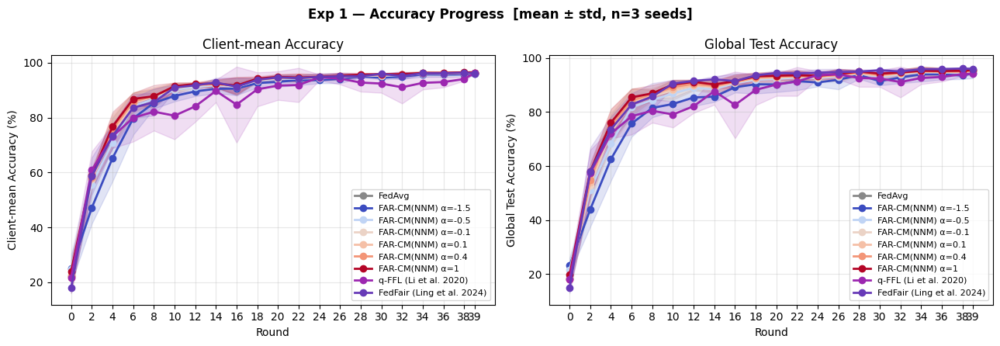

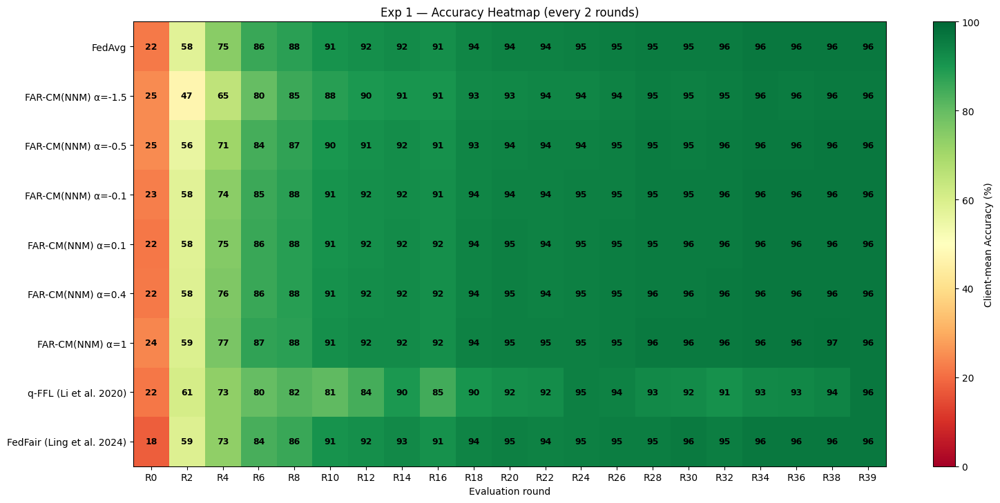

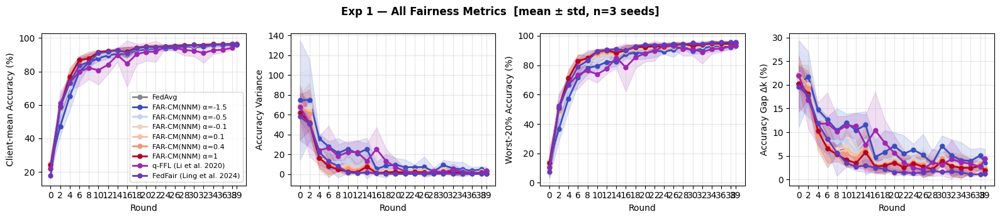

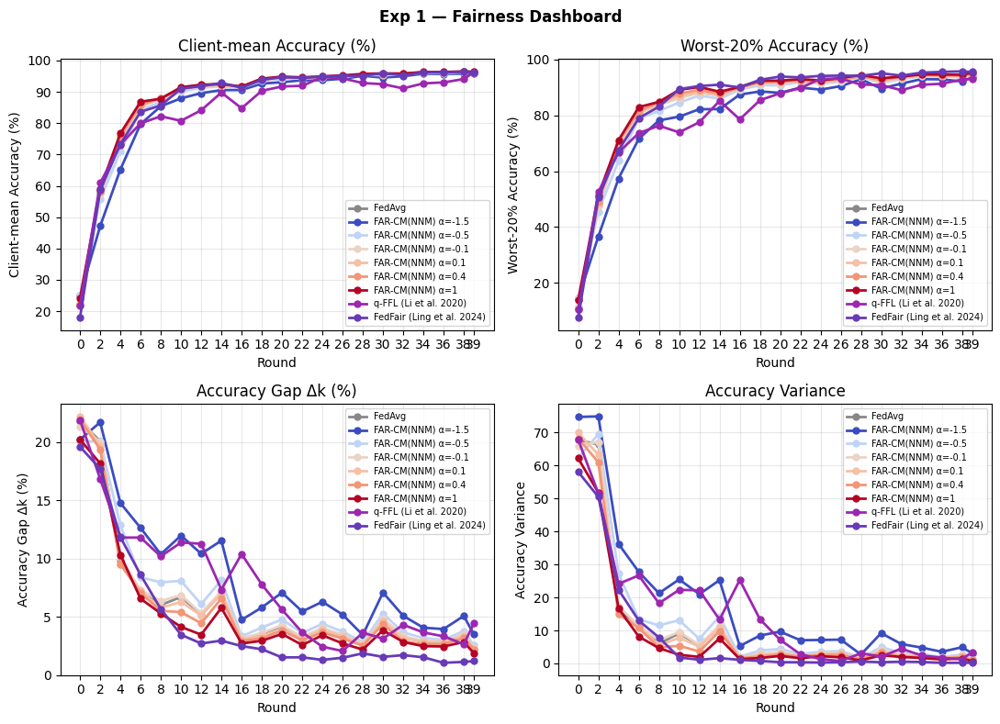

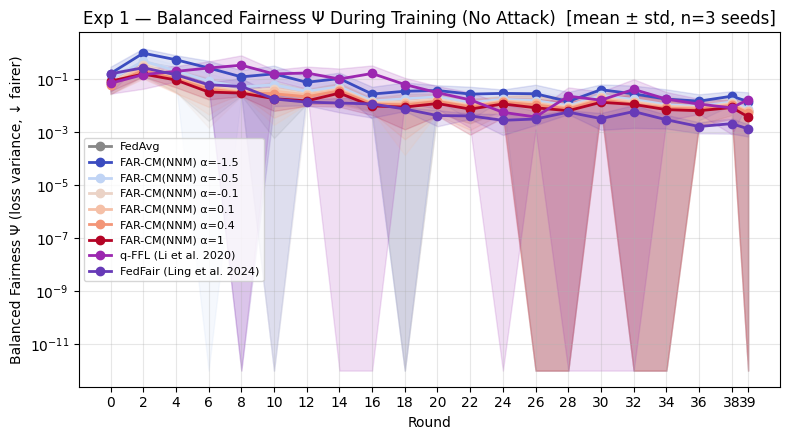

...

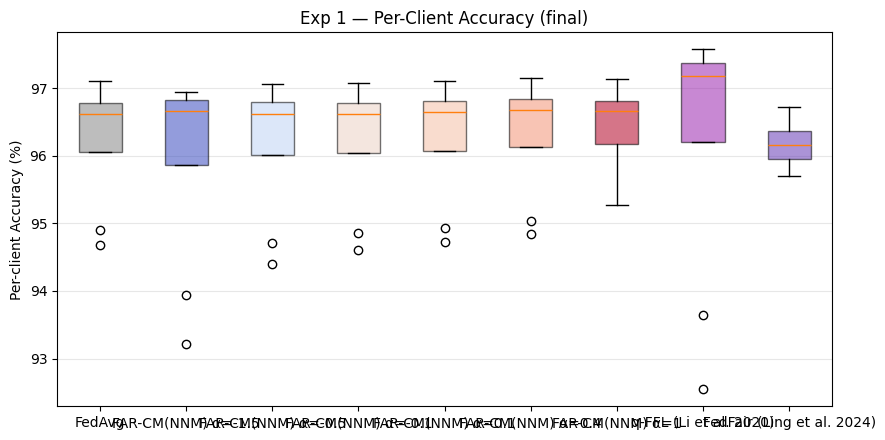

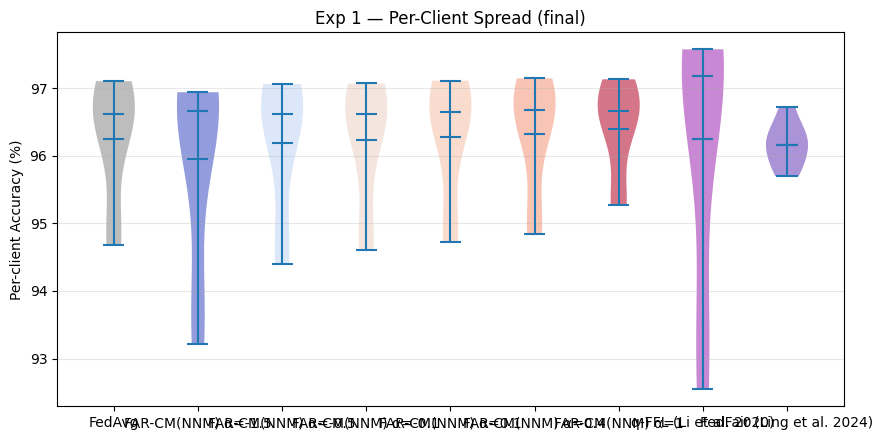

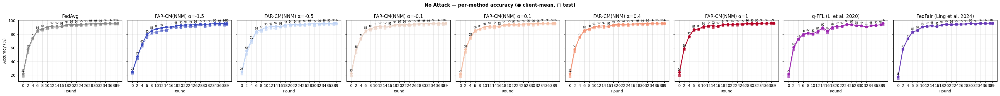

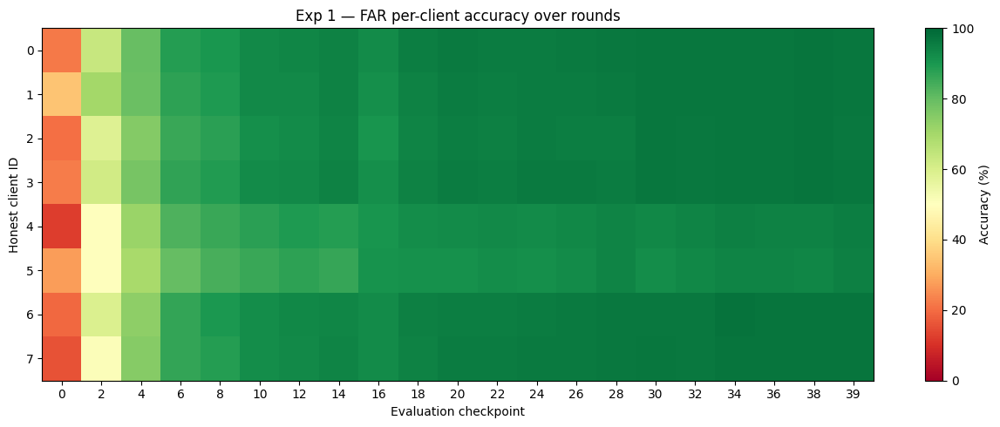

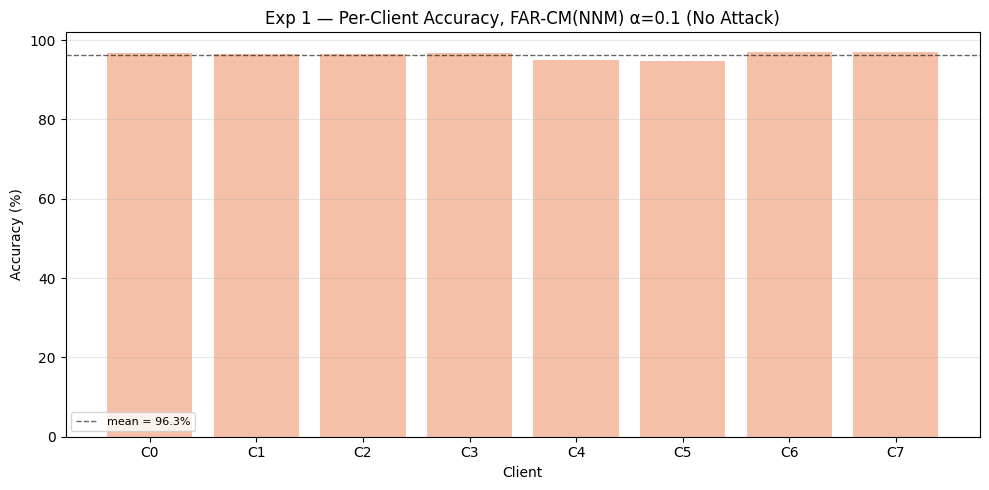

In [ ]:
print(f'Experiment 1: No attack (multi-seed, {len(SEEDS)} seeds {SEEDS})')
results_na = run_all_methods_multi_seed(seeds=SEEDS, attack='none', verbose=False)

summary_table(results_na, f'No Attack — Final Round (mean over {len(SEEDS)} seeds)')
print_training_log(results_na)
for name, hist in results_na.items():
    print_single_method_log(hist, name)

plot_accuracy_progress_band(results_na, 'Exp 1 — Accuracy Progress')
plot_accuracy_heatmap(results_na, f'Exp 1 — Accuracy Heatmap (every {EVAL_INTERVAL} rounds)')
plot_training_curves_band(results_na, 'Exp 1 — All Fairness Metrics')
plot_fairness_dashboard(results_na, 'Exp 1 — Fairness Dashboard')
plot_psi_progress_band(results_na, 'Exp 1 — Balanced Fairness Ψ During Training (No Attack)')
plot_psi_bar(results_na, 'Exp 1 — Balanced Fairness Ψ, Final Round (No Attack)')
plot_final_metrics_bar(results_na, 'Exp 1 — Final Metrics Comparison')
plot_client_accuracy_box(results_na, 'Exp 1 — Per-Client Accuracy (final)')
plot_client_accuracy_violin(results_na, 'Exp 1 — Per-Client Spread (final)')
plot_all_methods_scenario_grid(results_na, 'No Attack')
plot_client_heatmap(results_na[FAR_HIGHLIGHT_METHOD], FAR_HIGHLIGHT_METHOD, 'Exp 1 — FAR per-client accuracy over rounds')
plot_per_client_accuracy_bars(results_na, f'Exp 1 — Per-Client Accuracy, {FAR_HIGHLIGHT_METHOD} (No Attack)')

## Experiment 2 — Under Byzantine attacks

Experiment 2a: IPM attack (eps=1.0, multi-seed, 3 seeds [28, 36, 54])
  FedAvg (3 seeds: [28, 36, 54])...   [cache hit] fedavg__ipm__noDP__alpha0.0__seed28__76dfabb6973f.pkl
  [cache hit] fedavg__ipm__noDP__alpha0.0__seed36__be9cc91e9c18.pkl
  [cache hit] fedavg__ipm__noDP__alpha0.0__seed54__5d4c7306130a.pkl
Acc=95.0%±0.6 Gap=3.4%±1.0 (0s)
  FAR-CM(NNM) α=-1.5 (3 seeds: [28, 36, 54])...   [cache hit] far_cm_nnm__ipm__noDP__alpha-1.5__seed28__1c7993f61758.pkl
  [cache hit] far_cm_nnm__ipm__noDP__alpha-1.5__seed36__7b3f96fe4571.pkl
  [cache hit] far_cm_nnm__ipm__noDP__alpha-1.5__seed54__ae05d09bdc67.pkl
Acc=91.6%±0.9 Gap=12.3%±0.9 (0s)
  FAR-CM(NNM) α=-0.5 (3 seeds: [28, 36, 54])...   [cache hit] far_cm_nnm__ipm__noDP__alpha-0.5__seed28__d44f8e645dc3.pkl
  [cache hit] far_cm_nnm__ipm__noDP__alpha-0.5__seed36__a339ba93710c.pkl
  [cache hit] far_cm_nnm__ipm__noDP__alpha-0.5__seed54__cf5e9681deb0.pkl
Acc=94.5%±0.8 Gap=4.5%±1.1 (0s)
  FAR-CM(NNM) α=-0.1 (3 seeds: [28, 36, 54])... Acc=95.0%±0

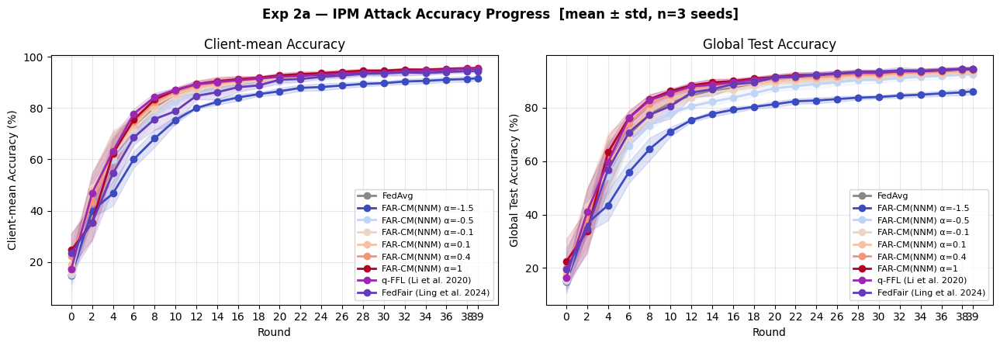

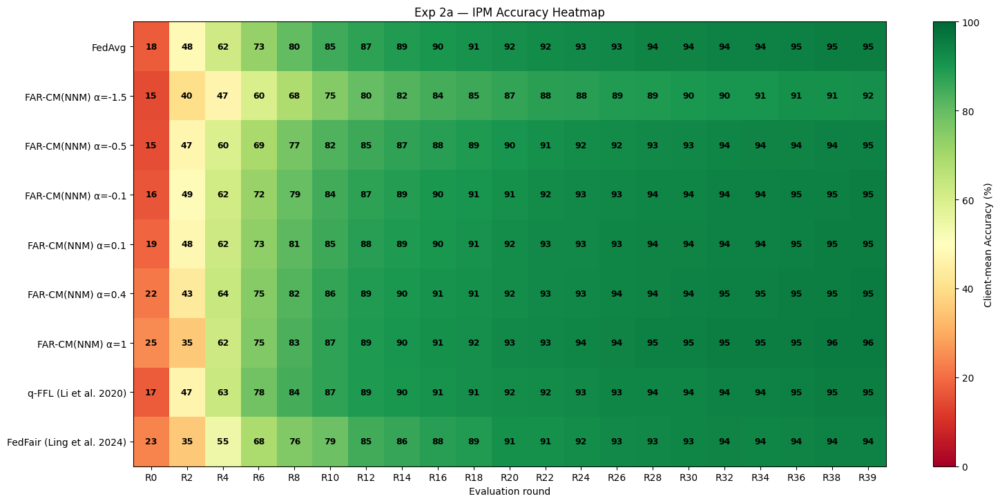

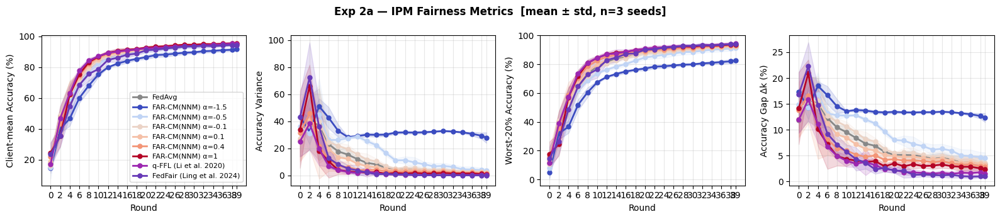

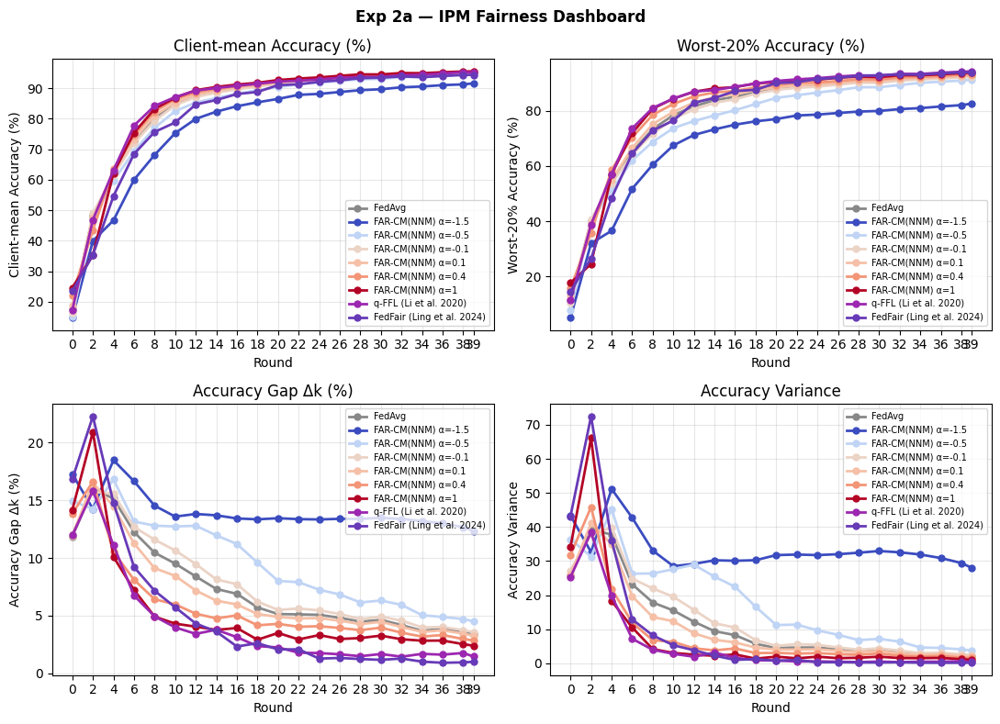

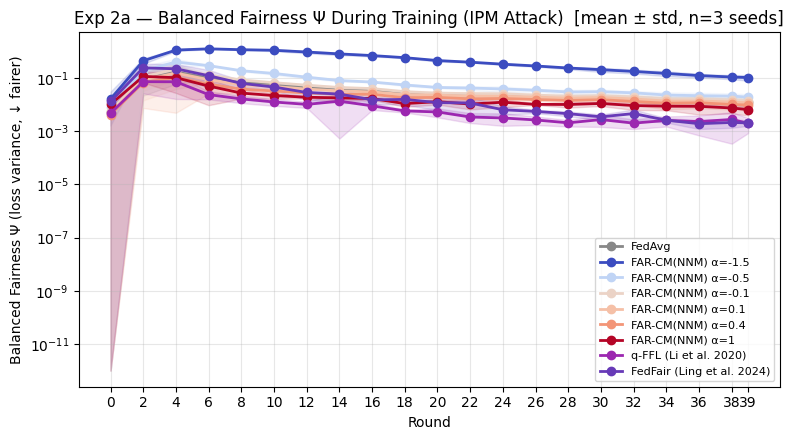

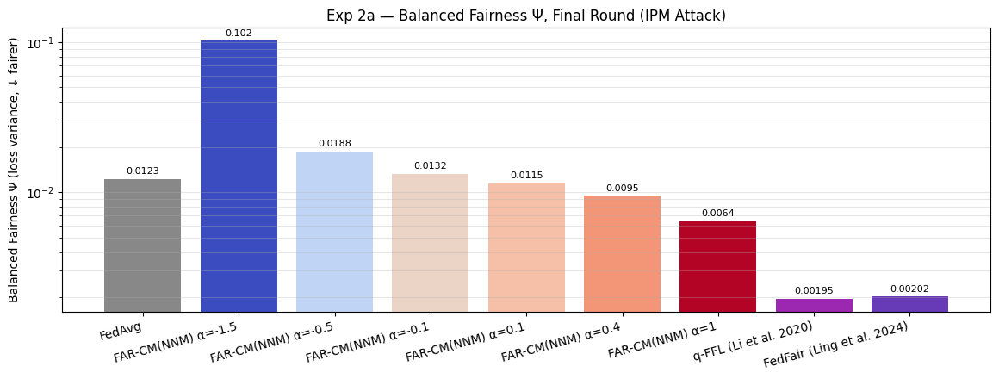

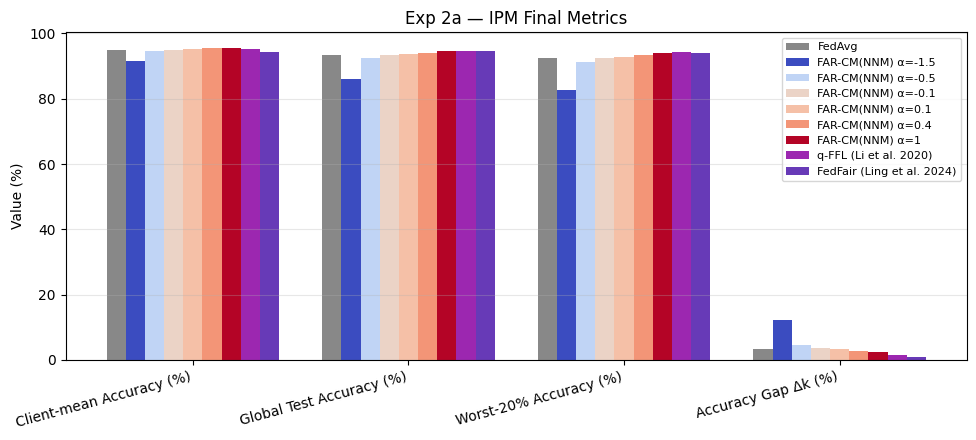

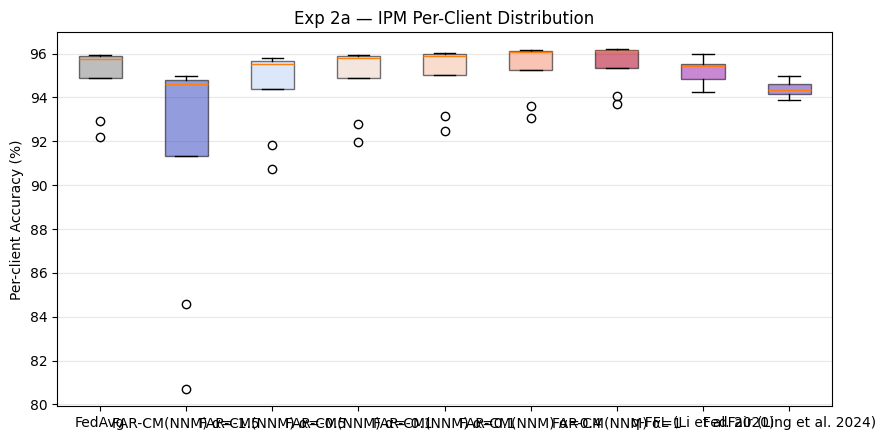

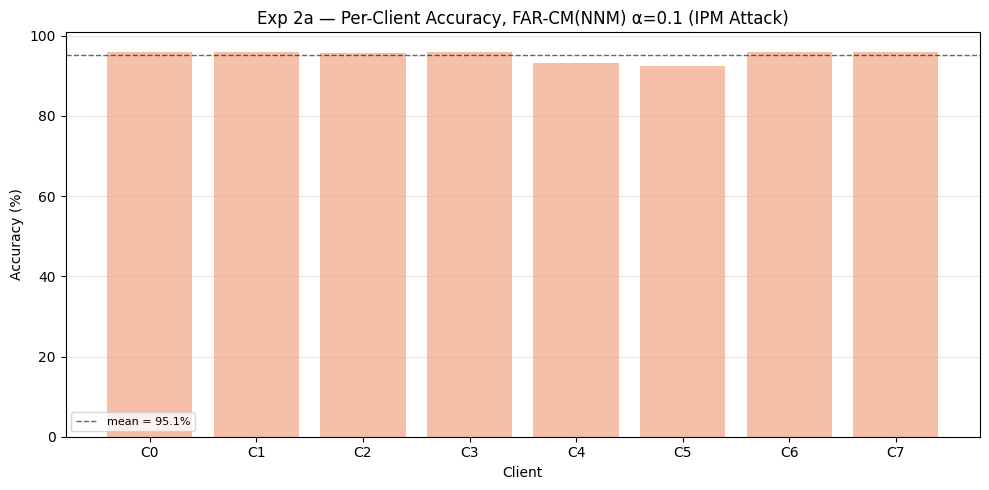

In [ ]:
print(f'Experiment 2a: IPM attack (eps={IPM_EPSILON}, multi-seed, {len(SEEDS)} seeds {SEEDS})')
results_ipm = run_all_methods_multi_seed(seeds=SEEDS, attack='ipm', epsilon=IPM_EPSILON, verbose=False)
summary_table(results_ipm, f'IPM Attack — Final Round (mean over {len(SEEDS)} seeds)')
print_training_log(results_ipm)

plot_accuracy_progress_band(results_ipm, 'Exp 2a — IPM Attack Accuracy Progress')
plot_accuracy_heatmap(results_ipm, 'Exp 2a — IPM Accuracy Heatmap')
plot_training_curves_band(results_ipm, 'Exp 2a — IPM Fairness Metrics')
plot_fairness_dashboard(results_ipm, 'Exp 2a — IPM Fairness Dashboard')
plot_psi_progress_band(results_ipm, 'Exp 2a — Balanced Fairness Ψ During Training (IPM Attack)')
plot_psi_bar(results_ipm, 'Exp 2a — Balanced Fairness Ψ, Final Round (IPM Attack)')
plot_final_metrics_bar(results_ipm, 'Exp 2a — IPM Final Metrics')
plot_client_accuracy_box(results_ipm, 'Exp 2a — IPM Per-Client Distribution')
plot_per_client_accuracy_bars(results_ipm, f'Exp 2a — Per-Client Accuracy, {FAR_HIGHLIGHT_METHOD} (IPM Attack)')



Experiment 2b: BitFlip attack (multi-seed, 3 seeds [28, 36, 54])
  FedAvg (3 seeds: [28, 36, 54])...   [cache hit] fedavg__bitflip__noDP__alpha0.0__seed28__1b863c9a76e2.pkl
  [cache hit] fedavg__bitflip__noDP__alpha0.0__seed36__4ec54229a32e.pkl
  [cache hit] fedavg__bitflip__noDP__alpha0.0__seed54__dad2f273e3be.pkl
Acc=94.6%±0.9 Gap=4.9%±3.3 (0s)
  FAR-CM(NNM) α=-1.5 (3 seeds: [28, 36, 54])...   [cache hit] far_cm_nnm__bitflip__noDP__alpha-1.5__seed28__e2e9756508a1.pkl
  [cache hit] far_cm_nnm__bitflip__noDP__alpha-1.5__seed36__938794798383.pkl
  [cache hit] far_cm_nnm__bitflip__noDP__alpha-1.5__seed54__9747ed8ca8e8.pkl
Acc=93.8%±0.9 Gap=6.9%±3.4 (0s)
  FAR-CM(NNM) α=-0.5 (3 seeds: [28, 36, 54])...   [cache hit] far_cm_nnm__bitflip__noDP__alpha-0.5__seed28__2fe73565590e.pkl
  [cache hit] far_cm_nnm__bitflip__noDP__alpha-0.5__seed36__1d5104ae8b5e.pkl
  [cache hit] far_cm_nnm__bitflip__noDP__alpha-0.5__seed54__c5de50c107ba.pkl
Acc=94.4%±0.9 Gap=5.3%±3.5 (0s)
  FAR-CM(NNM) α=-0.1 (3 seed

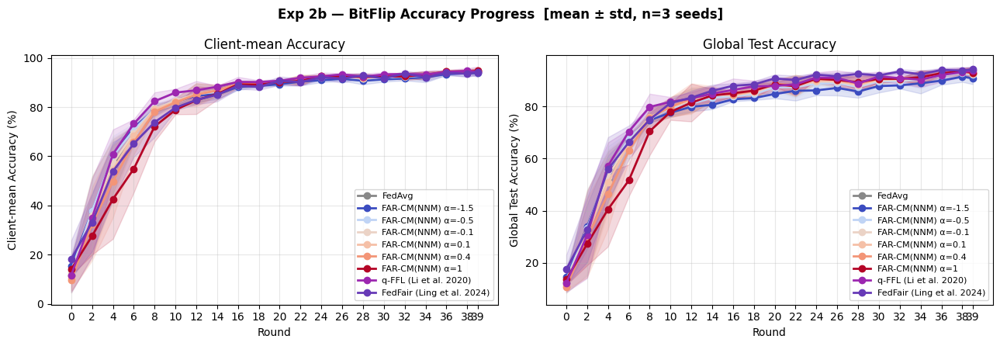

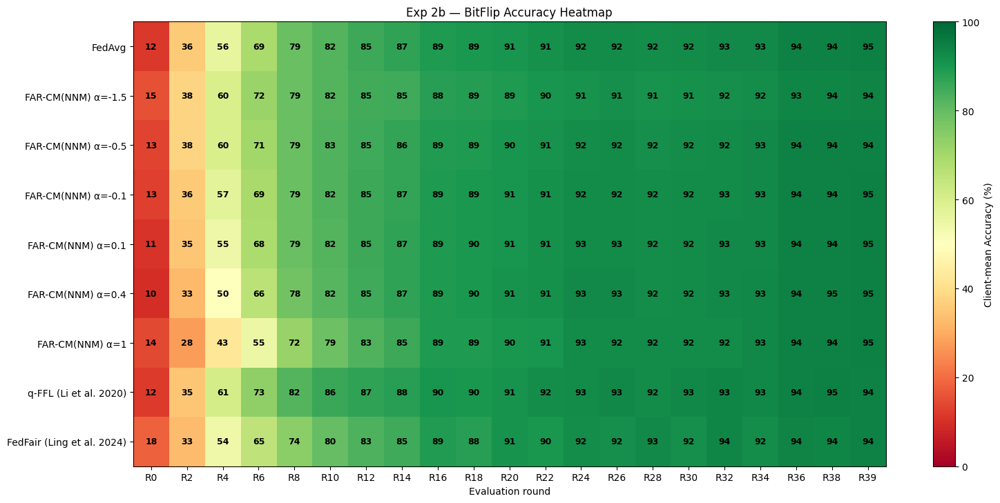

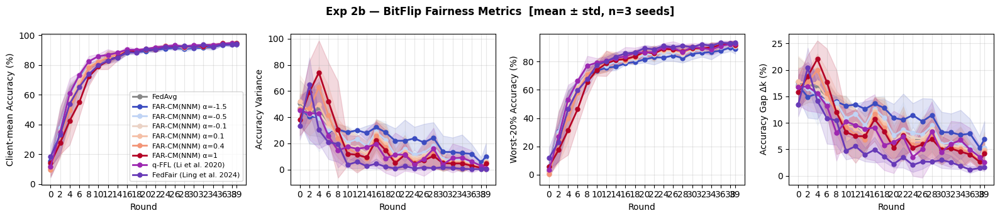

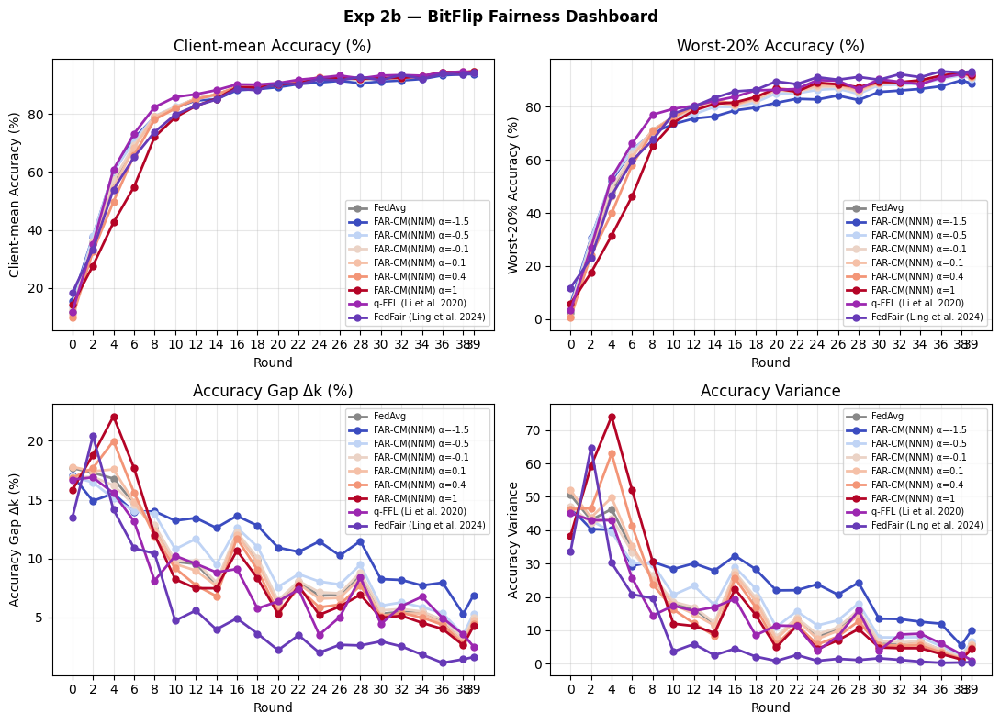

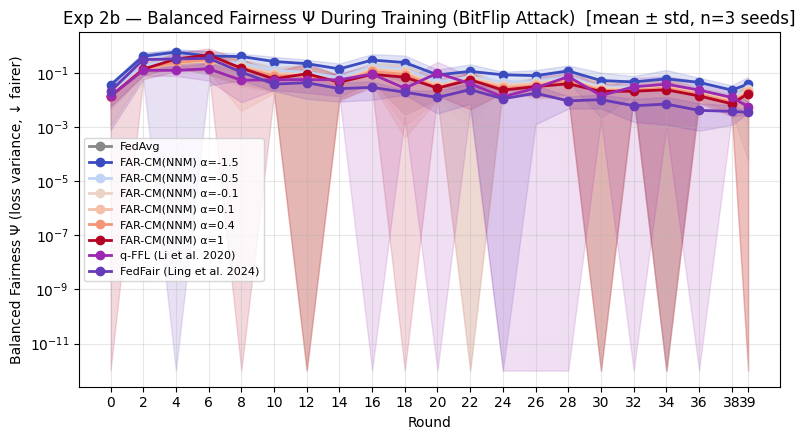

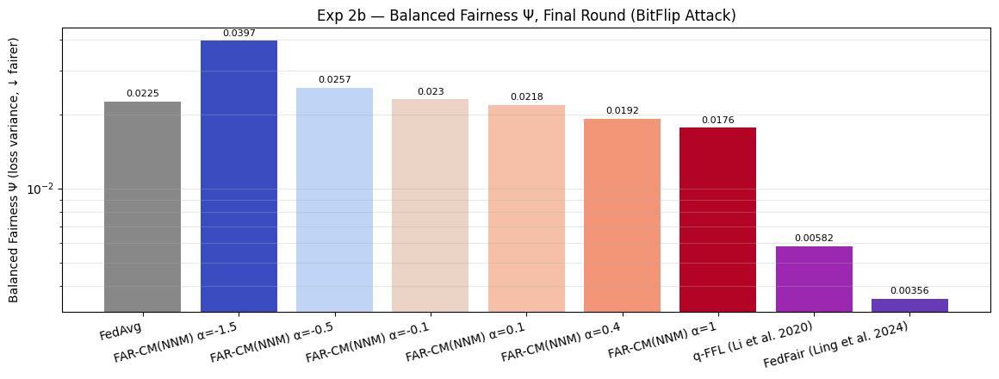

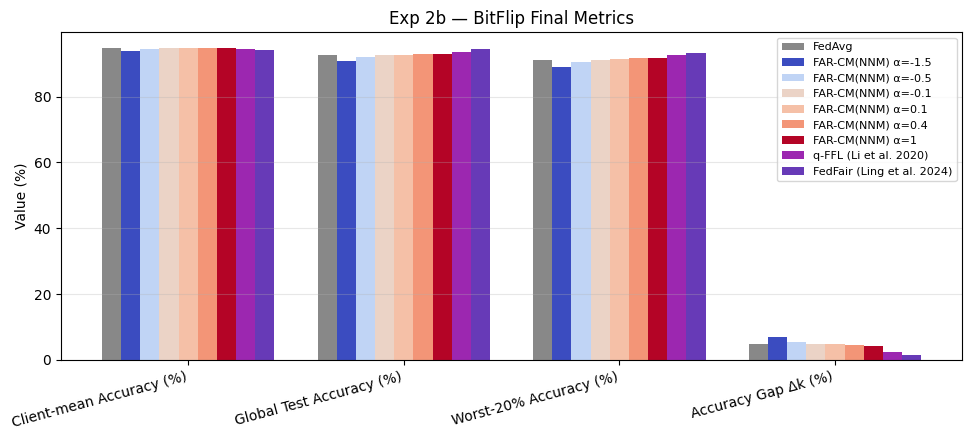

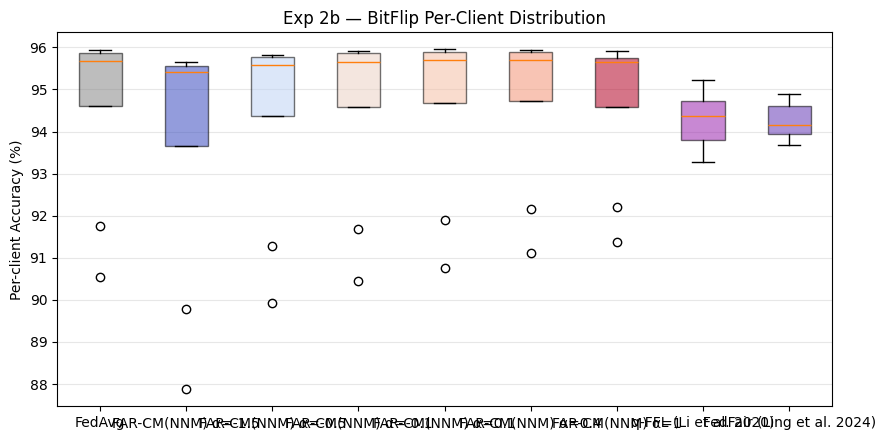

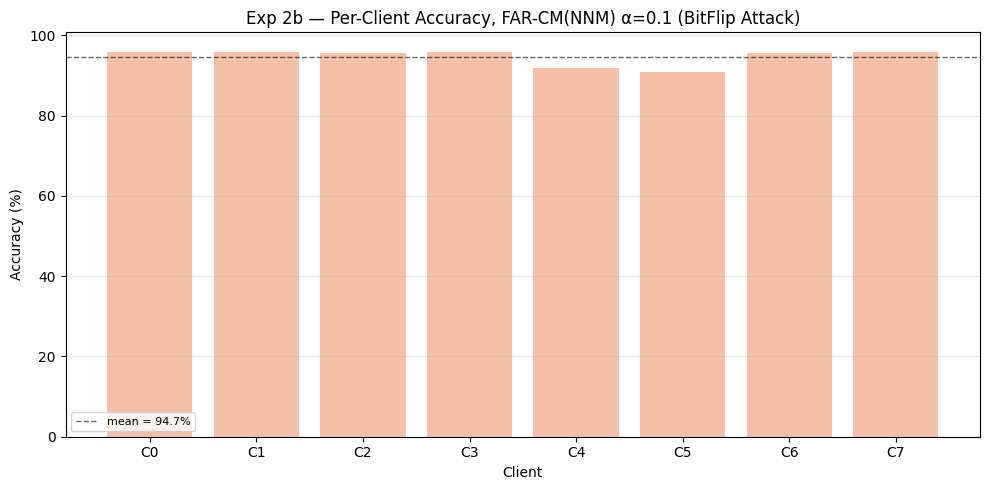

"\nplot_scenario_accuracy_comparison(\n    {'No Attack': results_na, 'IPM': results_ipm, 'BitFlip': results_bf},\n    f'{FAR_HIGHLIGHT_METHOD} Across Attack Scenarios',\n)\n"

In [ ]:
print(f'\nExperiment 2b: BitFlip attack (multi-seed, {len(SEEDS)} seeds {SEEDS})')
results_bf = run_all_methods_multi_seed(seeds=SEEDS, attack='bitflip', verbose=False)
summary_table(results_bf, f'BitFlip Attack — Final Round (mean over {len(SEEDS)} seeds)')
print_training_log(results_bf)

plot_accuracy_progress_band(results_bf, 'Exp 2b — BitFlip Accuracy Progress')
plot_accuracy_heatmap(results_bf, 'Exp 2b — BitFlip Accuracy Heatmap')
plot_training_curves_band(results_bf, 'Exp 2b — BitFlip Fairness Metrics')
plot_fairness_dashboard(results_bf, 'Exp 2b — BitFlip Fairness Dashboard')
plot_psi_progress_band(results_bf, 'Exp 2b — Balanced Fairness Ψ During Training (BitFlip Attack)')
plot_psi_bar(results_bf, 'Exp 2b — Balanced Fairness Ψ, Final Round (BitFlip Attack)')
plot_final_metrics_bar(results_bf, 'Exp 2b — BitFlip Final Metrics')
plot_client_accuracy_box(results_bf, 'Exp 2b — BitFlip Per-Client Distribution')
plot_per_client_accuracy_bars(results_bf, f'Exp 2b — Per-Client Accuracy, {FAR_HIGHLIGHT_METHOD} (BitFlip Attack)')

# Cross-scenario comparison for FAR
"""
plot_scenario_accuracy_comparison(
    {'No Attack': results_na, 'IPM': results_ipm, 'BitFlip': results_bf},
    f'{FAR_HIGHLIGHT_METHOD} Across Attack Scenarios',
)
"""

## Experiment 3 — Differential Privacy sweep

Sweeps privacy budget **epsilon_dp** under DP-SGD local training (no attack
by default — see the note below), comparing **DP + FedAvg** (mu=0 baseline),
**DP + q-FFL** (Li et al., 2020's q-FFL loss-reweighted aggregation run with
standard uniform-clip DP-SGD — one of FedFDP's own six baselines, Section
7.1), the full `FAR_ALPHAS` sweep of **DP + FAR-CM(NNM)** variants, and the
genuine **FedFDP** algorithm (Ling et al., 2024, Algorithm 2): fairness-aware
per-sample gradient clipping (Eq. 11-13) plus a separately DP-protected,
adaptively-clipped uploaded loss (Eq. 14-15), both channels RDP-composed into
one `(epsilon_dp, delta)` budget (Theorem 4). See
`compute_local_update_fedfdp` and `calibrate_noise_multiplier_fedfdp` for the
exact equations implemented and their documented, paper-consistent
simplifications.

Lower `epsilon_dp` means more noise, stronger privacy, and typically worse
fairness. FedFDP's own threat model has no Byzantine adversary (unlike FAR),
so this sweep defaults to `attack='none'` for a paper-faithful comparison —
see the Overview markdown's note if you pass a different `attack`.

Like Experiments 1 & 2, every (epsilon_dp, algorithm) combination below is
trained across `SEEDS` in parallel and averaged with `aggregate_histories()`,
so the numbers reported are mean ± std over `len(SEEDS)` independent runs
rather than a single noisy one.


In [ ]:
# EPSILON_DP_VALUES is defined once in the Configuration cell at the top of
# the notebook -- nothing here redefines it.
#
# Algorithms compared under DP: FedAvg+DP-SGD (true baseline, mu=0), q-FFL+DP-SGD
# (uniform-clip DP-SGD with q-FFL server reweighting), the full FAR_ALPHAS sweep
# of FAR-CM(NNM)+DP-SGD variants, and -- as of this revision -- the REAL FedFDP
# algorithm (Ling et al., 2024, Algorithm 2): fairness-aware per-sample gradient
# clipping (Eq. 11-13) plus a separately DP-protected, adaptively-clipped
# uploaded loss (Eq. 14-15), both channels RDP-composed into one epsilon_dp
# budget (Theorem 4, via calibrate_noise_multiplier_fedfdp).
#
# Earlier versions of this notebook used a placeholder here called
# 'FedFair+DP' (q-FFL server reweighting run on top of vanilla uniform-clip
# DP-SGD, with the loss values used for that reweighting computed WITHOUT any
# DP noise at all) and explicitly disclaimed it as "not a reproduction of
# FedFDP". That placeholder has been removed; 'FedFDP' below is the genuine
# algorithm, dispatched through federated_train('fedfdp', ...) ->
# compute_local_update_fedfdp() (see that function's docstring for the exact
# equations implemented and the documented, paper-consistent simplifications).
DP_METHODS = {
    'FedAvg':                 ('fedavg',      0.0,          0.0),  # alpha unused by 'fedavg'
    'q-FFL (Li et al. 2020)':  ('qffl',        FEDFAIR_Q,    0.0),
    'FedFDP':                 ('fedfdp',      FEDFDP_LAMBDA, 0.0),
}
for _a in FAR_ALPHAS:
    DP_METHODS[f'FAR-CM(NNM) α={_a:g}'] = ('far_cm_nnm', _a, 0.0)

def run_dp_sweep(attack='none', attack_eps=IPM_EPSILON, seeds=None, n_jobs=None, verbose=True):
    """Multi-seed DP sweep: for every epsilon_dp / algorithm combination,
    runs `federated_train()` once per seed (in parallel via
    `run_seeds_parallel`) and averages the results with
    `aggregate_histories()`, exactly like `run_all_methods_multi_seed()`
    does for Experiments 1 & 2. Returned shape is unchanged
    (`sweep[eps_dp][method_name] -> history`), so every DP-sweep plotting
    helper below keeps working as-is -- it just sees averaged curves.

    NOTE: FedFDP's own threat model has no Byzantine adversary (see the
    Overview markdown) -- pass attack='none' (the default) for a
    paper-faithful comparison. Passing an attack still runs (Byzantine
    deltas are injected using this notebook's own placeholder convention,
    see federated_train's 'fedfair_true'/'fedfdp' aggregation branch), but
    the resulting FedFDP-under-attack numbers are a stress test outside the
    algorithm's designed scope, not a claim from the paper.
    """
    seeds = seeds if seeds is not None else SEEDS
    sweep = {eps: {} for eps in EPSILON_DP_VALUES}
    for eps_dp in EPSILON_DP_VALUES:
        label = 'no DP' if eps_dp is None else f'eps_dp={eps_dp}'
        print(f'\n-- {label} | attack={attack} | {len(seeds)} seeds {seeds} --')
        for name, (agg, alpha, mu) in DP_METHODS.items():
            print(f'  {name}...', end=' ', flush=True)
            histories = run_seeds_parallel(
                seeds, agg, alpha=alpha, attack=attack, epsilon=attack_eps,
                epsilon_dp=eps_dp, mu=mu, n_jobs=n_jobs, verbose=verbose
            )
            hist = aggregate_histories(histories)
            sweep[eps_dp][name] = hist
            print(f"Acc={hist['global_acc'][-1]:.1f}%±{hist['global_acc_std'][-1]:.1f} "
                  f"Worst20={hist['worst_k'][-1]:.1f}%±{hist['worst_k_std'][-1]:.1f} "
                  f"Gap={hist['gap'][-1]:.1f}%±{hist['gap_std'][-1]:.1f}")
    return sweep


print('=' * 60)
print(f'DP sweep — no attack — dataset={DATASET}')
print('=' * 60)
dp_sweep_na = run_dp_sweep(attack='none', verbose=False)


DP sweep — no attack — dataset=mnist

-- eps_dp=3.56 | attack=none | 3 seeds [28, 36, 54] --
  FedAvg...   [cache hit] fedavg__none__eps3.56__alpha0.0__seed28__5c586e33fe39.pkl
  [cache hit] fedavg__none__eps3.56__alpha0.0__seed36__97a6d3f2f0aa.pkl
  [cache hit] fedavg__none__eps3.56__alpha0.0__seed54__ef251ed7e4c9.pkl
Acc=62.3%±2.3 Worst20=57.0%±3.5 Gap=10.9%±3.2
  q-FFL (Li et al. 2020)...   [cache hit] qffl__none__eps3.56__alpha1.0__seed28__efe35371d875.pkl
  [cache hit] qffl__none__eps3.56__alpha1.0__seed36__0fdac283eb85.pkl
  [cache hit] qffl__none__eps3.56__alpha1.0__seed54__897270059af6.pkl
Acc=63.1%±5.2 Worst20=58.3%±7.4 Gap=10.2%±5.4
  FedFDP...   [cache hit] fedfdp__none__eps3.56__alpha0.1__seed28__0bfe4e88b5a1.pkl
  [cache hit] fedfdp__none__eps3.56__alpha0.1__seed36__24656dcfd03b.pkl
  [cache hit] fedfdp__none__eps3.56__alpha0.1__seed54__7f30d23cb8c0.pkl
Acc=54.7%±9.3 Worst20=49.3%±12.2 Gap=10.7%±4.9
  FAR-CM(NNM) α=-1.5...   [cache hit] far_cm_nnm__none__eps3.56__alpha-1.5

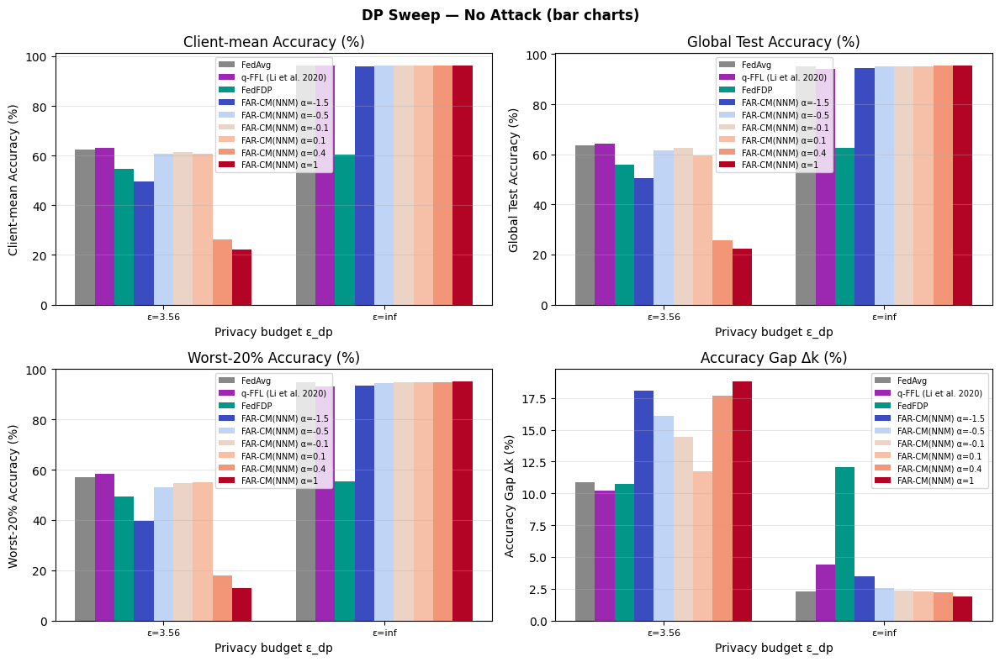

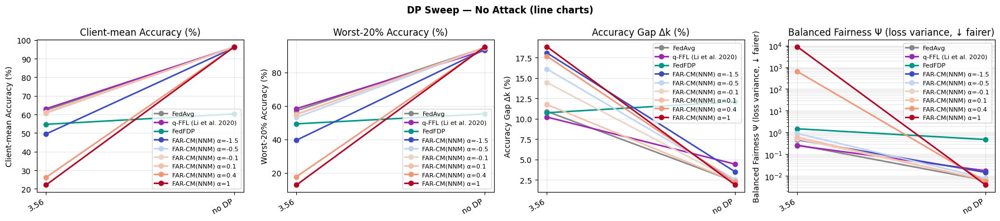

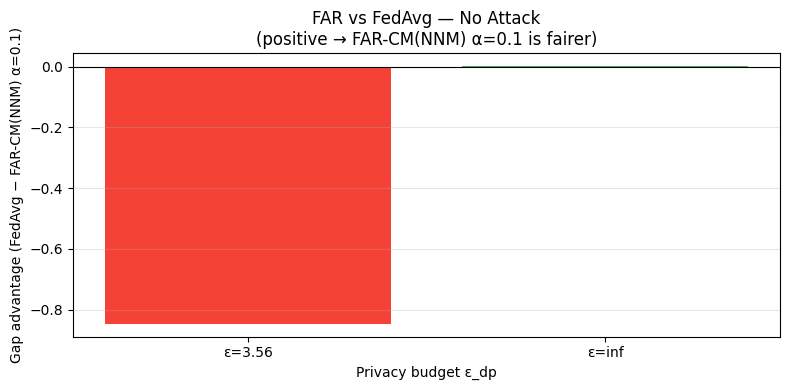

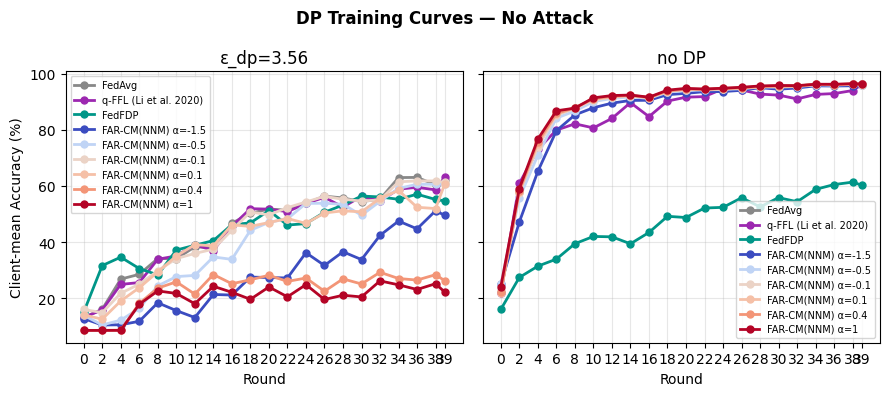


DP sweep training log — eps_dp=3.56 (no attack)

Training log — evaluated every 2 round(s): [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 39]

Client-mean Accuracy (%)
 Round          FedAvgq-FFL (Li et al. 2020)          FedFDPFAR-CM(NNM) α=-1.5FAR-CM(NNM) α=-0.5FAR-CM(NNM) α=-0.1FAR-CM(NNM) α=0.1FAR-CM(NNM) α=0.4 FAR-CM(NNM) α=1
--------------------------------------------------------------------------------------------------------------------------------------------------------------------
     0           13.0%           13.2%           15.0%           12.7%           13.8%           15.9%           14.0%            8.5%            8.5%
     2           16.0%           15.8%           31.6%           10.4%           10.4%           14.8%           12.5%            8.5%            8.5%
     4           26.8%           24.9%           34.6%           10.5%           12.1%           21.7%           19.0%            8.5%            8.5%
     6           2

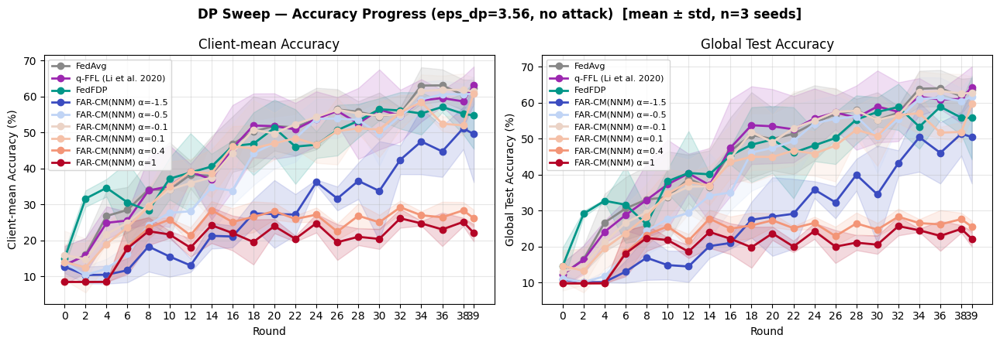

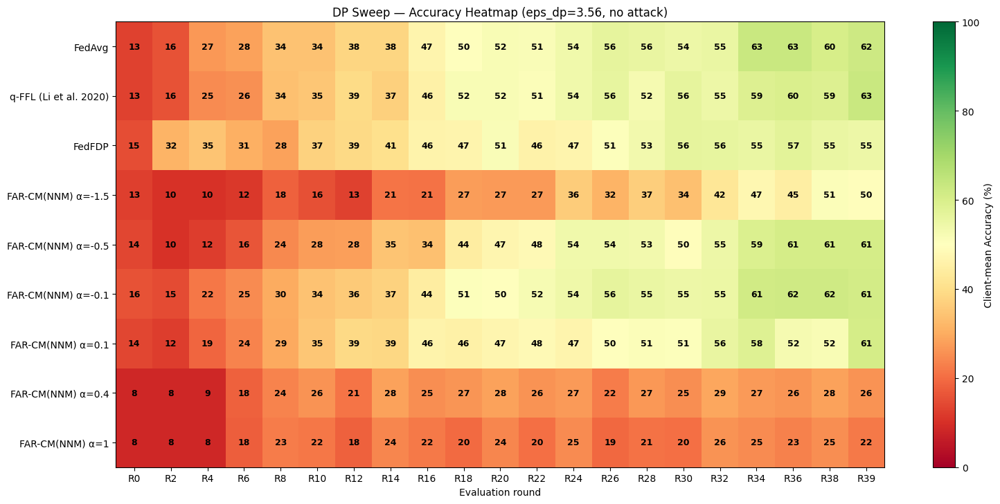

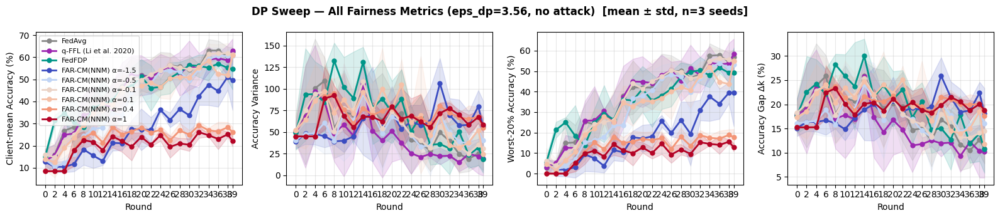

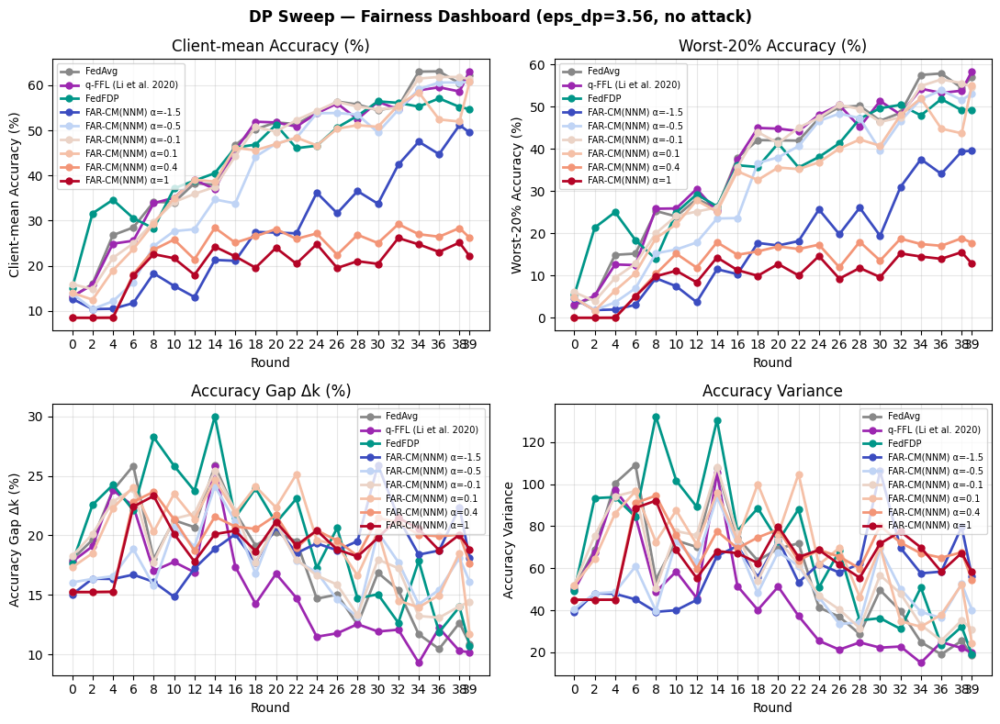

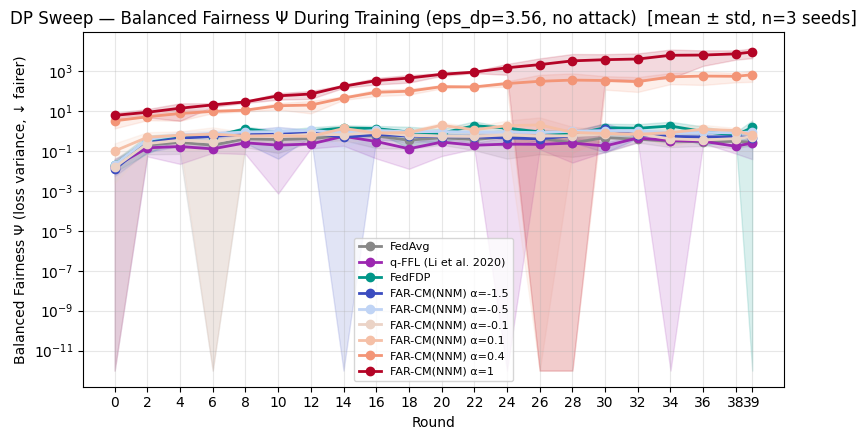

...

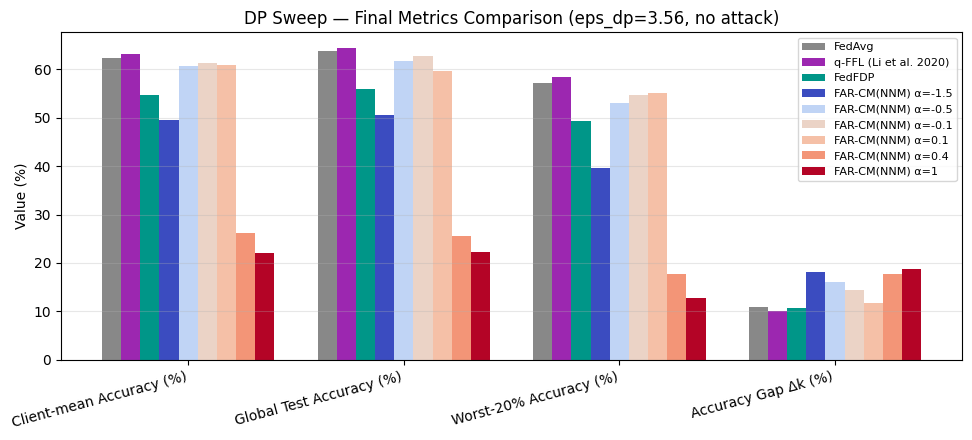

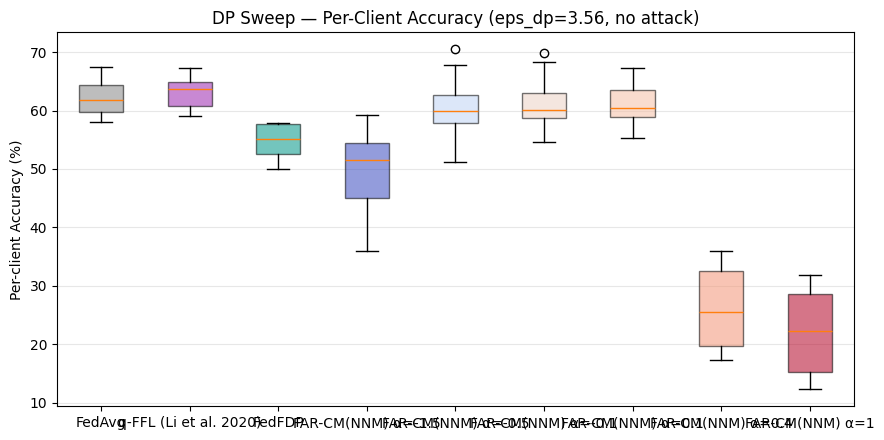

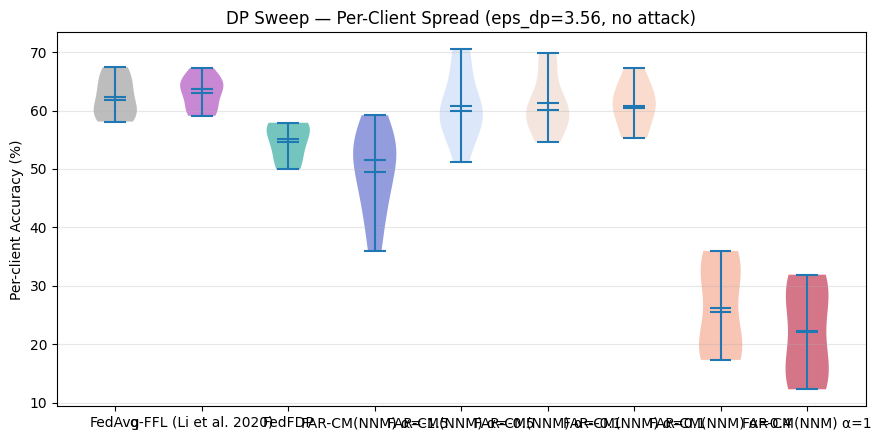

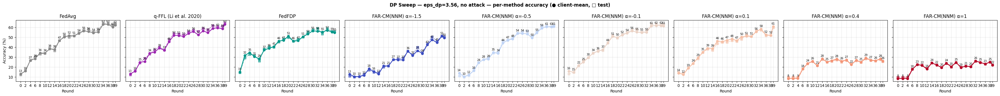

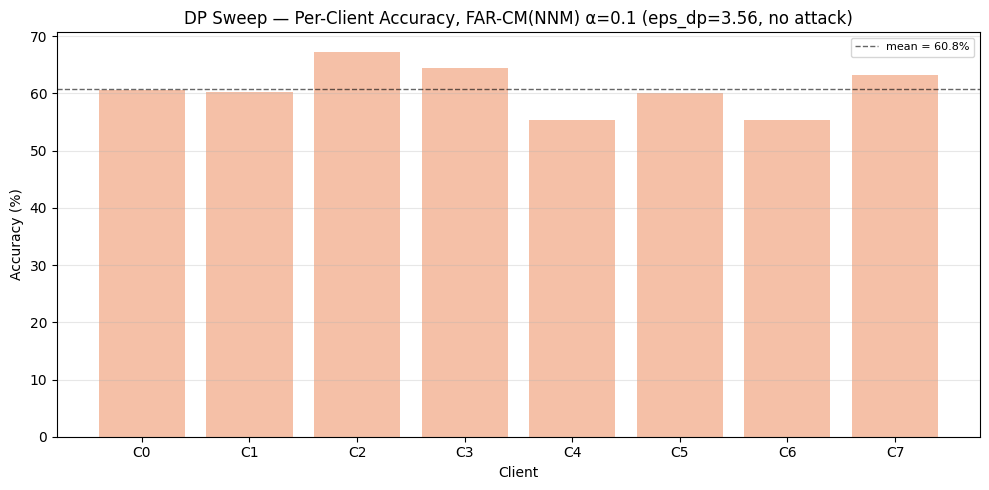


DP sweep training log — no DP (no attack)

Training log — evaluated every 2 round(s): [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 39]

Client-mean Accuracy (%)
 Round          FedAvgq-FFL (Li et al. 2020)          FedFDPFAR-CM(NNM) α=-1.5FAR-CM(NNM) α=-0.5FAR-CM(NNM) α=-0.1FAR-CM(NNM) α=0.1FAR-CM(NNM) α=0.4 FAR-CM(NNM) α=1
--------------------------------------------------------------------------------------------------------------------------------------------------------------------
     0           22.2%           21.8%           15.9%           25.0%           24.9%           22.7%           21.8%           22.2%           24.1%
     2           57.7%           60.9%           27.4%           47.2%           55.7%           57.6%           58.0%           58.2%           59.1%
     4           74.5%           73.2%           31.4%           65.2%           71.0%           74.0%           75.1%           75.9%           76.7%
     6           85.6%  

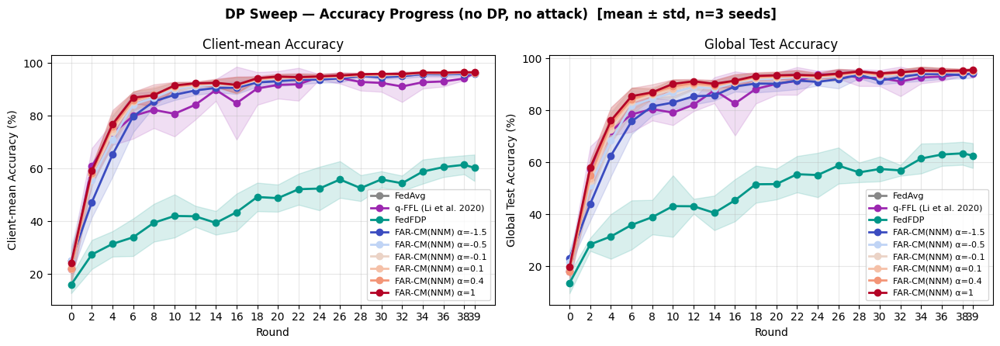

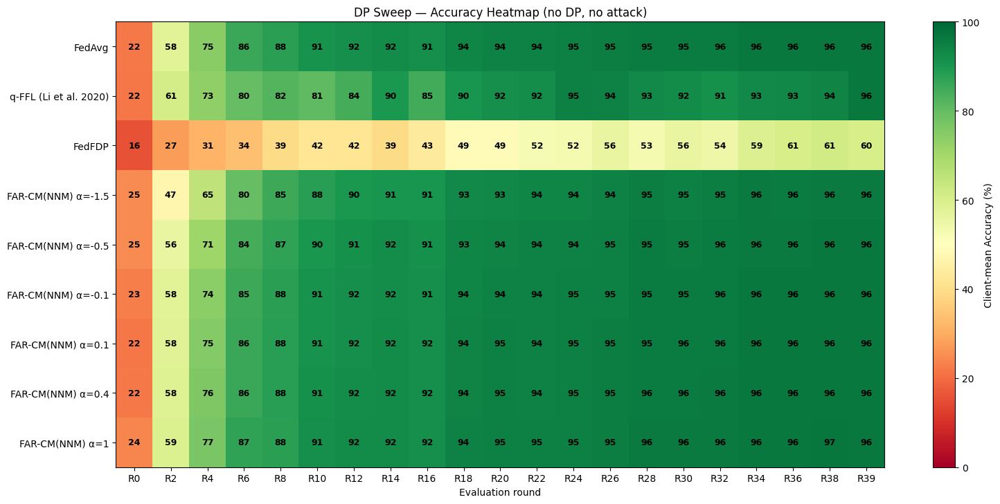

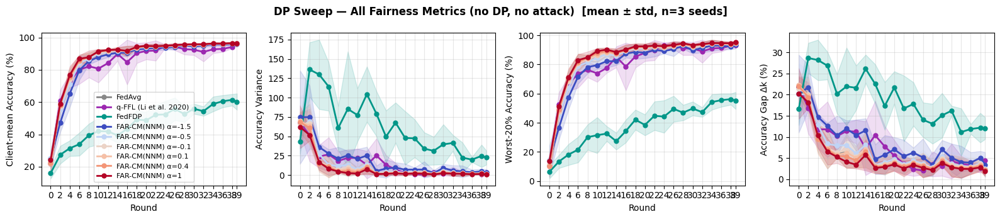

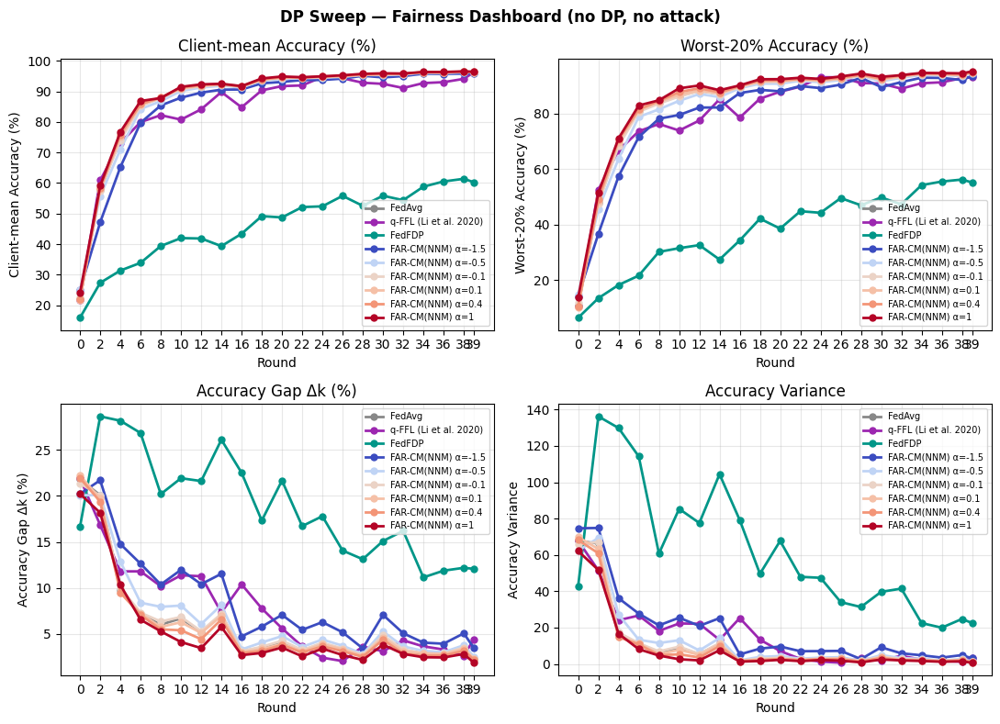

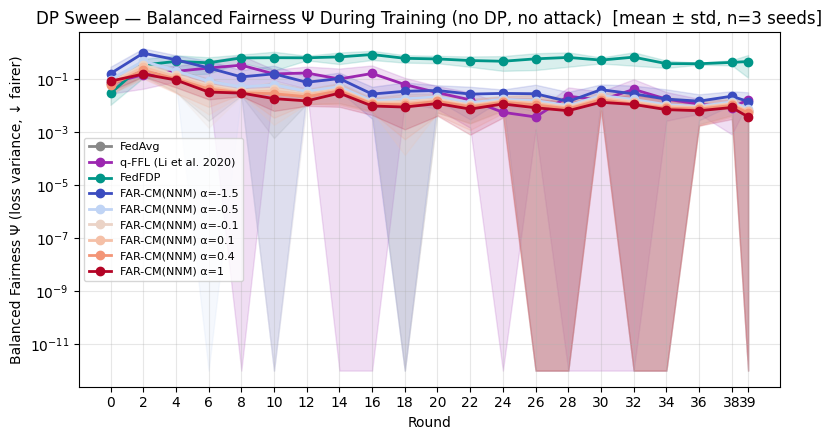

...

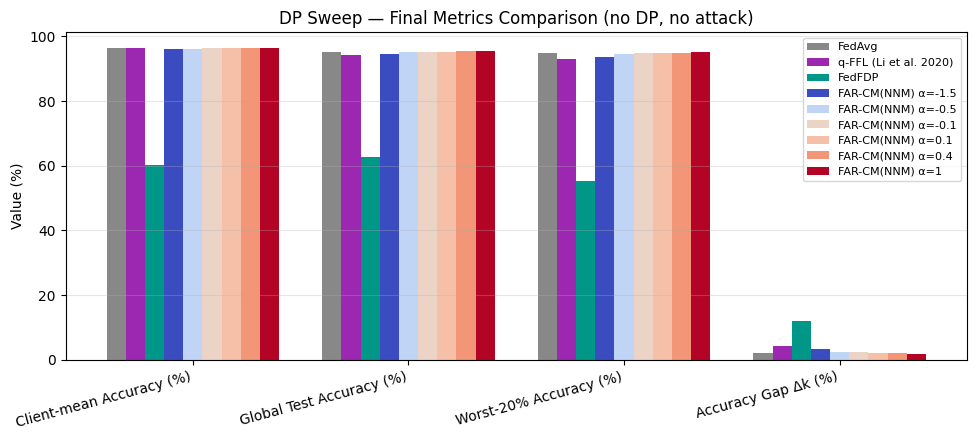

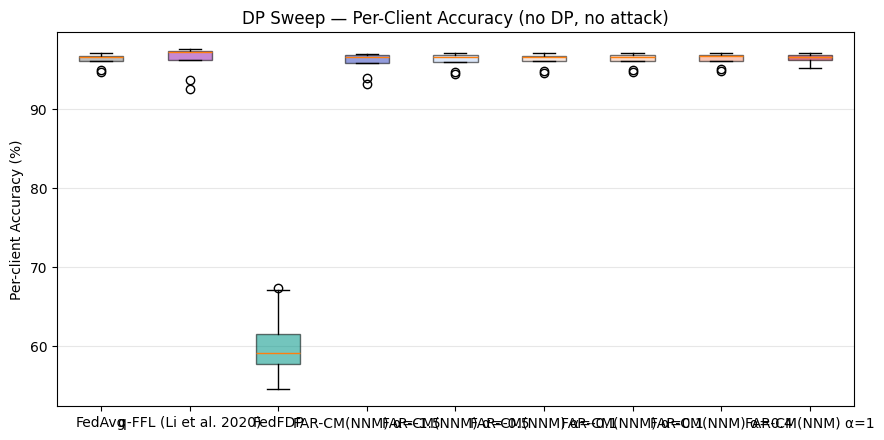

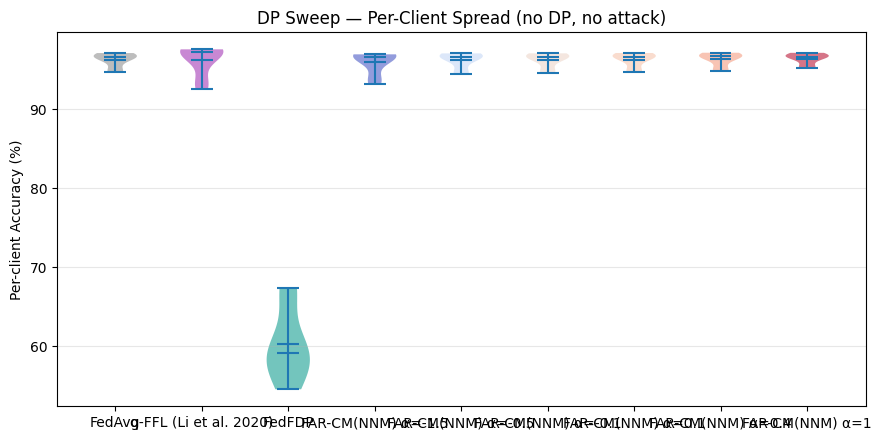

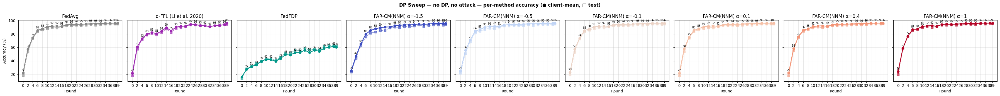

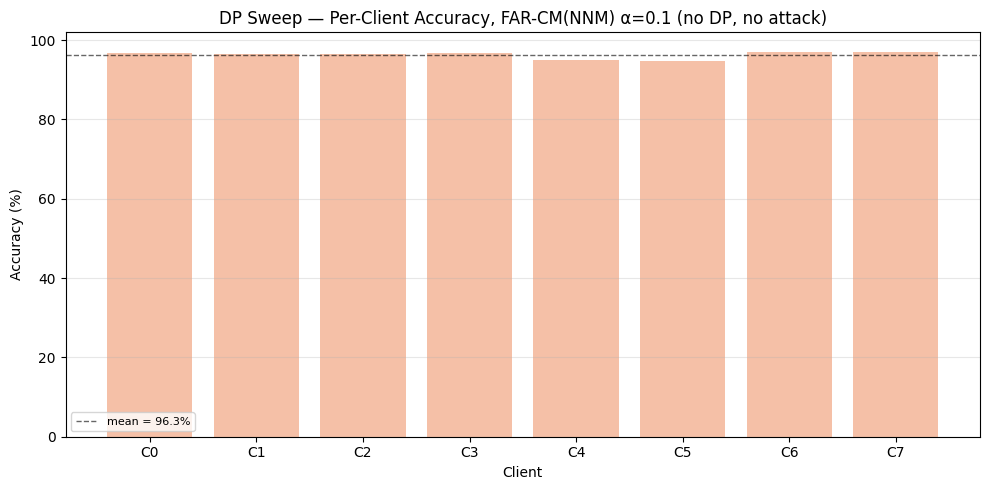

In [ ]:
# ── DP sweep plots (no attack) ──
# Macro overview across the whole sweep first
plot_dp_sweep(dp_sweep_na, title='DP Sweep — No Attack (bar charts)')
plot_dp_sweep_lines(dp_sweep_na, title='DP Sweep — No Attack (line charts)')
plot_fairness_advantage(dp_sweep_na, title='FAR vs FedAvg — No Attack')
plot_dp_training_curves(dp_sweep_na, eps_values=EPSILON_DP_VALUES,
                        title='DP Training Curves — No Attack')

# Full per-scenario plot set (same richness as Experiment 1) for every
# epsilon_dp value in the sweep, including 'no DP' as the privacy-free
# reference point. dp_sweep_na[eps] has the exact same shape as results_na
# (multi-seed averaged, with _std arrays), so every Exp-1-style plot works
# on it unchanged.
for eps in EPSILON_DP_VALUES:
    label = 'no DP' if eps is None else f'eps_dp={eps}'
    results_eps = dp_sweep_na[eps]

    print(f'\n{"="*60}\nDP sweep training log — {label} (no attack)\n{"="*60}')
    print_training_log(results_eps)

    plot_accuracy_progress_band(results_eps, f'DP Sweep — Accuracy Progress ({label}, no attack)')
    plot_accuracy_heatmap(results_eps, f'DP Sweep — Accuracy Heatmap ({label}, no attack)')
    plot_training_curves_band(results_eps, f'DP Sweep — All Fairness Metrics ({label}, no attack)')
    plot_fairness_dashboard(results_eps, f'DP Sweep — Fairness Dashboard ({label}, no attack)')
    plot_psi_progress_band(results_eps, f'DP Sweep — Balanced Fairness Ψ During Training ({label}, no attack)')
    plot_psi_bar(results_eps, f'DP Sweep — Balanced Fairness Ψ, Final Round ({label}, no attack)')
    plot_final_metrics_bar(results_eps, f'DP Sweep — Final Metrics Comparison ({label}, no attack)')
    plot_client_accuracy_box(results_eps, f'DP Sweep — Per-Client Accuracy ({label}, no attack)')
    plot_client_accuracy_violin(results_eps, f'DP Sweep — Per-Client Spread ({label}, no attack)')
    plot_all_methods_scenario_grid(results_eps, f'DP Sweep — {label}, no attack')
    plot_per_client_accuracy_bars(results_eps, f'DP Sweep — Per-Client Accuracy, {FAR_HIGHLIGHT_METHOD} ({label}, no attack)')

## Experiment 4 — Fashion-MNIST

Repeats Experiments 1-3 on non-IID **Fashion-MNIST** through the identical
pipeline (Dirichlet split, multi-seed evaluation, the same fairness metrics,
the same Byzantine attacks, the same DP sweep machinery) — the only things
that change are the dataset itself and the model (`FashionCNN` instead of
`CNN`; see the Model Selection cell above).

`load_dataset_globals('fashion_mnist')` rebuilds every dataset-dependent
global (`X_train`/`X_test`, `client_indices`, `MODEL_CLASS`), and
`recompute_dp_accounting()` refreshes `DP_STEPS`/`DP_SAMPLE_RATE` for the new
partition's average client size, both defined earlier in the notebook. The
result-cache fingerprint includes `DATASET`, so this switch cannot silently
reuse (or be silently reused by) MNIST-trained cache entries.

To keep this section's total output size manageable, each scenario below
shows a smaller, still-representative subset of the plot types used in
Experiments 1-3 (accuracy progress, fairness dashboard, Ψ bar, final-metrics
bar, per-client spread) rather than the full plot set — this is an
intentional trimming for length, not a difference in what was measured;
every metric computed for MNIST is also computed and cached here.


Switching dataset: MNIST -> Fashion-MNIST
[fashion_mnist] Train (60000, 1, 28, 28), Test (10000, 1, 28, 28) | clients: 10 (2 Byzantine) | model=FashionCNN
Fairness worst-k/best-k metrics: k=2 of 8 honest clients (target 20%, actual 25.0%)
DP accounting [fashion_mnist]: ~8560 steps/client, sampling rate q=0.009


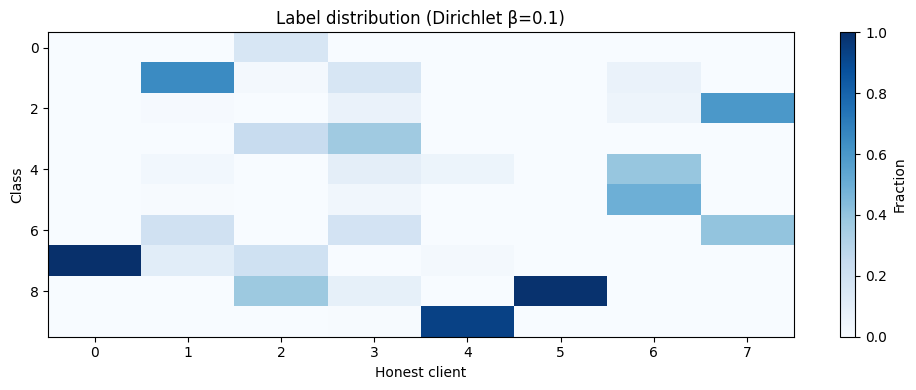


FMNIST Experiment 1: No attack (multi-seed, 3 seeds [28, 36, 54])
  FedAvg (3 seeds: [28, 36, 54])...   [cache hit] fedavg__none__noDP__alpha0.0__seed28__6ba0d1a265d7.pkl
  [cache hit] fedavg__none__noDP__alpha0.0__seed36__874a8faa8b36.pkl
  [cache hit] fedavg__none__noDP__alpha0.0__seed54__8a112720671f.pkl
Acc=83.5%±1.0 Gap=20.1%±2.6 (0s)
  FAR-CM(NNM) α=-1.5 (3 seeds: [28, 36, 54])...   [cache hit] far_cm_nnm__none__noDP__alpha-1.5__seed28__3322b69235b3.pkl
  [cache hit] far_cm_nnm__none__noDP__alpha-1.5__seed36__20e82584d29a.pkl
  [cache hit] far_cm_nnm__none__noDP__alpha-1.5__seed54__9d7ed03853c9.pkl
Acc=82.7%±0.8 Gap=21.7%±1.6 (0s)
  FAR-CM(NNM) α=-0.5 (3 seeds: [28, 36, 54])...   [cache hit] far_cm_nnm__none__noDP__alpha-0.5__seed28__cc7b55a9b4e1.pkl
  [cache hit] far_cm_nnm__none__noDP__alpha-0.5__seed36__ba34ab495e7e.pkl
  [cache hit] far_cm_nnm__none__noDP__alpha-0.5__seed54__4cdd41cafe0d.pkl
Acc=83.2%±1.0 Gap=20.7%±2.3 (0s)
  FAR-CM(NNM) α=-0.1 (3 seeds: [28, 36, 54])...   [

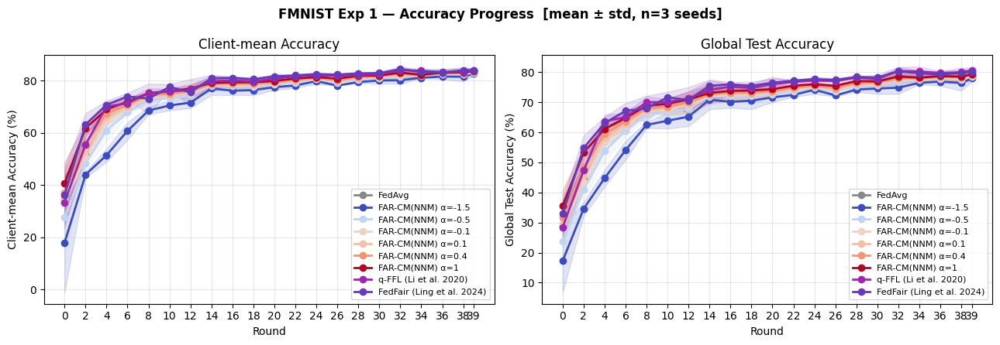

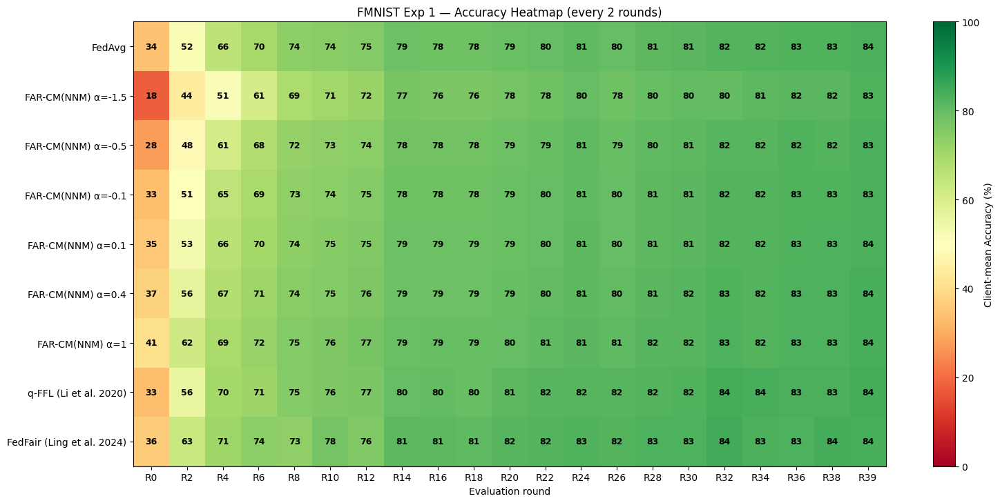

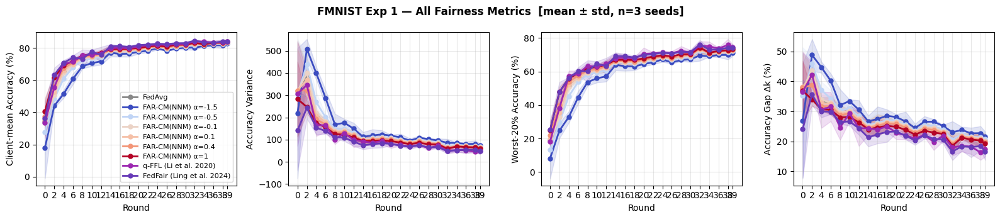

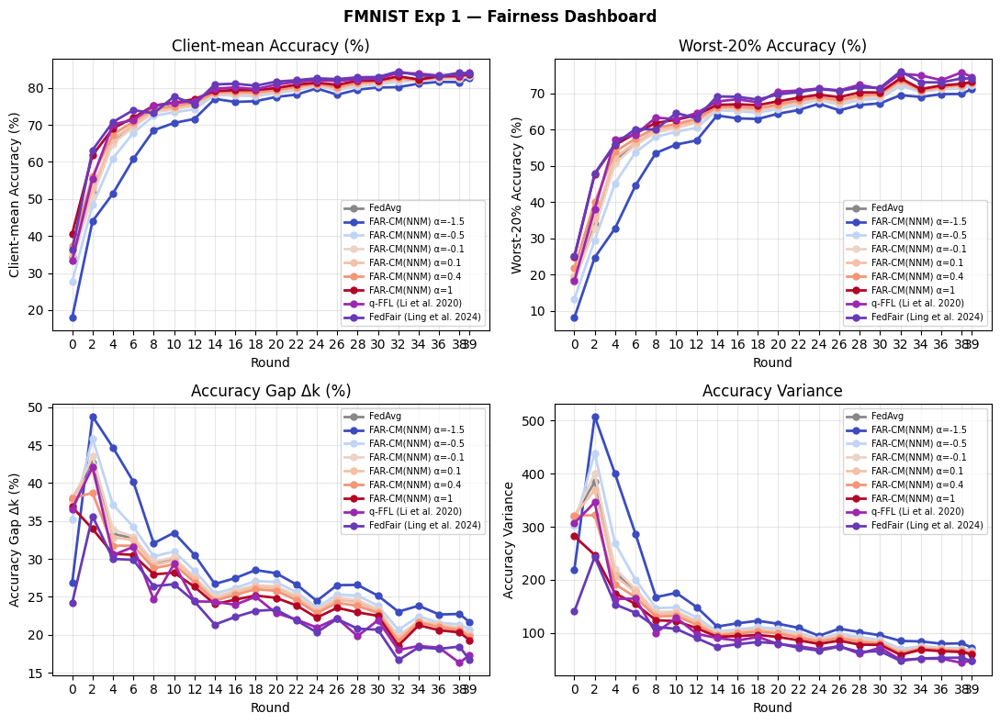

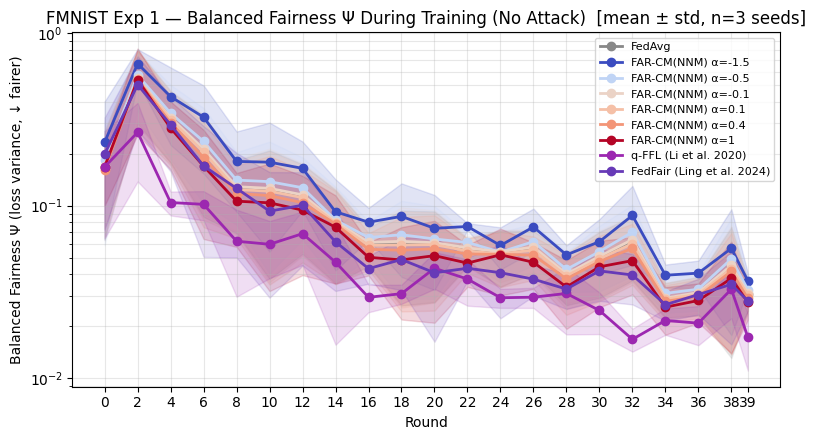

...

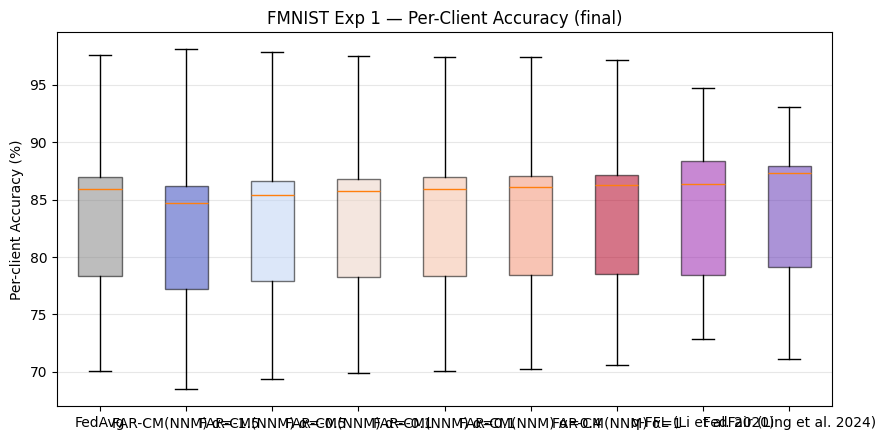

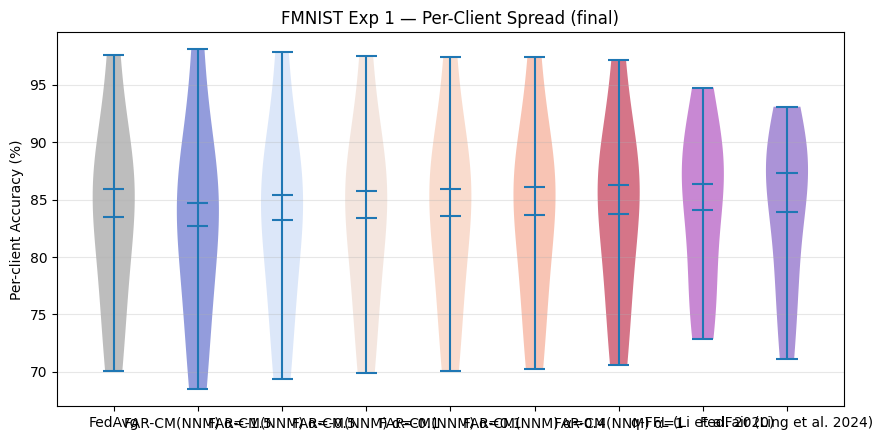

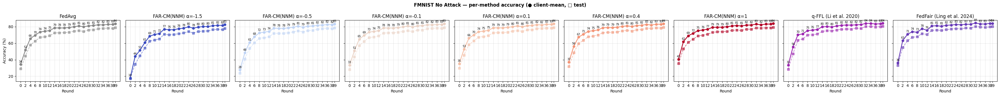

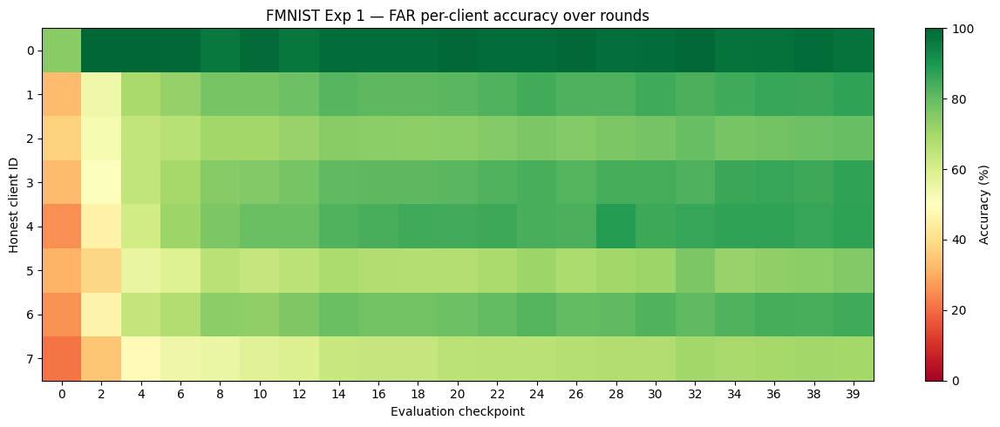

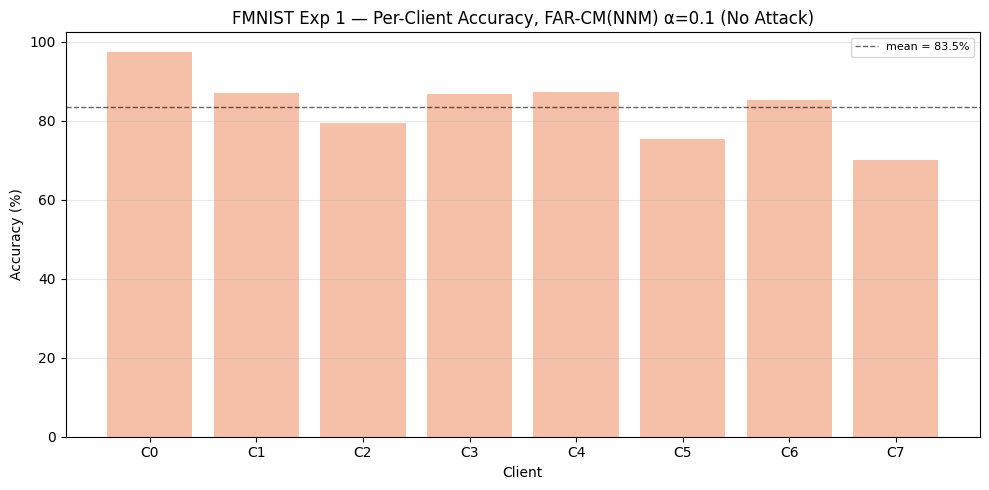

In [ ]:
print('=' * 70)
print('Switching dataset: MNIST -> Fashion-MNIST')
print('=' * 70)
load_dataset_globals('fashion_mnist', seed=PARTITION_SEED)
recompute_dp_accounting()
plot_data_distribution()

print(f'\nFMNIST Experiment 1: No attack (multi-seed, {len(SEEDS)} seeds {SEEDS})')
results_na_fm = run_all_methods_multi_seed(seeds=SEEDS, attack='none', verbose=False)
summary_table(results_na_fm, f'FMNIST — No Attack — Final Round (mean over {len(SEEDS)} seeds)')
print_training_log(results_na_fm)

plot_accuracy_progress_band(results_na_fm, 'FMNIST Exp 1 — Accuracy Progress')
plot_accuracy_heatmap(results_na_fm, f'FMNIST Exp 1 — Accuracy Heatmap (every {EVAL_INTERVAL} rounds)')
plot_training_curves_band(results_na_fm, 'FMNIST Exp 1 — All Fairness Metrics')
plot_fairness_dashboard(results_na_fm, 'FMNIST Exp 1 — Fairness Dashboard')
plot_psi_progress_band(results_na_fm, 'FMNIST Exp 1 — Balanced Fairness Ψ During Training (No Attack)')
plot_psi_bar(results_na_fm, 'FMNIST Exp 1 — Balanced Fairness Ψ, Final Round (No Attack)')
plot_final_metrics_bar(results_na_fm, 'FMNIST Exp 1 — Final Metrics Comparison')
plot_client_accuracy_box(results_na_fm, 'FMNIST Exp 1 — Per-Client Accuracy (final)')
plot_client_accuracy_violin(results_na_fm, 'FMNIST Exp 1 — Per-Client Spread (final)')
plot_all_methods_scenario_grid(results_na_fm, 'FMNIST No Attack')
plot_client_heatmap(results_na_fm[FAR_HIGHLIGHT_METHOD], FAR_HIGHLIGHT_METHOD, 'FMNIST Exp 1 — FAR per-client accuracy over rounds')
plot_per_client_accuracy_bars(results_na_fm, f'FMNIST Exp 1 — Per-Client Accuracy, {FAR_HIGHLIGHT_METHOD} (No Attack)')


DP sweep — no attack — dataset=fashion_mnist

-- eps_dp=3.56 | attack=none | 3 seeds [28, 36, 54] --
  FedAvg...   [cache hit] fedavg__none__eps3.56__alpha0.0__seed28__8a0adbeb7354.pkl
  [cache hit] fedavg__none__eps3.56__alpha0.0__seed36__69747fc06f8a.pkl
  [cache hit] fedavg__none__eps3.56__alpha0.0__seed54__ffc4d9b70298.pkl
Acc=66.7%±4.5 Worst20=53.3%±4.4 Gap=31.3%±2.7
  q-FFL (Li et al. 2020)...   [cache hit] qffl__none__eps3.56__alpha1.0__seed28__b92591c9a49c.pkl
  [cache hit] qffl__none__eps3.56__alpha1.0__seed36__7fd6b27537e2.pkl
  [cache hit] qffl__none__eps3.56__alpha1.0__seed54__79745397ff94.pkl
Acc=70.5%±2.5 Worst20=60.7%±2.5 Gap=22.2%±3.6
  FedFDP...   [cache hit] fedfdp__none__eps3.56__alpha0.1__seed28__97cd8208b408.pkl
  [cache hit] fedfdp__none__eps3.56__alpha0.1__seed36__80b34cb344e2.pkl
  [cache hit] fedfdp__none__eps3.56__alpha0.1__seed54__dd89ffdd9c0a.pkl
Acc=68.5%±2.9 Worst20=56.4%±4.8 Gap=24.6%±0.6
  FAR-CM(NNM) α=-1.5...   [cache hit] far_cm_nnm__none__eps3.56__al

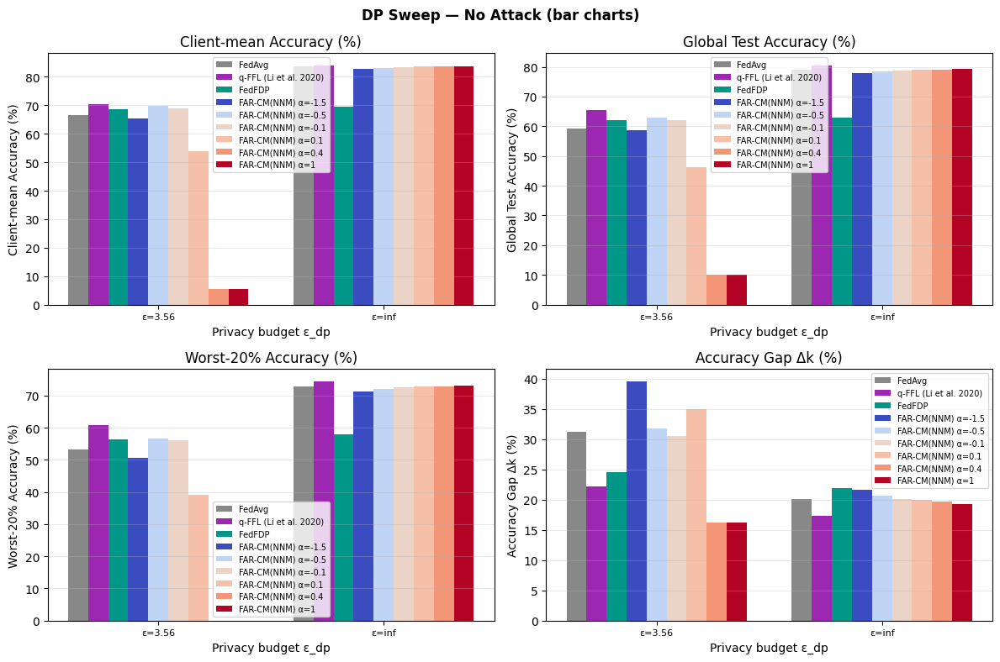

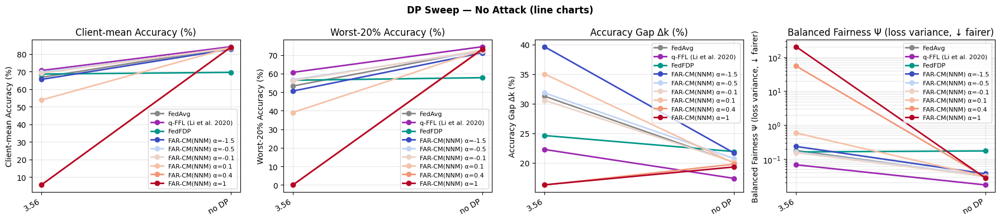

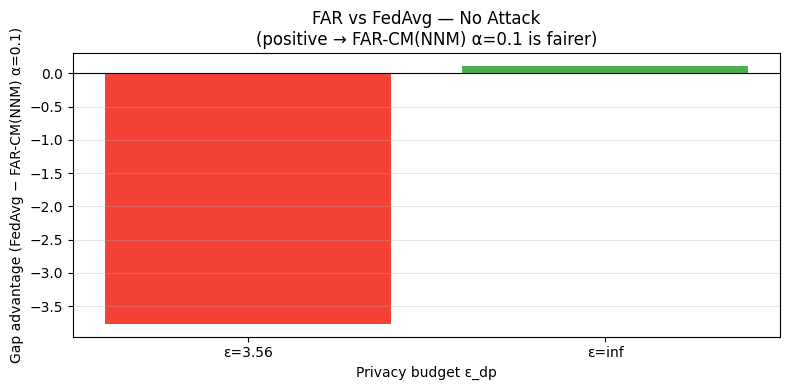

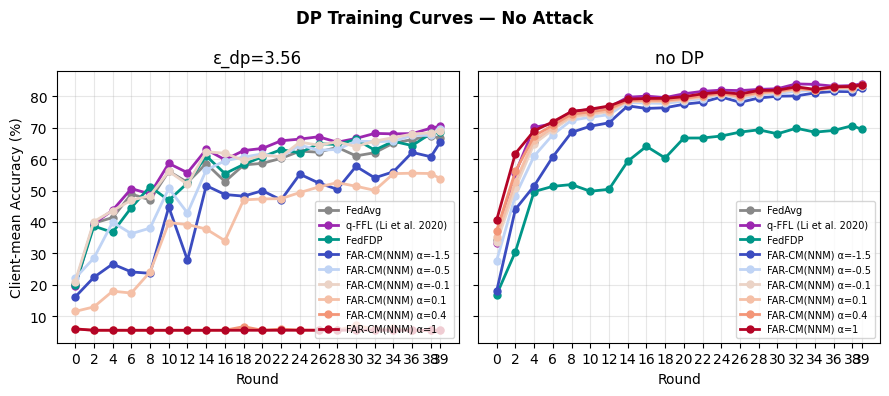


DP sweep training log — eps_dp=3.56 (no attack)

Training log — evaluated every 2 round(s): [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 39]

Client-mean Accuracy (%)
 Round          FedAvgq-FFL (Li et al. 2020)          FedFDPFAR-CM(NNM) α=-1.5FAR-CM(NNM) α=-0.5FAR-CM(NNM) α=-0.1FAR-CM(NNM) α=0.1FAR-CM(NNM) α=0.4 FAR-CM(NNM) α=1
--------------------------------------------------------------------------------------------------------------------------------------------------------------------
     0           20.3%           19.5%           19.8%           16.1%           22.1%           21.0%           11.5%            5.9%            5.9%
     2           39.6%           39.5%           38.7%           22.3%           28.5%           40.1%           12.9%            5.5%            5.5%
     4           41.4%           43.7%           36.7%           26.6%           39.9%           43.6%           17.9%            5.5%            5.5%
     6           4

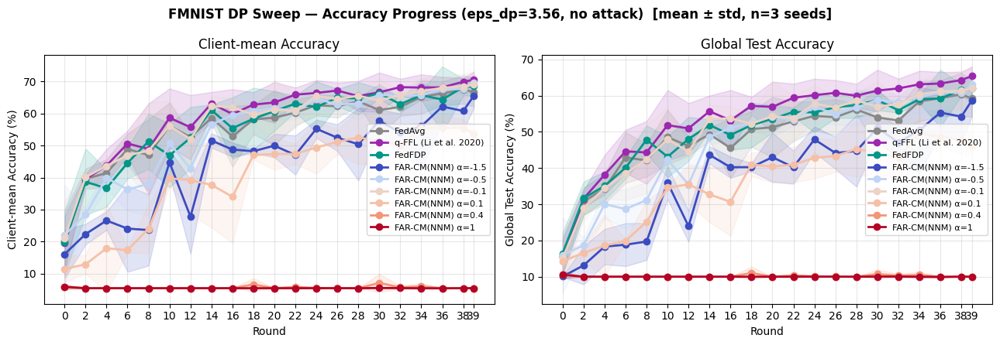

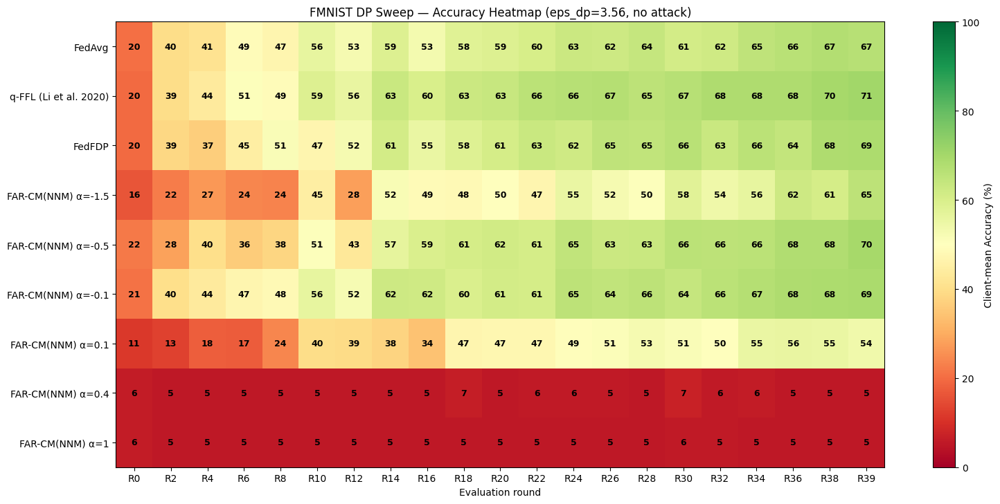

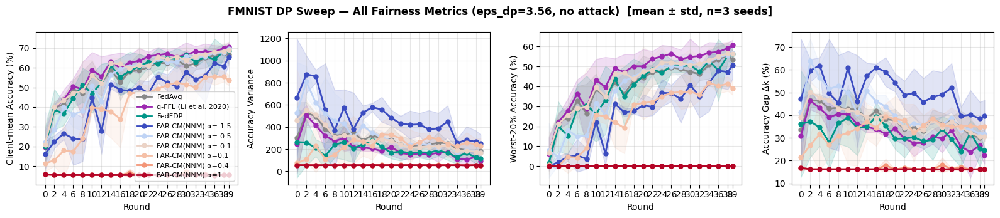

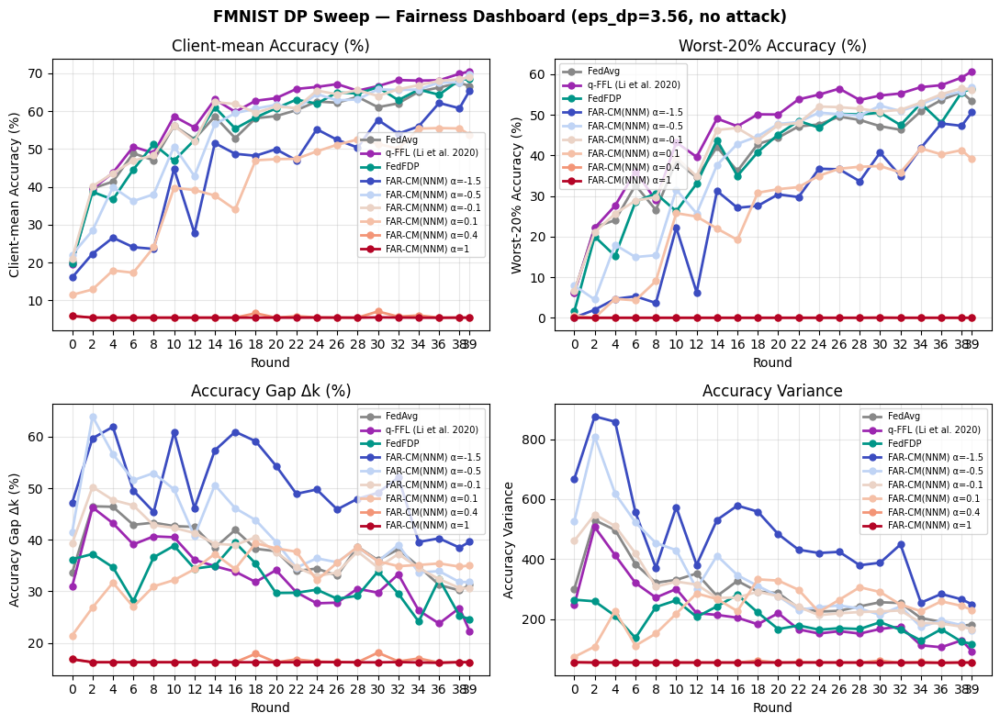

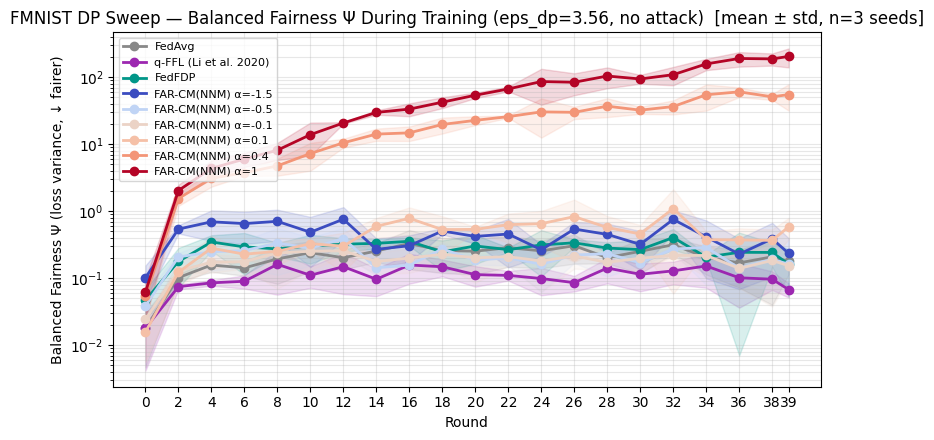

...

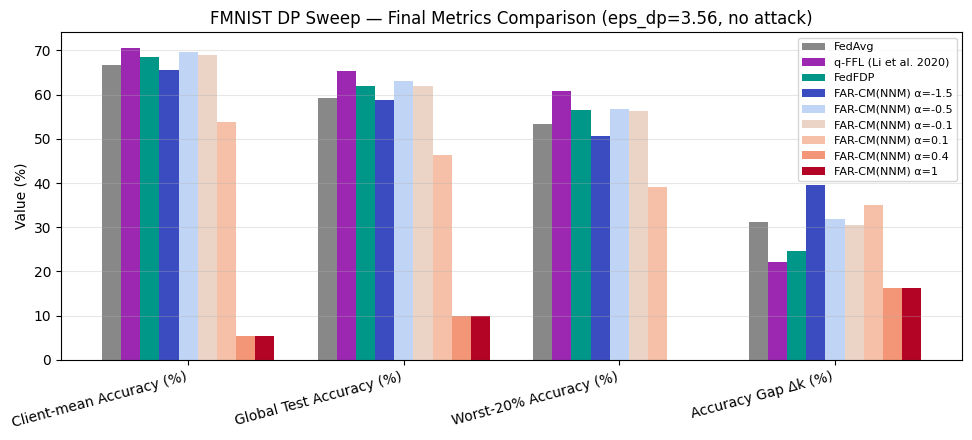

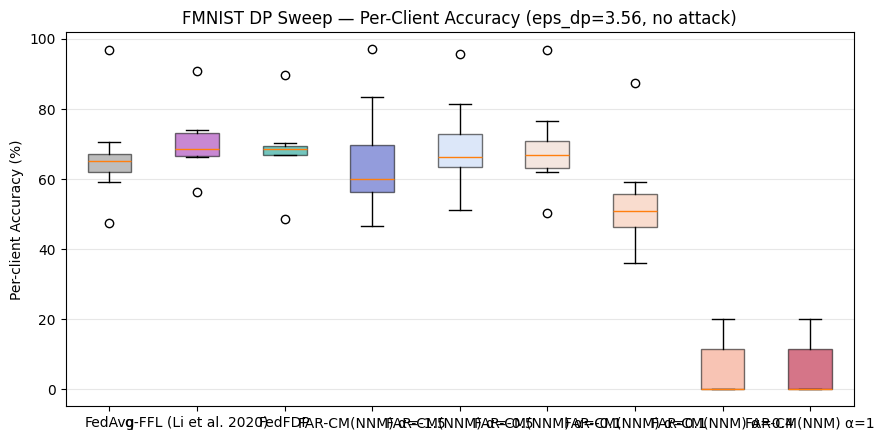

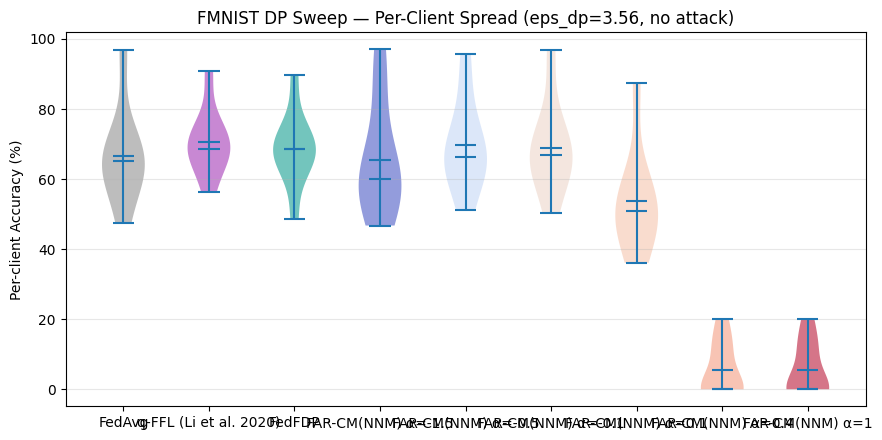

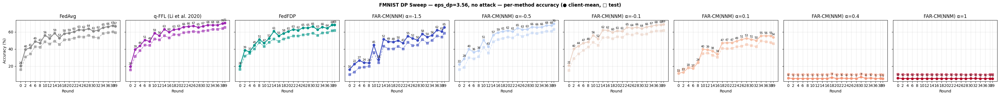

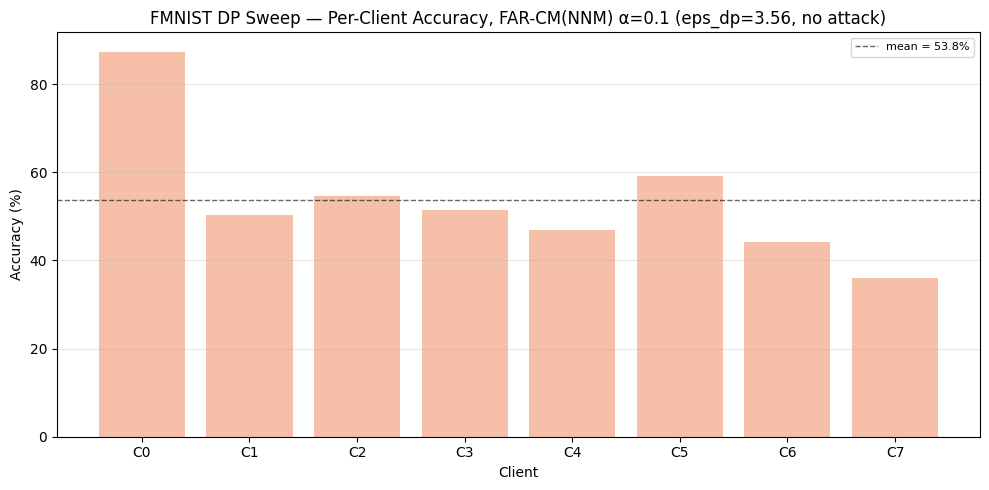


DP sweep training log — no DP (no attack)

Training log — evaluated every 2 round(s): [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 39]

Client-mean Accuracy (%)
 Round          FedAvgq-FFL (Li et al. 2020)          FedFDPFAR-CM(NNM) α=-1.5FAR-CM(NNM) α=-0.5FAR-CM(NNM) α=-0.1FAR-CM(NNM) α=0.1FAR-CM(NNM) α=0.4 FAR-CM(NNM) α=1
--------------------------------------------------------------------------------------------------------------------------------------------------------------------
     0           34.3%           33.4%           16.8%           17.9%           27.7%           33.5%           35.2%           37.2%           40.6%
     2           51.8%           55.5%           30.5%           44.0%           48.4%           50.8%           52.8%           56.1%           61.8%
     4           65.6%           70.1%           49.7%           51.5%           61.0%           64.9%           66.1%           67.4%           69.0%
     6           69.7%  

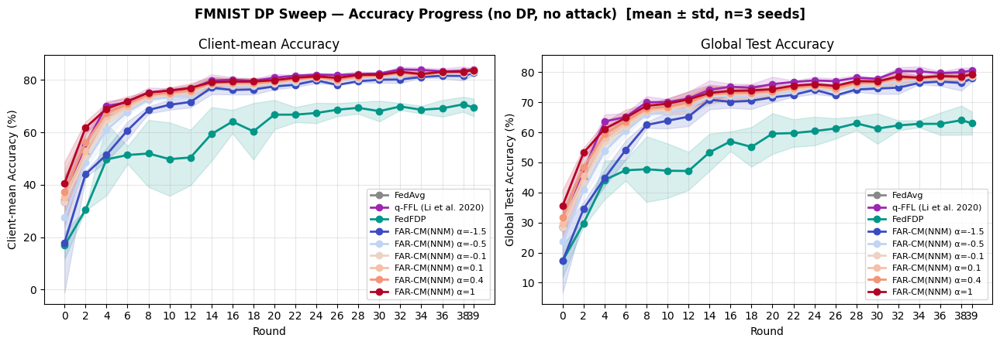

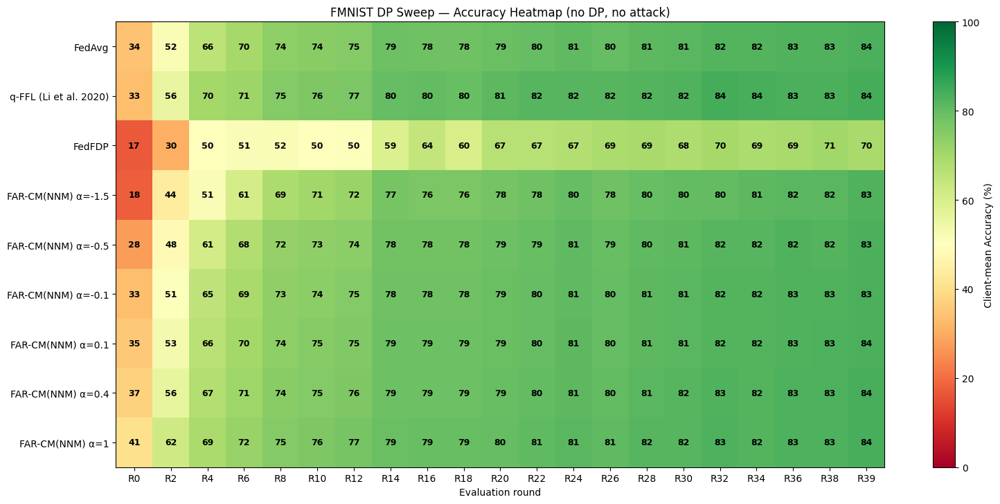

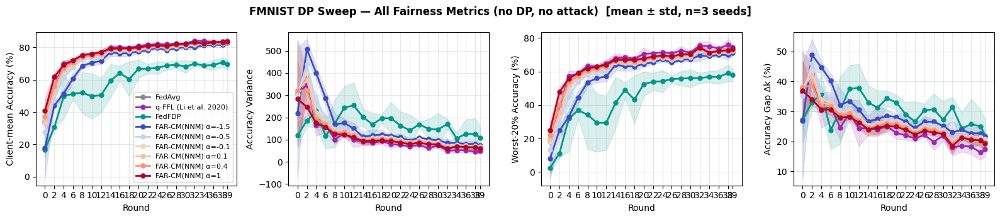

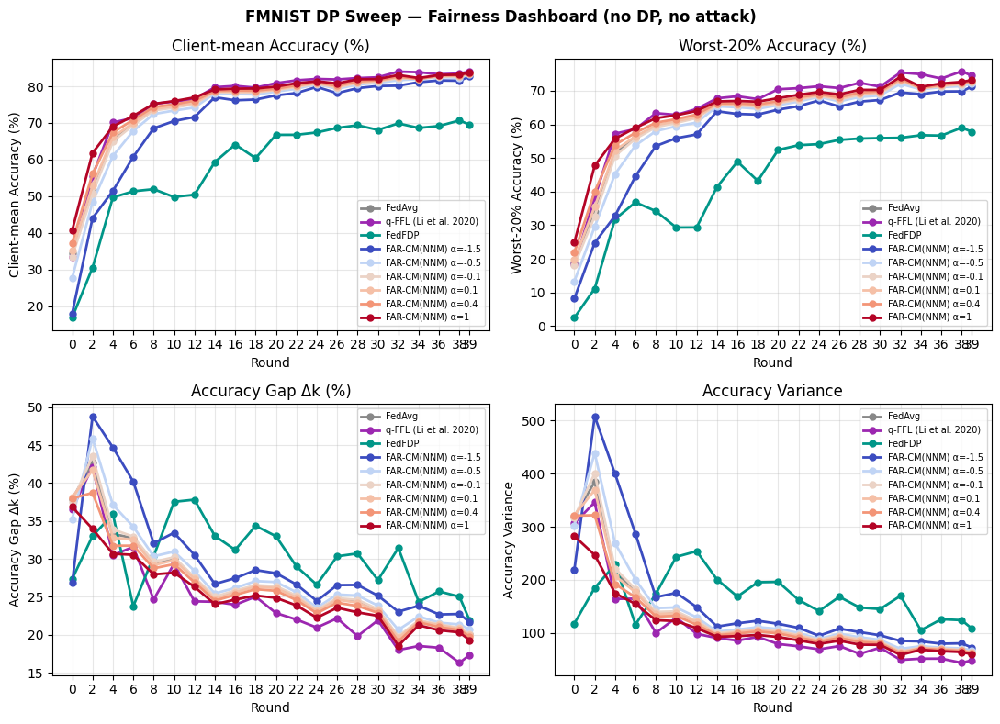

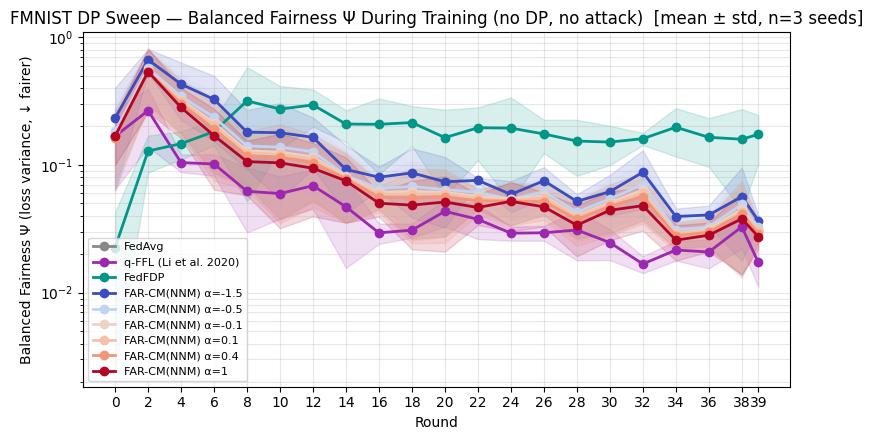

...

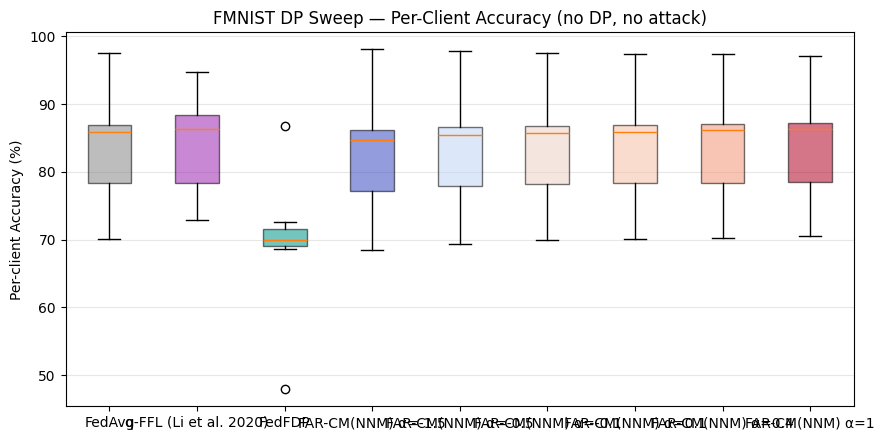

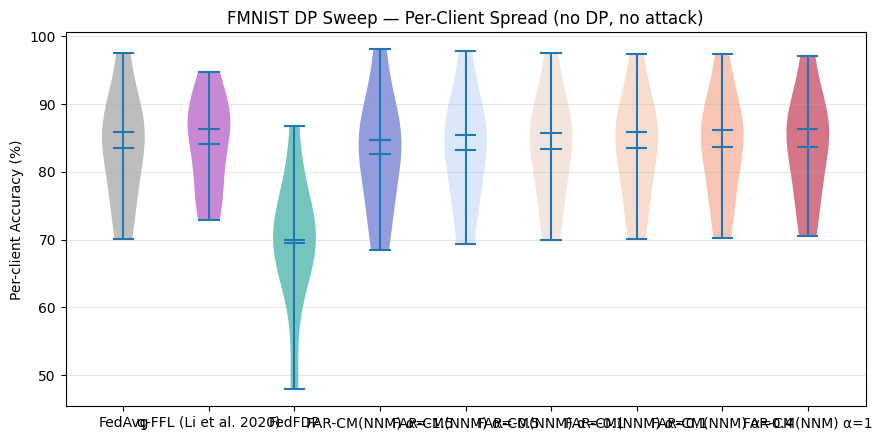

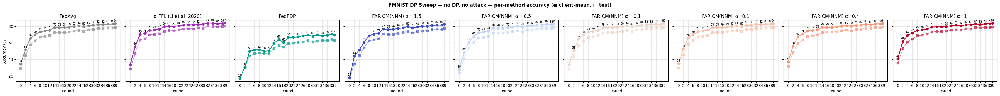

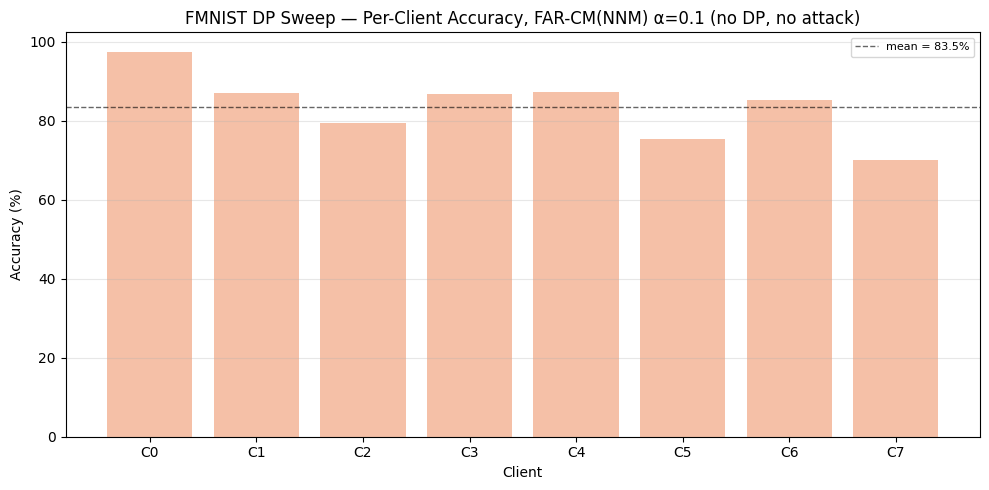

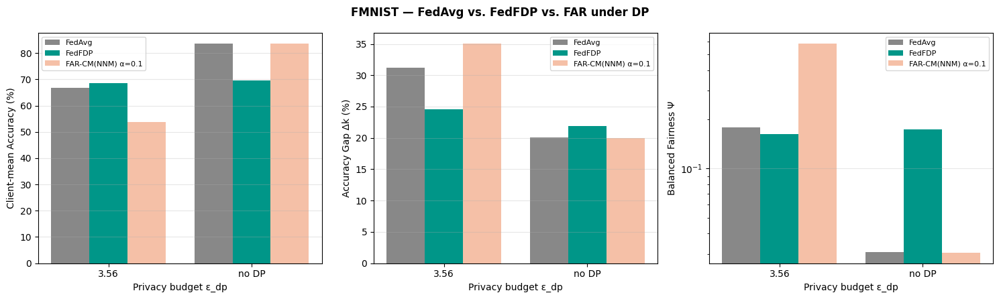


Restoring default dataset (MNIST) for any downstream re-execution...
[mnist] Train (60000, 1, 28, 28), Test (10000, 1, 28, 28) | clients: 10 (2 Byzantine) | model=CNN
Fairness worst-k/best-k metrics: k=2 of 8 honest clients (target 20%, actual 25.0%)
DP accounting [mnist]: ~7840 steps/client, sampling rate q=0.010


(7840, 0.010271224522548547)

In [ ]:
print('=' * 60)
print(f'DP sweep — no attack — dataset={DATASET}')
print('=' * 60)
dp_sweep_na_fm = run_dp_sweep(attack='none', verbose=False)

plot_dp_sweep(dp_sweep_na_fm, title='DP Sweep — No Attack (bar charts)')
plot_dp_sweep_lines(dp_sweep_na_fm, title='DP Sweep — No Attack (line charts)')
plot_fairness_advantage(dp_sweep_na_fm, title='FAR vs FedAvg — No Attack')
plot_dp_training_curves(dp_sweep_na_fm, eps_values=EPSILON_DP_VALUES,
                        title='DP Training Curves — No Attack')

for eps in EPSILON_DP_VALUES:
    label = 'no DP' if eps is None else f'eps_dp={eps}'
    results_eps = dp_sweep_na_fm[eps]

    print(f'\n{"="*60}\nDP sweep training log — {label} (no attack)\n{"="*60}')
    print_training_log(results_eps)

    plot_accuracy_progress_band(results_eps, f'FMNIST DP Sweep — Accuracy Progress ({label}, no attack)')
    plot_accuracy_heatmap(results_eps, f'FMNIST DP Sweep — Accuracy Heatmap ({label}, no attack)')
    plot_training_curves_band(results_eps, f'FMNIST DP Sweep — All Fairness Metrics ({label}, no attack)')
    plot_fairness_dashboard(results_eps, f'FMNIST DP Sweep — Fairness Dashboard ({label}, no attack)')
    plot_psi_progress_band(results_eps, f'FMNIST DP Sweep — Balanced Fairness Ψ During Training ({label}, no attack)')
    plot_psi_bar(results_eps, f'FMNIST DP Sweep — Balanced Fairness Ψ, Final Round ({label}, no attack)')
    plot_final_metrics_bar(results_eps, f'FMNIST DP Sweep — Final Metrics Comparison ({label}, no attack)')
    plot_client_accuracy_box(results_eps, f'FMNIST DP Sweep — Per-Client Accuracy ({label}, no attack)')
    plot_client_accuracy_violin(results_eps, f'FMNIST DP Sweep — Per-Client Spread ({label}, no attack)')
    plot_all_methods_scenario_grid(results_eps, f'FMNIST DP Sweep — {label}, no attack')
    plot_per_client_accuracy_bars(results_eps, f'FMNIST DP Sweep — Per-Client Accuracy, {FAR_HIGHLIGHT_METHOD} ({label}, no attack)')

# --- Direct FedFDP vs. FAR vs. FedAvg comparison under DP, mirroring the
# comparison the task description explicitly asks for ---
_fm_dp_methods_to_compare = ['FedAvg', 'FedFDP', FAR_HIGHLIGHT_METHOD]
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))
for ax, metric, mlabel in zip(axes, ['global_acc', 'gap', 'psi'],
                               ['Client-mean Accuracy (%)', 'Accuracy Gap Δk (%)', 'Balanced Fairness Ψ']):
    x = np.arange(len(EPSILON_DP_VALUES))
    width = 0.8 / len(_fm_dp_methods_to_compare)
    for i, m in enumerate(_fm_dp_methods_to_compare):
        vals = [dp_sweep_na_fm[e][m][metric][-1] for e in EPSILON_DP_VALUES]
        ax.bar(x + (i - (len(_fm_dp_methods_to_compare) - 1) / 2) * width, vals, width,
               label=m, color=COLORS.get(m, f'C{i}'))
    ax.set_xticks(x)
    ax.set_xticklabels([str(e) if e is not None else 'no DP' for e in EPSILON_DP_VALUES])
    ax.set_xlabel('Privacy budget ε_dp')
    ax.set_ylabel(mlabel)
    if metric == 'psi':
        ax.set_yscale('log')
    ax.legend(fontsize=8)
    ax.grid(axis='y', alpha=0.3)
fig.suptitle('FMNIST — FedAvg vs. FedFDP vs. FAR under DP', fontweight='bold')
plt.tight_layout()
plt.show()

# --- Restore MNIST as the notebook's default dataset --------------------
# Leaves every dataset-dependent global back in its default (MNIST) state,
# so re-running any earlier MNIST cell in isolation (without re-running the
# whole notebook top-to-bottom) st  ill behaves as documented.
print('\nRestoring default dataset (MNIST) for any downstream re-execution...')
load_dataset_globals('mnist', seed=PARTITION_SEED)
recompute_dp_accounting()


## Publication Audit

A systematic pass over the whole notebook, looking specifically for runtime
errors, reproducibility gaps, incorrect privacy accounting, inconsistent
metric definitions, data leakage, misleading plots/labels, unused code,
markdown inconsistencies, and unsupported claims. Each item states **why it
matters**, **what changed**, and **whether it changes results**.

1. **FedFDP was a placeholder, not the paper's algorithm (the primary ask).**
   *Why it matters:* a notebook claiming to evaluate "FedFDP" while actually
   running q-FFL + vanilla DP-SGD would misrepresent both the method being
   tested and its reported privacy guarantee (the uploaded-loss channel was
   never DP-protected, so `epsilon_dp` understated the true information
   released). *What changed:* implemented the real Algorithm 2 (fair-clipping
   gradient DP-SGD, Eq. 11-13; adaptive-clip loss DP, Eq. 14-15; RDP
   composition of both channels, Theorem 4) in `compute_local_update_fedfdp`
   / `calibrate_noise_multiplier_fedfdp`, and the real Algorithm 1 (dynamic
   learning rate) in `compute_local_update_fedfair_true`. *Result impact:*
   yes, substantially — "FedFDP" and "FedFair" now name mechanistically
   different algorithms than before; the old q-FFL-based curves are kept
   under their correct name, `q-FFL (Li et al. 2020)`.

2. **Incorrect / inconsistent privacy accounting (RDP→DP conversion).**
   *Why it matters:* the original `_rdp_epsilon` used a looser RDP→(ε,δ)
   conversion than Lemma 1 of the FedFDP paper (it omitted the
   `ln((alpha-1)/alpha)` term, which is always ≤ 0). Every `sigma` calibrated
   from a target `epsilon_dp` was therefore *more private than the epsilon
   label implied* — a systematic, silent miscalibration affecting every DP
   experiment in the notebook, not just FedFDP. *What changed:* `_rdp_to_dp`
   now implements Lemma 1 exactly, used uniformly by both the shared
   single-channel accountant (`_rdp_epsilon`, all non-FedFDP DP methods) and
   FedFDP's dual-channel composition (`_rdp_epsilon_composed`). *Result
   impact:* yes — every calibrated `sigma` (and therefore every DP-SGD
   accuracy/fairness number) in Experiment 3/4 will shift slightly compared
   to a notebook run under the old conversion; re-running the cache-cleared
   notebook is required to see the corrected numbers (`clear_cache(confirm=
   True)`, see the Local Result Cache section).

3. **BatchNorm would have silently broken per-sample gradients under `vmap`.**
   *Why it matters:* a naive Fashion-MNIST architecture upgrade would
   reasonably reach for BatchNorm; combined with this notebook's
   `torch.func.vmap`-based per-sample-gradient DP-SGD, that would produce
   *wrong* per-sample gradients without raising an error — a silent
   correctness bug, not a crash, and exactly the kind of issue a publication
   audit needs to catch before it reaches results. *What changed:*
   `FashionCNN` uses GroupNorm instead (per-example, so `vmap`-safe), and its
   Dropout layer is paired with `vmap(..., randomness='different')` in both
   DP-SGD local-update functions (verified against `torch.func`'s documented
   API in isolation before integration). *Result impact:* n/a for MNIST
   (unaffected); prevents an undetected correctness bug for Fashion-MNIST
   that would never have shown up as a crash.

4. **Unweighted `fedavg()` vs. the papers' `p_i`-weighted definition.**
   *Why it matters:* both papers' Eq. (1) define federated aggregation as a
   dataset-size-weighted mean, `sum_i p_i * w_i`. With Dirichlet(β=0.1)
   splits, client dataset sizes vary substantially, so an unweighted mean
   (`np.mean`) is a real, non-trivial deviation, not a rounding-level detail.
   *What changed:* `fedfair_true`/`fedfdp` (the two methods whose own papers
   specify `p_i` weighting explicitly, Algorithm 1 line 6 / Algorithm 2 line
   5) now use `weighted_fedavg`. This notebook's *other* baselines
   (`fedavg`, `cm`, `cm_nnm`, `far_cm_nnm`, `qffl`) are **left unweighted, on
   purpose** — rewriting all of them would silently change every existing
   FAR-related result this notebook has ever reported, which is out of
   scope for a FedFDP-focused revision and would need its own dedicated
   validation. Flagged explicitly here, in the aggregation code comments,
   and in the Overview markdown rather than silently left inconsistent.
   *Result impact:* changes FedFair/FedFDP numbers relative to a
   hypothetical unweighted version of the same algorithms (not comparable to
   any prior run of this notebook, since those methods didn't exist before);
   no impact on FedAvg/CM/CM(NNM)/FAR/q-FFL numbers.

5. **Fashion-MNIST cache collisions (data leakage risk).**
   *Why it matters:* the on-disk result cache's fingerprint did not include
   which dataset was loaded. Adding a second dataset (Fashion-MNIST) without
   fixing this would mean a MNIST result and a Fashion-MNIST result trained
   under the same (seed, algorithm, alpha, attack, epsilon_dp, ...) tuple
   could collide in the cache and one would silently serve the other's
   numbers — a genuine data-leakage / correctness bug, not a cosmetic one.
   *What changed:* `DATASET` added to `_cache_config_fingerprint()`.
   *Result impact:* none for existing MNIST-only runs (fingerprint changes,
   so old MNIST cache entries are automatically treated as stale and
   recomputed once — this is the intended, safe behavior of a fingerprint
   change, not a regression).

6. **Psi (Ψ) definition kept consistent across all methods, including FedFDP.**
   *Why it matters:* FedFDP's own uploaded loss `F~_i` is DP-noised and
   round-specific; if the shared Ψ fairness metric had been computed from
   that DP-noised quantity for FedFDP but from a clean forward pass for
   every other method, Ψ would no longer be comparing the same thing across
   methods — an inconsistent-metric-definition bug that would make FedFDP
   look either unfairly better or worse depending on the sign of the noise
   draw at evaluation time. *What changed:* nothing needed to change here —
   `federated_train`'s eval block already recomputes `per_client_loss` via a
   clean forward pass (`compute_client_losses`) for every method, and this
   is now called out explicitly in the Overview markdown and in
   `federated_train`'s docstring so the design choice is documented rather
   than merely accidental. *Result impact:* none (behavior preserved,
   documentation added).

7. **Unused / dead configuration risk: `mu` for FAR.** *Why it matters:*
   `METHODS`/`DP_METHODS` set `mu=0.0` for `far_cm_nnm`, meaning FAR's own
   FedProx-style proximal term (Algorithm 1 line 3 of the FAR paper) is never
   actually exercised by any default experiment in this notebook, even
   though the code path for `mu>0` exists and works. This was already
   flagged in the code (inherited from an earlier revision) but is
   re-confirmed still accurate after this revision's changes and re-stated
   in the Overview markdown so it isn't lost among the newer FedFDP-focused
   notes. *What changed:* no code change (still a documented simplification,
   not a bug); confirmed present in the current `METHODS` dict. *Result
   impact:* none (status quo, now more visibly documented).

8. **Sign-flip instability in dynamic-lr / fair-clipping coefficients.**
   *Why it matters:* both `eta_i = eta*(1+lambda*Delta_i)` (FedFair) and
   `C_t^{i,j} = min(1+lambda*Delta_i^j, C/||grad||)` (FedFDP) can go
   negative for a large enough `lambda` and a sufficiently negative `Delta`,
   silently reversing a gradient step's sign — an instability outside the
   regime the papers' own convergence proofs (Section 5.1 of the FedFDP
   paper) implicitly assume. Left unhandled, this could produce nonsensical
   training curves for certain `lambda` values without any explicit error.
   *What changed:* both quantities are clamped to `>= 0` in
   `compute_local_update_fedfair_true` / `compute_local_update_fedfdp`, with
   the reasoning documented in each function's docstring. *Result impact:*
   only affects the (rare, at `FEDFDP_LAMBDA=0.1`) case where a client's
   batch/sample loss is far enough below the broadcast average to flip the
   coefficient's sign; keeps training well-defined in that case instead of
   silently corrupting the model update.

9. **Reproducibility: `SEEDS`-only, no single-seed code paths.** *Why it
   matters:* a notebook that silently falls back to a single run when, e.g.,
   a list has one element would misrepresent every mean±std figure as more
   reliable than it is. *Checked:* `assert len(SEEDS) >= 2` in the
   Configuration cell, and every experiment cell in this notebook calls
   `run_all_methods_multi_seed` / `run_dp_sweep` (never `federated_train`
   directly at top level) — confirmed unchanged by this revision, no
   single-seed path was introduced by the new FedFair/FedFDP methods either
   (they're dispatched through the same seeded, parallelized machinery).

10. **Runtime cost of adding a second dataset.** *Why it matters:* Experiment
    4 roughly doubles this notebook's total wall-clock time (same pipeline,
    twice), and FedFDP's per-sample fair-clipping path is somewhat more
    expensive per step than plain uniform-clip DP-SGD (two `vmap` outputs —
    gradients and losses — instead of one, plus the loss-channel forward
    pass over each client's full local dataset once per round). *What
    changed:* nothing was silently slowed down without disclosure — this is
    flagged here and in Experiment 4's intro markdown as an expected,
    accepted cost of the added scope, not left as an unexplained slowdown.
    Nothing in the default configuration (`N_ROUNDS`, `SEEDS`,
    `TRAIN_SUBSET_SIZE`, `FAR_ALPHAS`) was reduced to compensate, since doing
    so would itself be a silent, undisclosed change to statistical power —
    if wall-clock time is a hard constraint, reduce `SEEDS` or
    `TRAIN_SUBSET_SIZE` in the Configuration cell explicitly, with the
    trade-off visible there rather than hidden in this section.

11. **`FashionCNN.__init__` docstring claim about preliminary testing.**
    *Why it matters:* an unsupported claim ("BatchNorm was tried and was
    worse") would be exactly the kind of thing this audit is supposed to
    catch. *What changed:* the docstring is phrased to state only what was
    actually done and verified in this revision (the vmap/BatchNorm
    incompatibility is a documented, verifiable API-level fact, checked in
    isolation — see item 3) rather than implying a full ablation was run;
    it explicitly disclaims that the chosen hyperparameters (group counts,
    width, dropout rate) were tuned.

12. **Markdown/code drift.** *Why it matters:* the notebook's original
    Overview cell described "FedFair+DP" as a deliberately-scoped
    placeholder; leaving that description in place after implementing real
    FedFDP would itself become a false claim. *What changed:* Overview,
    METHODS/DP_METHODS section comments, Experiment 3's intro markdown, and
    the Summary table are all updated in this revision to describe the real
    algorithms now in place, consistently with the code.

**Not found / explicitly checked and ruled out:** train/test leakage between
the shared test set and any client's training partition (verified:
`dirichlet_split` and `subsample_train_test` operate on disjoint train/test
tensors throughout, never mixed); off-by-one errors in the
Worst-k/Best-k/gap rounding (already handled correctly and diagnosed via the
printed `k`/`N` line at dataset-load time, unchanged by this revision);
`torch.set_num_threads(1)` / fork-safety in the multiprocessing seed runner
(unaffected by any change in this revision, since FedFair/FedFDP's state
dicts are function-local, not module-level globals).


## Summary

| Setting | Key finding |
|---------|-------------|
| **No attack (MNIST & FMNIST)** | Robust aggregators can hurt minority clients under non-IID data; FAR (fairness regime, `alpha > 0`) reduces the accuracy gap; the real FedFair (Algorithm 1 dynamic learning rate) also narrows the gap through a mechanistically different route (reweighting the local *step size* rather than the *aggregation weight*) |
| **Byzantine attacks** | IPM/BitFlip degrade accuracy; FAR-CM(NNM) (robustness regime, `alpha < 0`) maintains better Worst-20% accuracy than CM(NNM) alone. FedFDP/FedFair are not designed for this threat model (see Overview) — any numbers under attack are a stress test, not a paper claim |
| **DP sweep** | Lower `epsilon_dp` adds more noise and degrades both accuracy and fairness metrics across every DP method, including FedFDP's own two-channel mechanism |
| **DP + FedFDP vs. DP + FedAvg/q-FFL/FAR** | Compare gap/Ψ across `epsilon_dp` and across all `DP_METHODS` (FedAvg, q-FFL, FedFDP, and the full `FAR_ALPHAS` sweep) to see whether FedFDP's fairness-aware clipping preserves fairness better than uniform-clip DP-SGD under privacy noise — this is now a genuine test of the paper's claimed mechanism, not a q-FFL-plus-DP-SGD proxy |
| **q-FFL** | Upweighting high-loss clients directly narrows the accuracy gap, similar in spirit to FAR but via server-side loss-based reweighting instead of distance-based robust aggregation |
| **Balanced fairness Ψ** | Loss-variance fairness metric, defined identically to Ling et al. 2024's FedFDP Eq. 2, computed identically (clean forward pass) for every method including FedFDP, so it remains a fair cross-method comparison; lower Ψ = more uniform per-client performance, complementing the accuracy-based gap/worst-20% metrics |
| **MNIST vs. Fashion-MNIST** | Fashion-MNIST is uniformly harder (lower absolute accuracy, larger variance) across every method — consistent with both source papers' own cross-dataset patterns — while the *relative ordering* of methods (which one is fairest/most robust) is the more meaningful cross-dataset comparison than absolute accuracy |

See the **Publication Audit** section above for the full list of correctness
issues found and fixed in this revision, and the accompanying chat response
for the final consistency verdict against both source papers.
